# بِسْمِ اللهِ الرَّحْمٰنِ الرَّحِيْمِ

#importing libraries

In [ ]:
#Importing all the Required Librarires

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split

from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from keras.layers import Activation, Dropout, Flatten, Dense
from keras.applications import MobileNetV2
from keras.optimizers import Adam
from keras.metrics import Accuracy, Recall, Precision
from keras.layers import Dense, GlobalAveragePooling2D
from keras.callbacks import ModelCheckpoint, CSVLogger
from keras.regularizers import l2
from keras.applications import InceptionV3
import os
import cv2
from PIL import Image
import numpy as np


In [ ]:
#Obtaining the Data shape and Label
image_directory = '/content/drive/MyDrive/Challenge/WCEBleedGen (updated)'

# Define the image size
SIZE = 224

# Initialize lists to store the dataset and labels
dataset = []
labels = []

# Function to read and preprocess images
def process_images(image_dir, label_value):
    for image_name in os.listdir(image_dir):
        if image_name.endswith('.png'):
            image_path = os.path.join(image_dir, image_name)
            try:
                image = cv2.imread(image_path)
                if image is not None:
                    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                    image = cv2.resize(image, (SIZE, SIZE))
                    dataset.append(image)
                    labels.append(label_value)
                else:
                    print(f"Unable to load image: {image_path}")
            except Exception as e:
                print(f"Error processing {image_path}: {str(e)}")

In [ ]:
# Process bleeding images
bleeding_directory = os.path.join(image_directory, '/content/drive/MyDrive/Challenge/WCEBleedGen (updated)/bleeding/Images')
process_images(bleeding_directory, label_value=1)

# Process non-bleeding images
non_bleeding_directory = os.path.join(image_directory, '/content/drive/MyDrive/Challenge/WCEBleedGen (updated)/non-bleeding/images')
process_images(non_bleeding_directory, label_value=0)

# Convert dataset and labels to numpy arrays
dataset = np.array(dataset)
labels = np.array(labels)

# Print dataset and label shapes for verification
print('Dataset shape:', dataset.shape)
print('Label shape:', labels.shape)

Dataset shape: (2618, 224, 224, 3)
Label shape: (2618,)


In [ ]:
# Print dataset and label shapes for verification
print('Dataset shape:', dataset.shape)
print('Label shape:', labels.shape)

Dataset shape: (2618, 224, 224, 3)
Label shape: (2618,)


In [ ]:
import tensorflow as tf
import albumentations as alb

# Define the custom augmentation pipeline
custom_augmentation = alb.Compose([
    alb.HorizontalFlip(p=0.5),
    alb.VerticalFlip(p=0.5),
    alb.Rotate(),
    alb.Resize(height=224, width=224, p=1)
])

def augment_dataset(images, labels, augmentation_factor=3):
    augmented_images = []
    augmented_labels = []

    # Iterate through the original images and apply augmentation
    for image, label in zip(images, labels):
        augmented_images.append(image)
        augmented_labels.append(label)
        for _ in range(augmentation_factor):
            augmented_image = custom_augmentation(image=image)['image']
            augmented_images.append(augmented_image)
            augmented_labels.append(label)

    return tf.convert_to_tensor(augmented_images), tf.convert_to_tensor(augmented_labels)

In [ ]:
aug_dataset, aug_labels = augment_dataset(dataset, labels)

In [ ]:
print(aug_dataset.shape)
print(aug_labels.shape)

(10472, 224, 224, 3)
(10472,)


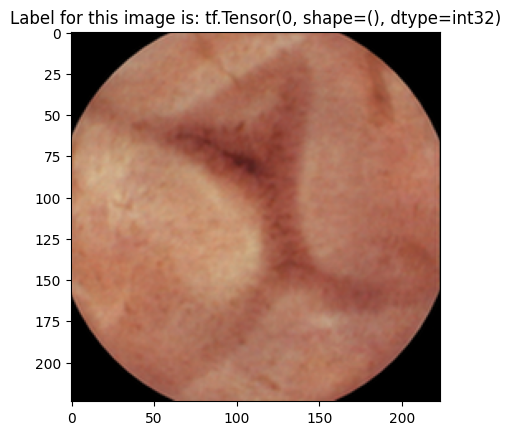

In [ ]:
"""**Random image from the dataset and its label**"""

import random
import matplotlib.pyplot as plt

# Generate a random image number
image_number = random.randint(0, len(aug_dataset) - 1)

# Display the image and its label
plt.imshow(aug_dataset[image_number])
plt.title("Label for this image is: " + str(aug_labels[image_number]))  # Use 'labels' instead of 'label'
plt.show()

#Using DenseNet121 Model

In [ ]:
import os
import cv2
import numpy as np
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.densenet import preprocess_input
from tqdm import tqdm
import tensorflow as tf
import albumentations as alb

In [ ]:

# # Define the custom augmentation pipeline with specific operations and parameters
custom_augmentation = alb.Compose([
    alb.HorizontalFlip(p=0.5),  # Apply horizontal flip with a probability of 0.5
    alb.VerticalFlip(p=0.5),  # Apply vertical flip with a probability of 0.5
    alb.Rotate(limit=30, p=0.5),  # Apply rotation with a limit of 30 degrees and a probability of 0.5
    alb.Resize(height=224, width=224, p=1)  # Resize the image to 224x224
])

In [ ]:
#Define the image directories
image_directory = '/content/drive/MyDrive/Challenge/WCEBleedGen (updated)'
output_directory = '/content/drive/MyDrive/Challenge/WCEBleedGen (updated)/extracted_features/'
#Define the image size
SIZE = (224, 224)

#Create output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)


In [ ]:
# Load the pre-trained DenseNet121 model
base_model = DenseNet121(weights='imagenet', include_top=False)

# Add a global average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)

# Create the feature extraction model
model = Model(inputs=base_model.input, outputs=x)

# Function to extract features from an image
def extract_features(img):
    img = cv2.resize(img, (224, 224))  # Resize the input image
    img = np.expand_dims(img, axis=0)  # Add a batch dimension
    img = preprocess_input(img)
    features = model.predict(img)
    return features

29084464/29084464 [==============================] - 2s 0us/step


In [ ]:
# Initialize lists to store features and labels
features_list = []
labels_list = []

# Process bleeding images with augmentation
bleeding_directory = '/content/drive/MyDrive/Challenge/WCEBleedGen (updated)/bleeding/Images'  # Update the directory path

for image_name in tqdm(os.listdir(bleeding_directory)):
    if image_name.endswith('.png'):
        image_path = os.path.join(bleeding_directory, image_name)
        img = cv2.imread(image_path)  # Load the image using OpenCV
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
        augmented_img = custom_augmentation(image=img)['image']  # Apply custom augmentation
        features = extract_features(augmented_img)  # Extract features
        features_list.append(features)
        labels_list.append(1)  # Assuming the label for bleeding images is 1


  0%|          | 0/1309 [00:00<?, ?it/s]

1/1 [==============================] - 5s 5s/step


  0%|          | 1/1309 [00:07<2:37:37,  7.23s/it]

1/1 [==============================] - 0s 49ms/step


  0%|          | 2/1309 [00:07<1:06:40,  3.06s/it]

1/1 [==============================] - 0s 47ms/step


  0%|          | 3/1309 [00:07<37:41,  1.73s/it]  

1/1 [==============================] - 0s 43ms/step


  0%|          | 4/1309 [00:07<24:00,  1.10s/it]

1/1 [==============================] - 0s 32ms/step


  0%|          | 5/1309 [00:07<16:08,  1.35it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 6/1309 [00:07<11:24,  1.90it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 7/1309 [00:07<08:26,  2.57it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 9/1309 [00:08<05:23,  4.02it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 11/1309 [00:08<04:03,  5.34it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 13/1309 [00:08<03:19,  6.51it/s]

1/1 [==============================] - 0s 59ms/step


  1%|          | 14/1309 [00:08<03:37,  5.95it/s]

1/1 [==============================] - 0s 52ms/step


  1%|          | 15/1309 [00:18<52:21,  2.43s/it]

1/1 [==============================] - 0s 52ms/step


  1%|          | 16/1309 [00:18<40:09,  1.86s/it]

1/1 [==============================] - 0s 47ms/step


  1%|▏         | 17/1309 [00:19<30:36,  1.42s/it]

1/1 [==============================] - 0s 67ms/step


  1%|▏         | 18/1309 [00:19<23:21,  1.09s/it]

1/1 [==============================] - 0s 94ms/step


  1%|▏         | 19/1309 [00:19<18:18,  1.17it/s]

1/1 [==============================] - 0s 60ms/step


  2%|▏         | 20/1309 [00:19<14:19,  1.50it/s]

1/1 [==============================] - 0s 58ms/step


  2%|▏         | 21/1309 [00:19<11:13,  1.91it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▏         | 22/1309 [00:20<09:15,  2.32it/s]

1/1 [==============================] - 0s 70ms/step


  2%|▏         | 23/1309 [00:20<07:55,  2.70it/s]

1/1 [==============================] - 0s 84ms/step


  2%|▏         | 24/1309 [00:20<07:01,  3.05it/s]

1/1 [==============================] - 0s 74ms/step


  2%|▏         | 25/1309 [00:20<06:25,  3.33it/s]

1/1 [==============================] - 0s 60ms/step


  2%|▏         | 26/1309 [00:20<05:38,  3.79it/s]

1/1 [==============================] - 0s 56ms/step


  2%|▏         | 27/1309 [00:21<04:58,  4.30it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▏         | 28/1309 [00:21<05:05,  4.20it/s]

1/1 [==============================] - 0s 70ms/step


  2%|▏         | 29/1309 [00:21<04:58,  4.29it/s]

1/1 [==============================] - 0s 45ms/step


  2%|▏         | 30/1309 [00:21<04:22,  4.87it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▏         | 31/1309 [00:21<04:10,  5.10it/s]

1/1 [==============================] - 0s 44ms/step


  2%|▏         | 32/1309 [00:22<04:00,  5.30it/s]

1/1 [==============================] - 0s 42ms/step


  3%|▎         | 33/1309 [00:22<03:35,  5.91it/s]

1/1 [==============================] - 0s 64ms/step


  3%|▎         | 34/1309 [00:22<03:32,  6.01it/s]

1/1 [==============================] - 0s 39ms/step


  3%|▎         | 35/1309 [00:22<03:31,  6.03it/s]

1/1 [==============================] - 0s 45ms/step


  3%|▎         | 36/1309 [00:22<03:19,  6.37it/s]

1/1 [==============================] - 0s 45ms/step


  3%|▎         | 37/1309 [00:22<03:31,  6.02it/s]

1/1 [==============================] - 0s 44ms/step


  3%|▎         | 38/1309 [00:23<03:18,  6.39it/s]

1/1 [==============================] - 0s 48ms/step


  3%|▎         | 39/1309 [00:23<03:15,  6.49it/s]

1/1 [==============================] - 0s 54ms/step


  3%|▎         | 40/1309 [00:23<03:11,  6.63it/s]

1/1 [==============================] - 0s 48ms/step


  3%|▎         | 41/1309 [00:23<03:07,  6.75it/s]

1/1 [==============================] - 0s 46ms/step


  3%|▎         | 42/1309 [00:23<03:05,  6.83it/s]

1/1 [==============================] - 0s 51ms/step


  3%|▎         | 43/1309 [00:23<03:04,  6.86it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 44/1309 [00:23<03:01,  6.99it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▎         | 46/1309 [00:24<02:45,  7.64it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 48/1309 [00:24<02:26,  8.58it/s]

1/1 [==============================] - 0s 39ms/step


  4%|▍         | 50/1309 [00:24<02:18,  9.07it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 52/1309 [00:24<02:12,  9.51it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 53/1309 [00:24<02:10,  9.59it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 55/1309 [00:24<02:08,  9.74it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 57/1309 [00:25<02:05, 10.00it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 59/1309 [00:25<02:03, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 61/1309 [00:25<02:04, 10.00it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 63/1309 [00:25<02:01, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 65/1309 [00:25<02:07,  9.76it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▌         | 67/1309 [00:26<02:03, 10.08it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 69/1309 [00:26<02:01, 10.22it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 71/1309 [00:26<02:01, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 73/1309 [00:26<01:59, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 75/1309 [00:26<01:58, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 77/1309 [00:27<01:56, 10.59it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 79/1309 [00:27<01:55, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 81/1309 [00:27<01:55, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 83/1309 [00:27<02:00, 10.15it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 85/1309 [00:27<01:58, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 87/1309 [00:28<01:57, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 89/1309 [00:28<01:56, 10.44it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 91/1309 [00:28<01:57, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 93/1309 [00:28<01:58, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 95/1309 [00:28<01:58, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 97/1309 [00:29<01:59, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 99/1309 [00:29<01:58, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 101/1309 [00:29<01:57, 10.28it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 103/1309 [00:29<01:59, 10.11it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 105/1309 [00:29<02:00, 10.00it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 107/1309 [00:30<01:57, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 109/1309 [00:30<01:57, 10.19it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 111/1309 [00:30<01:56, 10.27it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 113/1309 [00:30<01:56, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 115/1309 [00:30<01:56, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 117/1309 [00:31<01:55, 10.36it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 119/1309 [00:31<01:55, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 121/1309 [00:31<01:54, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 123/1309 [00:31<01:53, 10.43it/s]

1/1 [==============================] - 0s 47ms/step


 10%|▉         | 125/1309 [00:31<02:20,  8.45it/s]

1/1 [==============================] - 0s 51ms/step


 10%|▉         | 126/1309 [00:32<02:33,  7.72it/s]

1/1 [==============================] - 0s 46ms/step


 10%|▉         | 127/1309 [00:32<02:45,  7.14it/s]

1/1 [==============================] - 0s 43ms/step


 10%|▉         | 128/1309 [00:32<02:52,  6.83it/s]

1/1 [==============================] - 0s 48ms/step


 10%|▉         | 129/1309 [00:32<02:58,  6.60it/s]

1/1 [==============================] - 0s 56ms/step


 10%|▉         | 130/1309 [00:32<02:57,  6.66it/s]

1/1 [==============================] - 0s 52ms/step


 10%|█         | 131/1309 [00:32<03:06,  6.32it/s]

1/1 [==============================] - 0s 49ms/step


 10%|█         | 132/1309 [00:33<03:13,  6.09it/s]

1/1 [==============================] - 0s 46ms/step


 10%|█         | 133/1309 [00:33<03:16,  5.99it/s]

1/1 [==============================] - 0s 45ms/step


 10%|█         | 134/1309 [00:33<03:05,  6.34it/s]

1/1 [==============================] - 0s 40ms/step


 10%|█         | 135/1309 [00:33<03:07,  6.27it/s]

1/1 [==============================] - 0s 44ms/step


 10%|█         | 136/1309 [00:33<03:01,  6.46it/s]

1/1 [==============================] - 0s 39ms/step


 10%|█         | 137/1309 [00:33<02:55,  6.67it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█         | 138/1309 [00:34<02:52,  6.78it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█         | 139/1309 [00:34<02:48,  6.94it/s]

1/1 [==============================] - 0s 50ms/step


 11%|█         | 140/1309 [00:34<02:50,  6.84it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█         | 141/1309 [00:34<02:48,  6.94it/s]

1/1 [==============================] - 0s 50ms/step


 11%|█         | 142/1309 [00:34<02:47,  6.97it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█         | 143/1309 [00:34<02:56,  6.60it/s]

1/1 [==============================] - 0s 48ms/step


 11%|█         | 144/1309 [00:34<02:58,  6.52it/s]

1/1 [==============================] - 0s 48ms/step


 11%|█         | 145/1309 [00:35<02:53,  6.70it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 146/1309 [00:35<02:47,  6.96it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 148/1309 [00:35<02:21,  8.21it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 150/1309 [00:35<02:09,  8.95it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 152/1309 [00:35<02:03,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 153/1309 [00:35<02:02,  9.41it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 154/1309 [00:35<02:01,  9.53it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 155/1309 [00:36<02:01,  9.52it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 156/1309 [00:36<02:00,  9.53it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 158/1309 [00:36<01:57,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 159/1309 [00:36<01:57,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 160/1309 [00:36<01:59,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 161/1309 [00:36<01:58,  9.72it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 163/1309 [00:36<01:58,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 164/1309 [00:37<01:58,  9.66it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 166/1309 [00:37<01:55,  9.92it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 168/1309 [00:37<01:53, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 169/1309 [00:37<01:54,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 171/1309 [00:37<01:55,  9.87it/s]

1/1 [==============================] - 0s 45ms/step


 13%|█▎        | 173/1309 [00:37<01:57,  9.65it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 174/1309 [00:38<01:57,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 175/1309 [00:38<01:59,  9.53it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 177/1309 [00:38<01:55,  9.82it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 179/1309 [00:38<01:51, 10.13it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 181/1309 [00:38<01:48, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 183/1309 [00:38<01:49, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 185/1309 [00:39<01:51, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 187/1309 [00:39<01:49, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 189/1309 [00:39<01:53,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 191/1309 [00:39<01:51,  9.99it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 193/1309 [00:39<01:51,  9.98it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 194/1309 [00:40<01:53,  9.82it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 196/1309 [00:40<01:51, 10.02it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 198/1309 [00:40<01:49, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 200/1309 [00:40<01:54,  9.67it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 202/1309 [00:40<01:51,  9.88it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 204/1309 [00:41<01:53,  9.73it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 205/1309 [00:41<01:55,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 206/1309 [00:41<01:54,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 208/1309 [00:41<01:50,  9.97it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 209/1309 [00:41<01:51,  9.85it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 211/1309 [00:41<01:48, 10.10it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 213/1309 [00:41<01:46, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 215/1309 [00:42<01:53,  9.60it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 217/1309 [00:42<01:49,  9.95it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 219/1309 [00:42<01:48, 10.08it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 221/1309 [00:42<01:46, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 223/1309 [00:42<01:59,  9.08it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 224/1309 [00:43<01:58,  9.14it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 226/1309 [00:43<01:52,  9.63it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 227/1309 [00:43<01:52,  9.61it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 229/1309 [00:43<01:51,  9.67it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 231/1309 [00:43<01:48,  9.90it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 233/1309 [00:43<01:46, 10.06it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 235/1309 [00:44<01:52,  9.51it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 236/1309 [00:44<01:52,  9.51it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 238/1309 [00:44<01:49,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 240/1309 [00:44<01:46, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 242/1309 [00:44<01:45, 10.16it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▊        | 244/1309 [00:45<01:44, 10.18it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 246/1309 [00:45<01:59,  8.86it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▉        | 247/1309 [00:45<02:05,  8.44it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 248/1309 [00:45<02:08,  8.28it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▉        | 249/1309 [00:45<02:11,  8.04it/s]

1/1 [==============================] - 0s 48ms/step


 19%|█▉        | 250/1309 [00:45<02:27,  7.19it/s]

1/1 [==============================] - 0s 47ms/step


 19%|█▉        | 251/1309 [00:46<02:34,  6.83it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█▉        | 252/1309 [00:46<02:37,  6.73it/s]

1/1 [==============================] - 0s 46ms/step


 19%|█▉        | 253/1309 [00:46<02:44,  6.42it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█▉        | 254/1309 [00:46<02:52,  6.11it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█▉        | 255/1309 [00:46<02:45,  6.36it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█▉        | 256/1309 [00:46<02:37,  6.71it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█▉        | 257/1309 [00:47<02:31,  6.95it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█▉        | 258/1309 [00:47<02:41,  6.52it/s]

1/1 [==============================] - 0s 47ms/step


 20%|█▉        | 259/1309 [00:47<02:49,  6.18it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█▉        | 260/1309 [00:47<02:38,  6.63it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█▉        | 261/1309 [00:47<02:34,  6.79it/s]

1/1 [==============================] - 0s 53ms/step


 20%|██        | 262/1309 [00:47<02:34,  6.79it/s]

1/1 [==============================] - 0s 45ms/step


 20%|██        | 263/1309 [00:47<02:33,  6.82it/s]

1/1 [==============================] - 0s 52ms/step


 20%|██        | 264/1309 [00:48<02:50,  6.13it/s]

1/1 [==============================] - 0s 48ms/step


 20%|██        | 265/1309 [00:48<02:55,  5.94it/s]

1/1 [==============================] - 0s 54ms/step


 20%|██        | 266/1309 [00:48<02:51,  6.09it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 267/1309 [00:48<02:43,  6.39it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 269/1309 [00:48<02:14,  7.74it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 270/1309 [00:48<02:11,  7.93it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 272/1309 [00:49<01:59,  8.65it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 274/1309 [00:49<02:00,  8.56it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 276/1309 [00:49<01:53,  9.07it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 278/1309 [00:49<01:49,  9.40it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 279/1309 [00:49<01:50,  9.36it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 281/1309 [00:50<01:54,  9.01it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 283/1309 [00:50<01:48,  9.46it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 284/1309 [00:50<01:49,  9.39it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 286/1309 [00:50<01:45,  9.73it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 288/1309 [00:50<01:41, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 290/1309 [00:51<01:40, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 292/1309 [00:51<01:48,  9.40it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 293/1309 [00:51<01:47,  9.44it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 294/1309 [00:51<01:47,  9.45it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 295/1309 [00:51<01:46,  9.56it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 297/1309 [00:51<01:41,  9.94it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 299/1309 [00:51<01:40, 10.01it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 301/1309 [00:52<01:42,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 302/1309 [00:52<01:42,  9.84it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 303/1309 [00:52<01:43,  9.69it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 304/1309 [00:52<01:48,  9.30it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 305/1309 [00:52<01:47,  9.30it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 307/1309 [00:52<01:44,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 308/1309 [00:52<01:44,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 310/1309 [00:53<01:42,  9.77it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 312/1309 [00:53<01:42,  9.77it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 313/1309 [00:53<01:42,  9.76it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 314/1309 [00:53<01:43,  9.61it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 316/1309 [00:53<01:40,  9.92it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 318/1309 [00:53<01:38, 10.05it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 320/1309 [00:54<01:38, 10.08it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 322/1309 [00:54<01:36, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 324/1309 [00:54<01:34, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 326/1309 [00:54<01:34, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 328/1309 [00:54<01:35, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 330/1309 [00:55<01:33, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 332/1309 [00:55<01:32, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 334/1309 [00:55<01:31, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 336/1309 [00:55<01:33, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 338/1309 [00:56<02:13,  7.29it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 340/1309 [00:56<02:01,  7.97it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 342/1309 [00:56<01:52,  8.58it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 343/1309 [00:56<01:49,  8.80it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 345/1309 [00:56<01:45,  9.14it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 347/1309 [00:56<01:41,  9.50it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 349/1309 [00:57<01:39,  9.68it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 351/1309 [00:57<01:36,  9.94it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 353/1309 [00:57<01:34, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 355/1309 [00:57<01:38,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 356/1309 [00:57<01:37,  9.74it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 358/1309 [00:58<01:34, 10.02it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 360/1309 [00:58<01:32, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 362/1309 [00:58<01:30, 10.41it/s]

1/1 [==============================] - 0s 52ms/step


 28%|██▊       | 364/1309 [00:58<01:39,  9.48it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 365/1309 [00:58<01:45,  8.95it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 366/1309 [00:58<01:52,  8.37it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 367/1309 [00:59<01:57,  8.04it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 368/1309 [00:59<02:10,  7.21it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 369/1309 [00:59<02:10,  7.20it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 370/1309 [00:59<02:08,  7.28it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 371/1309 [00:59<02:08,  7.29it/s]

1/1 [==============================] - 0s 47ms/step


 28%|██▊       | 372/1309 [00:59<02:10,  7.15it/s]

1/1 [==============================] - 0s 57ms/step


 28%|██▊       | 373/1309 [01:00<02:14,  6.94it/s]

1/1 [==============================] - 0s 45ms/step


 29%|██▊       | 374/1309 [01:00<02:18,  6.74it/s]

1/1 [==============================] - 0s 50ms/step


 29%|██▊       | 375/1309 [01:00<02:19,  6.70it/s]

1/1 [==============================] - 0s 44ms/step


 29%|██▊       | 376/1309 [01:00<02:16,  6.82it/s]

1/1 [==============================] - 0s 44ms/step


 29%|██▉       | 377/1309 [01:00<02:17,  6.77it/s]

1/1 [==============================] - 0s 60ms/step


 29%|██▉       | 378/1309 [01:00<02:18,  6.71it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 379/1309 [01:00<02:24,  6.46it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▉       | 380/1309 [01:01<02:28,  6.26it/s]

1/1 [==============================] - 0s 45ms/step


 29%|██▉       | 381/1309 [01:01<02:24,  6.42it/s]

1/1 [==============================] - 0s 50ms/step


 29%|██▉       | 382/1309 [01:01<02:33,  6.02it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▉       | 383/1309 [01:01<02:28,  6.25it/s]

1/1 [==============================] - 0s 48ms/step


 29%|██▉       | 384/1309 [01:01<02:24,  6.39it/s]

1/1 [==============================] - 0s 49ms/step


 29%|██▉       | 385/1309 [01:01<02:33,  6.03it/s]

1/1 [==============================] - 0s 55ms/step


 29%|██▉       | 386/1309 [01:02<02:39,  5.79it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██▉       | 387/1309 [01:02<02:30,  6.12it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 389/1309 [01:02<02:02,  7.51it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 390/1309 [01:02<01:58,  7.76it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 392/1309 [01:02<01:47,  8.55it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 393/1309 [01:02<01:44,  8.74it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 395/1309 [01:03<01:45,  8.67it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 396/1309 [01:03<01:46,  8.60it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 398/1309 [01:03<01:38,  9.23it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 399/1309 [01:03<01:40,  9.09it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 400/1309 [01:03<01:38,  9.27it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 401/1309 [01:03<01:37,  9.33it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 402/1309 [01:03<01:35,  9.45it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 403/1309 [01:03<01:34,  9.54it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 405/1309 [01:04<01:30,  9.96it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 406/1309 [01:04<01:31,  9.85it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 407/1309 [01:04<01:32,  9.77it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 408/1309 [01:04<01:33,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 409/1309 [01:04<01:32,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 411/1309 [01:04<01:29, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 412/1309 [01:04<01:29, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 413/1309 [01:04<01:31,  9.75it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 415/1309 [01:05<01:29, 10.03it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 417/1309 [01:05<01:28, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 419/1309 [01:05<01:28, 10.11it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 421/1309 [01:05<01:27, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 423/1309 [01:05<01:30,  9.83it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 425/1309 [01:06<01:27, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 427/1309 [01:06<01:27, 10.04it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 429/1309 [01:06<01:26, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 431/1309 [01:06<01:26, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 433/1309 [01:06<01:25, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 435/1309 [01:07<01:28,  9.85it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 437/1309 [01:07<01:27, 10.01it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 439/1309 [01:07<01:25, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 441/1309 [01:07<01:23, 10.33it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 443/1309 [01:07<01:24, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 445/1309 [01:08<01:26,  9.96it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 447/1309 [01:08<01:25, 10.11it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 449/1309 [01:08<01:23, 10.31it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 451/1309 [01:08<01:22, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 453/1309 [01:08<01:22, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 455/1309 [01:09<01:23, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 457/1309 [01:09<01:22, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 459/1309 [01:09<01:22, 10.35it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 461/1309 [01:09<01:21, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 463/1309 [01:09<01:22, 10.25it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 465/1309 [01:10<01:23, 10.15it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 467/1309 [01:10<01:21, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 469/1309 [01:10<01:20, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 471/1309 [01:10<01:21, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 473/1309 [01:10<01:21, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 475/1309 [01:11<01:23, 10.03it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 477/1309 [01:11<01:25,  9.73it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 479/1309 [01:11<01:22, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 481/1309 [01:11<01:22, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 483/1309 [01:11<01:21, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 485/1309 [01:12<01:21, 10.15it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 487/1309 [01:12<01:20, 10.20it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 489/1309 [01:12<01:33,  8.80it/s]

1/1 [==============================] - 0s 49ms/step


 37%|███▋      | 490/1309 [01:12<01:44,  7.82it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 491/1309 [01:12<01:47,  7.64it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 492/1309 [01:13<01:48,  7.50it/s]

1/1 [==============================] - 0s 54ms/step


 38%|███▊      | 493/1309 [01:13<01:51,  7.30it/s]

1/1 [==============================] - 0s 44ms/step


 38%|███▊      | 494/1309 [01:13<01:55,  7.07it/s]

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 495/1309 [01:13<01:56,  6.98it/s]

1/1 [==============================] - 0s 53ms/step


 38%|███▊      | 496/1309 [01:13<01:59,  6.81it/s]

1/1 [==============================] - 0s 52ms/step


 38%|███▊      | 497/1309 [01:13<02:00,  6.73it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 498/1309 [01:13<02:10,  6.23it/s]

1/1 [==============================] - 0s 44ms/step


 38%|███▊      | 499/1309 [01:14<02:07,  6.34it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 500/1309 [01:14<02:04,  6.51it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 501/1309 [01:14<02:08,  6.27it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 502/1309 [01:14<02:00,  6.70it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 503/1309 [01:14<01:55,  6.97it/s]

1/1 [==============================] - 0s 44ms/step


 39%|███▊      | 504/1309 [01:14<01:54,  7.03it/s]

1/1 [==============================] - 0s 52ms/step


 39%|███▊      | 505/1309 [01:15<02:04,  6.46it/s]

1/1 [==============================] - 0s 51ms/step


 39%|███▊      | 506/1309 [01:15<02:04,  6.44it/s]

1/1 [==============================] - 0s 52ms/step


 39%|███▊      | 507/1309 [01:15<02:07,  6.30it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███▉      | 508/1309 [01:15<02:05,  6.36it/s]

1/1 [==============================] - 0s 45ms/step


 39%|███▉      | 509/1309 [01:15<02:13,  5.99it/s]

1/1 [==============================] - 0s 43ms/step


 39%|███▉      | 510/1309 [01:15<02:07,  6.26it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 511/1309 [01:15<02:02,  6.52it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 513/1309 [01:16<01:39,  8.00it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 515/1309 [01:16<01:33,  8.54it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 516/1309 [01:16<01:30,  8.79it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 517/1309 [01:16<01:28,  8.93it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 518/1309 [01:16<01:28,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 519/1309 [01:16<01:26,  9.08it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 521/1309 [01:16<01:23,  9.40it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 523/1309 [01:17<01:20,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 524/1309 [01:17<01:20,  9.80it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 525/1309 [01:17<01:21,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 526/1309 [01:17<01:22,  9.50it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 527/1309 [01:17<01:28,  8.81it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 528/1309 [01:17<01:33,  8.32it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 529/1309 [01:17<01:29,  8.67it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 530/1309 [01:17<01:27,  8.89it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 531/1309 [01:18<01:26,  9.05it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 532/1309 [01:18<01:23,  9.29it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 533/1309 [01:18<01:22,  9.42it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 534/1309 [01:18<01:25,  9.01it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 535/1309 [01:18<01:25,  9.07it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 537/1309 [01:18<01:19,  9.69it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 539/1309 [01:18<01:17,  9.92it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 540/1309 [01:18<01:17,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 541/1309 [01:19<01:17,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 543/1309 [01:19<01:16, 10.00it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 544/1309 [01:19<01:19,  9.67it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 545/1309 [01:19<01:18,  9.72it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 547/1309 [01:19<01:16,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 548/1309 [01:19<01:16,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 550/1309 [01:19<01:15, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 552/1309 [01:20<01:14, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 554/1309 [01:20<01:14, 10.12it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 556/1309 [01:20<01:15, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 558/1309 [01:20<01:14, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 560/1309 [01:21<01:16,  9.77it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 561/1309 [01:21<01:16,  9.75it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 562/1309 [01:21<01:17,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 563/1309 [01:21<01:17,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 564/1309 [01:21<01:18,  9.45it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 565/1309 [01:21<01:20,  9.28it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 567/1309 [01:21<01:16,  9.66it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 568/1309 [01:21<01:17,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 569/1309 [01:21<01:17,  9.53it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 571/1309 [01:22<01:15,  9.73it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 573/1309 [01:22<01:12, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 574/1309 [01:22<01:13,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 575/1309 [01:22<01:15,  9.68it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 576/1309 [01:22<01:15,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 578/1309 [01:22<01:13,  9.92it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 580/1309 [01:23<01:12, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 581/1309 [01:23<01:13,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 583/1309 [01:23<01:11, 10.17it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 585/1309 [01:23<01:12,  9.96it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 586/1309 [01:23<01:12,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 587/1309 [01:23<01:14,  9.67it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 589/1309 [01:23<01:13,  9.82it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 590/1309 [01:24<01:13,  9.79it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 591/1309 [01:24<01:13,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 592/1309 [01:24<01:14,  9.67it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 593/1309 [01:24<01:15,  9.54it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 594/1309 [01:24<01:14,  9.66it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 595/1309 [01:24<01:16,  9.38it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 597/1309 [01:24<01:12,  9.86it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 598/1309 [01:24<01:13,  9.70it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 599/1309 [01:25<01:13,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 600/1309 [01:25<01:18,  9.01it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 601/1309 [01:25<01:18,  8.97it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 602/1309 [01:25<01:17,  9.12it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 603/1309 [01:25<01:16,  9.20it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 605/1309 [01:25<01:15,  9.33it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▋     | 606/1309 [01:25<01:15,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 607/1309 [01:25<01:16,  9.12it/s]

1/1 [==============================] - 0s 47ms/step


 46%|████▋     | 608/1309 [01:26<01:22,  8.45it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 609/1309 [01:26<01:28,  7.91it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 610/1309 [01:26<01:41,  6.86it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 611/1309 [01:26<01:46,  6.56it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 612/1309 [01:26<01:45,  6.60it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 613/1309 [01:26<01:43,  6.70it/s]

1/1 [==============================] - 0s 45ms/step


 47%|████▋     | 614/1309 [01:27<01:44,  6.62it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 615/1309 [01:27<01:51,  6.21it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 616/1309 [01:27<01:58,  5.87it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 617/1309 [01:27<01:50,  6.26it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 618/1309 [01:27<01:46,  6.49it/s]

1/1 [==============================] - 0s 45ms/step


 47%|████▋     | 619/1309 [01:27<01:46,  6.49it/s]

1/1 [==============================] - 0s 53ms/step


 47%|████▋     | 620/1309 [01:27<01:45,  6.56it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 621/1309 [01:28<01:45,  6.54it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 622/1309 [01:28<01:42,  6.71it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 623/1309 [01:28<01:48,  6.31it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 624/1309 [01:28<01:43,  6.64it/s]

1/1 [==============================] - 0s 42ms/step


 48%|████▊     | 625/1309 [01:28<01:43,  6.60it/s]

1/1 [==============================] - 0s 52ms/step


 48%|████▊     | 626/1309 [01:28<01:54,  5.96it/s]

1/1 [==============================] - 0s 46ms/step


 48%|████▊     | 627/1309 [01:29<01:56,  5.83it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 628/1309 [01:29<01:51,  6.08it/s]

1/1 [==============================] - 0s 49ms/step


 48%|████▊     | 629/1309 [01:29<01:55,  5.90it/s]

1/1 [==============================] - 0s 49ms/step


 48%|████▊     | 630/1309 [01:29<01:52,  6.03it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 631/1309 [01:29<01:48,  6.25it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 632/1309 [01:29<01:39,  6.78it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 633/1309 [01:29<01:31,  7.42it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 634/1309 [01:30<01:25,  7.93it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 635/1309 [01:30<01:21,  8.29it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 636/1309 [01:30<01:17,  8.73it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 637/1309 [01:30<01:14,  9.02it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 638/1309 [01:30<01:12,  9.27it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 639/1309 [01:30<01:11,  9.38it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 640/1309 [01:30<01:10,  9.46it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 641/1309 [01:30<01:10,  9.53it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 642/1309 [01:30<01:16,  8.69it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 643/1309 [01:31<01:13,  9.02it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 644/1309 [01:31<01:19,  8.33it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 646/1309 [01:31<01:12,  9.19it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 647/1309 [01:31<01:10,  9.35it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 649/1309 [01:31<01:07,  9.73it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 651/1309 [01:31<01:06,  9.88it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 652/1309 [01:31<01:08,  9.53it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 653/1309 [01:32<01:08,  9.52it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 655/1309 [01:32<01:06,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 657/1309 [01:32<01:05,  9.98it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 658/1309 [01:32<01:05,  9.87it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 660/1309 [01:32<01:04, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 661/1309 [01:32<01:05,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 662/1309 [01:32<01:06,  9.80it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 664/1309 [01:33<01:04, 10.03it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 665/1309 [01:33<01:04,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 667/1309 [01:33<01:03, 10.04it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 669/1309 [01:33<01:03, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 671/1309 [01:33<01:02, 10.15it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 673/1309 [01:34<01:03, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 674/1309 [01:34<01:04,  9.91it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 675/1309 [01:34<01:03,  9.92it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 676/1309 [01:34<01:03,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 677/1309 [01:34<01:03,  9.90it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 679/1309 [01:34<01:02, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 681/1309 [01:34<01:02, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 683/1309 [01:35<01:03,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 684/1309 [01:35<01:03,  9.89it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 686/1309 [01:35<01:04,  9.64it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 688/1309 [01:35<01:04,  9.69it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 689/1309 [01:35<01:08,  9.02it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 690/1309 [01:35<01:07,  9.18it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 692/1309 [01:36<01:05,  9.38it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 693/1309 [01:36<01:04,  9.48it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 695/1309 [01:36<01:02,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 696/1309 [01:36<01:03,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 697/1309 [01:36<01:04,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 698/1309 [01:36<01:03,  9.56it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 699/1309 [01:36<01:03,  9.64it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 700/1309 [01:36<01:03,  9.64it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 702/1309 [01:37<01:02,  9.70it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 703/1309 [01:37<01:02,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 704/1309 [01:37<01:01,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 705/1309 [01:37<01:01,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 706/1309 [01:37<01:02,  9.67it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 707/1309 [01:37<01:01,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 708/1309 [01:37<01:01,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 709/1309 [01:37<01:08,  8.78it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 710/1309 [01:37<01:06,  9.05it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 711/1309 [01:38<01:04,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 712/1309 [01:38<01:06,  8.98it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 713/1309 [01:38<01:05,  9.10it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 714/1309 [01:38<01:03,  9.32it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 715/1309 [01:38<01:03,  9.30it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 716/1309 [01:38<01:02,  9.49it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 718/1309 [01:38<00:59,  9.88it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 719/1309 [01:38<01:00,  9.81it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 721/1309 [01:39<00:58, 10.12it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 722/1309 [01:39<00:59,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 723/1309 [01:39<00:59,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 724/1309 [01:39<01:00,  9.61it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 725/1309 [01:39<01:00,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 726/1309 [01:39<01:03,  9.23it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 727/1309 [01:39<01:02,  9.32it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▌    | 728/1309 [01:39<01:13,  7.88it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████▌    | 729/1309 [01:40<01:17,  7.51it/s]

1/1 [==============================] - 0s 59ms/step


 56%|█████▌    | 730/1309 [01:40<01:21,  7.07it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▌    | 731/1309 [01:40<01:27,  6.57it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▌    | 732/1309 [01:40<01:26,  6.68it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▌    | 733/1309 [01:40<01:27,  6.58it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▌    | 734/1309 [01:40<01:26,  6.63it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 735/1309 [01:40<01:30,  6.34it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▌    | 736/1309 [01:41<01:35,  6.00it/s]

1/1 [==============================] - 0s 58ms/step


 56%|█████▋    | 737/1309 [01:41<01:35,  6.01it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▋    | 738/1309 [01:41<01:31,  6.24it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▋    | 739/1309 [01:41<01:28,  6.47it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 740/1309 [01:41<01:27,  6.48it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 741/1309 [01:41<01:28,  6.44it/s]

1/1 [==============================] - 0s 47ms/step


 57%|█████▋    | 742/1309 [01:42<01:28,  6.43it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 743/1309 [01:42<01:25,  6.60it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 744/1309 [01:42<01:25,  6.62it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 745/1309 [01:42<01:23,  6.76it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 746/1309 [01:42<01:29,  6.29it/s]

1/1 [==============================] - 0s 51ms/step


 57%|█████▋    | 747/1309 [01:42<01:28,  6.36it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 748/1309 [01:43<01:26,  6.50it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 749/1309 [01:43<01:25,  6.52it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 750/1309 [01:43<01:24,  6.65it/s]

1/1 [==============================] - 0s 55ms/step


 57%|█████▋    | 751/1309 [01:43<01:33,  5.99it/s]

1/1 [==============================] - 0s 58ms/step


 57%|█████▋    | 752/1309 [01:43<01:36,  5.75it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 753/1309 [01:43<01:25,  6.50it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 754/1309 [01:43<01:16,  7.23it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 755/1309 [01:44<01:10,  7.85it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 756/1309 [01:44<01:06,  8.35it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 757/1309 [01:44<01:03,  8.74it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 758/1309 [01:44<01:00,  9.08it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 759/1309 [01:44<01:00,  9.04it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 760/1309 [01:44<01:01,  8.98it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 761/1309 [01:44<00:59,  9.14it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 763/1309 [01:44<00:56,  9.66it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 765/1309 [01:45<00:54,  9.99it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 766/1309 [01:45<00:56,  9.61it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 767/1309 [01:45<00:55,  9.70it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 768/1309 [01:45<00:55,  9.75it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▊    | 769/1309 [01:45<00:58,  9.28it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 770/1309 [01:45<00:57,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 771/1309 [01:45<00:56,  9.50it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 772/1309 [01:45<00:56,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 773/1309 [01:45<00:56,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 774/1309 [01:45<00:56,  9.54it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 776/1309 [01:46<00:53,  9.94it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 777/1309 [01:46<00:53,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 778/1309 [01:46<00:54,  9.80it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 779/1309 [01:46<00:55,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 780/1309 [01:46<00:55,  9.57it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 781/1309 [01:46<00:55,  9.54it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 782/1309 [01:46<00:54,  9.61it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 783/1309 [01:46<00:54,  9.67it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 784/1309 [01:47<00:54,  9.69it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 785/1309 [01:47<00:54,  9.53it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 786/1309 [01:47<00:55,  9.38it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 787/1309 [01:47<00:56,  9.19it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 788/1309 [01:47<00:55,  9.40it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 789/1309 [01:47<00:56,  9.14it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 790/1309 [01:47<00:55,  9.28it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 791/1309 [01:47<00:55,  9.32it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 792/1309 [01:47<00:55,  9.32it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 793/1309 [01:47<00:55,  9.37it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 794/1309 [01:48<00:55,  9.21it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 795/1309 [01:48<00:55,  9.22it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 796/1309 [01:48<00:54,  9.38it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 797/1309 [01:48<00:54,  9.32it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 798/1309 [01:48<00:56,  9.06it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 799/1309 [01:48<00:56,  9.08it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 800/1309 [01:48<00:55,  9.11it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 802/1309 [01:48<00:53,  9.53it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 804/1309 [01:49<00:50,  9.98it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 805/1309 [01:49<00:50,  9.96it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 806/1309 [01:49<00:53,  9.43it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 807/1309 [01:49<00:52,  9.47it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 808/1309 [01:49<00:53,  9.28it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 809/1309 [01:49<00:53,  9.28it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 810/1309 [01:49<00:53,  9.37it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 811/1309 [01:49<00:52,  9.43it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 812/1309 [01:50<00:52,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 813/1309 [01:50<00:52,  9.47it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 814/1309 [01:50<00:52,  9.51it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 815/1309 [01:50<00:53,  9.26it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 816/1309 [01:50<00:52,  9.33it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 817/1309 [01:50<00:52,  9.45it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 818/1309 [01:50<00:53,  9.26it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 819/1309 [01:50<00:52,  9.40it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 820/1309 [01:50<00:52,  9.28it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 821/1309 [01:50<00:51,  9.46it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 822/1309 [01:51<00:51,  9.52it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 823/1309 [01:51<00:50,  9.65it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 824/1309 [01:51<00:51,  9.47it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 825/1309 [01:51<00:50,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 826/1309 [01:51<00:50,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 827/1309 [01:51<00:50,  9.59it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 828/1309 [01:51<00:52,  9.20it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 829/1309 [01:51<00:52,  9.14it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 830/1309 [01:51<00:52,  9.11it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 831/1309 [01:52<00:52,  9.09it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 832/1309 [01:52<00:51,  9.23it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▎   | 833/1309 [01:52<00:51,  9.22it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 835/1309 [01:52<00:49,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 836/1309 [01:52<00:48,  9.72it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 837/1309 [01:52<00:53,  8.79it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 839/1309 [01:52<00:50,  9.38it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 841/1309 [01:53<00:49,  9.53it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 842/1309 [01:53<00:48,  9.56it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 843/1309 [01:53<00:48,  9.56it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 844/1309 [01:53<00:48,  9.59it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 846/1309 [01:53<00:46,  9.98it/s]

1/1 [==============================] - 0s 56ms/step


 65%|██████▍   | 847/1309 [01:53<00:51,  9.03it/s]

1/1 [==============================] - 0s 50ms/step


 65%|██████▍   | 848/1309 [01:53<00:55,  8.38it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████▍   | 849/1309 [01:54<00:58,  7.86it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▍   | 850/1309 [01:54<00:59,  7.67it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▌   | 851/1309 [01:54<01:07,  6.76it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▌   | 852/1309 [01:54<01:12,  6.31it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▌   | 853/1309 [01:54<01:08,  6.65it/s]

1/1 [==============================] - 0s 52ms/step


 65%|██████▌   | 854/1309 [01:54<01:10,  6.46it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▌   | 855/1309 [01:55<01:14,  6.13it/s]

1/1 [==============================] - 0s 52ms/step


 65%|██████▌   | 856/1309 [01:55<01:11,  6.30it/s]

1/1 [==============================] - 0s 48ms/step


 65%|██████▌   | 857/1309 [01:55<01:08,  6.57it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 858/1309 [01:55<01:12,  6.24it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 859/1309 [01:55<01:13,  6.13it/s]

1/1 [==============================] - 0s 67ms/step


 66%|██████▌   | 860/1309 [01:55<01:16,  5.86it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 861/1309 [01:55<01:11,  6.27it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 862/1309 [01:56<01:08,  6.50it/s]

1/1 [==============================] - 0s 51ms/step


 66%|██████▌   | 863/1309 [01:56<01:13,  6.11it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 864/1309 [01:56<01:09,  6.43it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 865/1309 [01:56<01:08,  6.47it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▌   | 866/1309 [01:56<01:12,  6.10it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 867/1309 [01:56<01:10,  6.28it/s]

1/1 [==============================] - 0s 58ms/step


 66%|██████▋   | 868/1309 [01:57<01:10,  6.24it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████▋   | 869/1309 [01:57<01:15,  5.84it/s]

1/1 [==============================] - 0s 50ms/step


 66%|██████▋   | 870/1309 [01:57<01:17,  5.68it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 871/1309 [01:57<01:10,  6.26it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 872/1309 [01:57<01:02,  7.01it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 873/1309 [01:57<00:56,  7.68it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 874/1309 [01:57<00:54,  7.91it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 875/1309 [01:58<00:51,  8.39it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 876/1309 [01:58<00:49,  8.67it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 877/1309 [01:58<00:48,  8.95it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 878/1309 [01:58<00:47,  9.11it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 879/1309 [01:58<00:46,  9.28it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 880/1309 [01:58<00:45,  9.43it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 881/1309 [01:58<00:44,  9.53it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 882/1309 [01:58<00:45,  9.39it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 883/1309 [01:58<00:46,  9.22it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 884/1309 [01:58<00:46,  9.13it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 886/1309 [01:59<00:44,  9.60it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 887/1309 [01:59<00:44,  9.58it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 888/1309 [01:59<00:45,  9.16it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 890/1309 [01:59<00:43,  9.60it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 891/1309 [01:59<00:43,  9.64it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 893/1309 [01:59<00:41,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 894/1309 [02:00<00:42,  9.71it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 896/1309 [02:00<00:42,  9.78it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 898/1309 [02:00<00:41, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 899/1309 [02:00<00:42,  9.76it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 900/1309 [02:00<00:42,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 901/1309 [02:00<00:43,  9.38it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 902/1309 [02:00<00:44,  9.21it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 903/1309 [02:00<00:44,  9.23it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 904/1309 [02:01<00:44,  9.02it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 905/1309 [02:01<00:44,  9.12it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 907/1309 [02:01<00:43,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 908/1309 [02:01<00:42,  9.42it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 909/1309 [02:01<00:42,  9.45it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 910/1309 [02:01<00:41,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 911/1309 [02:01<00:41,  9.57it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 912/1309 [02:01<00:41,  9.62it/s]

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 913/1309 [02:02<00:46,  8.57it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 914/1309 [02:02<00:44,  8.87it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 916/1309 [02:02<00:41,  9.36it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 917/1309 [02:02<00:41,  9.36it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 918/1309 [02:02<00:41,  9.43it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 920/1309 [02:02<00:40,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 921/1309 [02:02<00:40,  9.65it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 922/1309 [02:02<00:40,  9.64it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 923/1309 [02:03<00:41,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 925/1309 [02:03<00:39,  9.71it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 926/1309 [02:03<00:39,  9.76it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 927/1309 [02:03<00:39,  9.67it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 928/1309 [02:03<00:39,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 929/1309 [02:03<00:40,  9.29it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 930/1309 [02:03<00:40,  9.36it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 931/1309 [02:03<00:40,  9.30it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 932/1309 [02:04<00:41,  9.18it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 933/1309 [02:04<00:41,  8.96it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 934/1309 [02:04<00:40,  9.20it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 935/1309 [02:04<00:40,  9.19it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 936/1309 [02:04<00:40,  9.27it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 938/1309 [02:04<00:38,  9.59it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 939/1309 [02:04<00:38,  9.54it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 940/1309 [02:04<00:38,  9.47it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 941/1309 [02:05<00:38,  9.44it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 942/1309 [02:05<00:38,  9.48it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 943/1309 [02:05<00:39,  9.17it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 944/1309 [02:05<00:39,  9.20it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 945/1309 [02:05<00:39,  9.24it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 947/1309 [02:05<00:37,  9.67it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 948/1309 [02:05<00:37,  9.61it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 949/1309 [02:05<00:37,  9.67it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 950/1309 [02:05<00:38,  9.22it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 951/1309 [02:06<00:38,  9.39it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 952/1309 [02:06<00:42,  8.35it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 954/1309 [02:06<00:38,  9.15it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 956/1309 [02:06<00:36,  9.61it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 958/1309 [02:06<00:35,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 959/1309 [02:06<00:36,  9.50it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 960/1309 [02:07<00:36,  9.43it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 962/1309 [02:07<00:36,  9.53it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 964/1309 [02:07<00:34,  9.91it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 965/1309 [02:07<00:34,  9.84it/s]

1/1 [==============================] - 0s 48ms/step


 74%|███████▍  | 966/1309 [02:07<00:37,  9.17it/s]

1/1 [==============================] - 0s 45ms/step


 74%|███████▍  | 967/1309 [02:07<00:43,  7.85it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 968/1309 [02:07<00:44,  7.67it/s]

1/1 [==============================] - 0s 47ms/step


 74%|███████▍  | 969/1309 [02:08<00:50,  6.80it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▍  | 970/1309 [02:08<00:49,  6.89it/s]

1/1 [==============================] - 0s 50ms/step


 74%|███████▍  | 971/1309 [02:08<00:53,  6.33it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 972/1309 [02:08<00:51,  6.58it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 973/1309 [02:08<00:54,  6.19it/s]

1/1 [==============================] - 0s 44ms/step


 74%|███████▍  | 974/1309 [02:09<00:55,  5.99it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▍  | 975/1309 [02:09<00:52,  6.35it/s]

1/1 [==============================] - 0s 61ms/step


 75%|███████▍  | 976/1309 [02:09<00:52,  6.34it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████▍  | 977/1309 [02:09<00:57,  5.74it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▍  | 978/1309 [02:09<00:56,  5.84it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████▍  | 979/1309 [02:09<00:52,  6.27it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 980/1309 [02:09<00:51,  6.37it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▍  | 981/1309 [02:10<00:50,  6.54it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▌  | 982/1309 [02:10<00:48,  6.69it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▌  | 983/1309 [02:10<00:50,  6.48it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████▌  | 984/1309 [02:10<00:53,  6.12it/s]

1/1 [==============================] - 0s 50ms/step


 75%|███████▌  | 985/1309 [02:10<00:54,  5.97it/s]

1/1 [==============================] - 0s 57ms/step


 75%|███████▌  | 986/1309 [02:10<00:53,  6.06it/s]

1/1 [==============================] - 0s 54ms/step


 75%|███████▌  | 987/1309 [02:11<00:53,  6.07it/s]

1/1 [==============================] - 0s 51ms/step


 75%|███████▌  | 988/1309 [02:11<00:53,  6.04it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 989/1309 [02:11<00:51,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 990/1309 [02:11<00:46,  6.79it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 991/1309 [02:11<00:44,  7.07it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 992/1309 [02:11<00:41,  7.60it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 993/1309 [02:11<00:38,  8.13it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 994/1309 [02:11<00:36,  8.56it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 995/1309 [02:12<00:36,  8.51it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 996/1309 [02:12<00:35,  8.89it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 997/1309 [02:12<00:34,  9.01it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 998/1309 [02:12<00:33,  9.26it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 999/1309 [02:12<00:34,  9.02it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 1000/1309 [02:12<00:33,  9.13it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 1001/1309 [02:12<00:33,  9.22it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 1002/1309 [02:12<00:32,  9.41it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1003/1309 [02:12<00:32,  9.35it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 1004/1309 [02:13<00:33,  9.05it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1005/1309 [02:13<00:32,  9.31it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 1006/1309 [02:13<00:32,  9.33it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 1007/1309 [02:13<00:32,  9.30it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 1008/1309 [02:13<00:33,  9.06it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 1009/1309 [02:13<00:32,  9.26it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1010/1309 [02:13<00:32,  9.21it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 1011/1309 [02:13<00:32,  9.08it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1012/1309 [02:13<00:32,  9.26it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 1013/1309 [02:14<00:32,  9.20it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1014/1309 [02:14<00:31,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 1015/1309 [02:14<00:31,  9.40it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1016/1309 [02:14<00:30,  9.49it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1017/1309 [02:14<00:30,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 1018/1309 [02:14<00:31,  9.22it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1019/1309 [02:14<00:31,  9.32it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 1020/1309 [02:14<00:30,  9.36it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1021/1309 [02:14<00:30,  9.47it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 1022/1309 [02:14<00:31,  9.20it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 1023/1309 [02:15<00:31,  9.09it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1024/1309 [02:15<00:30,  9.23it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1026/1309 [02:15<00:29,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 1028/1309 [02:15<00:28,  9.75it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 1029/1309 [02:15<00:29,  9.65it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 1031/1309 [02:15<00:28,  9.67it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 1032/1309 [02:16<00:28,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 1033/1309 [02:16<00:29,  9.46it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1034/1309 [02:16<00:28,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 1035/1309 [02:16<00:28,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 1036/1309 [02:16<00:28,  9.58it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 1037/1309 [02:16<00:29,  9.12it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 1038/1309 [02:16<00:29,  9.22it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 1039/1309 [02:16<00:28,  9.32it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 1040/1309 [02:16<00:29,  9.17it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 1041/1309 [02:17<00:29,  9.14it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 1042/1309 [02:17<00:29,  9.16it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 1043/1309 [02:17<00:29,  9.14it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 1044/1309 [02:17<00:28,  9.25it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 1045/1309 [02:17<00:27,  9.43it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 1046/1309 [02:17<00:27,  9.42it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 1047/1309 [02:17<00:28,  9.24it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 1048/1309 [02:17<00:27,  9.38it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 1049/1309 [02:17<00:27,  9.43it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 1050/1309 [02:17<00:28,  8.96it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 1051/1309 [02:18<00:28,  9.03it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 1052/1309 [02:18<00:28,  9.14it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 1053/1309 [02:18<00:27,  9.26it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 1054/1309 [02:18<00:27,  9.29it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 1055/1309 [02:18<00:27,  9.21it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 1056/1309 [02:18<00:27,  9.07it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 1057/1309 [02:18<00:27,  9.06it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 1058/1309 [02:18<00:27,  9.12it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 1059/1309 [02:18<00:27,  9.14it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 1060/1309 [02:19<00:30,  8.19it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 1062/1309 [02:19<00:27,  9.03it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 1063/1309 [02:19<00:26,  9.12it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 1064/1309 [02:19<00:26,  9.19it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 1066/1309 [02:19<00:26,  9.28it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1067/1309 [02:19<00:26,  9.18it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 1068/1309 [02:19<00:26,  9.16it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 1069/1309 [02:20<00:26,  9.08it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1070/1309 [02:20<00:26,  9.08it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1071/1309 [02:20<00:25,  9.22it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 1072/1309 [02:20<00:25,  9.33it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1073/1309 [02:20<00:25,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1074/1309 [02:20<00:24,  9.42it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 1075/1309 [02:20<00:25,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1076/1309 [02:20<00:25,  9.28it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1078/1309 [02:21<00:24,  9.61it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1079/1309 [02:21<00:23,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1080/1309 [02:21<00:24,  9.29it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 1081/1309 [02:21<00:24,  9.35it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 1082/1309 [02:21<00:27,  8.22it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 1083/1309 [02:21<00:31,  7.19it/s]

1/1 [==============================] - 0s 50ms/step


 83%|████████▎ | 1084/1309 [02:21<00:32,  7.00it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 1085/1309 [02:22<00:35,  6.35it/s]

1/1 [==============================] - 0s 53ms/step


 83%|████████▎ | 1086/1309 [02:22<00:36,  6.07it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 1087/1309 [02:22<00:37,  5.97it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 1088/1309 [02:22<00:39,  5.65it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 1089/1309 [02:22<00:36,  5.99it/s]

1/1 [==============================] - 0s 51ms/step


 83%|████████▎ | 1090/1309 [02:22<00:38,  5.69it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 1091/1309 [02:23<00:36,  5.96it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 1092/1309 [02:23<00:37,  5.85it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 1093/1309 [02:23<00:37,  5.79it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▎ | 1094/1309 [02:23<00:35,  6.02it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▎ | 1095/1309 [02:23<00:33,  6.37it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▎ | 1096/1309 [02:23<00:33,  6.31it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 1097/1309 [02:24<00:33,  6.40it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 1098/1309 [02:24<00:32,  6.54it/s]

1/1 [==============================] - 0s 55ms/step


 84%|████████▍ | 1099/1309 [02:24<00:32,  6.44it/s]

1/1 [==============================] - 0s 58ms/step


 84%|████████▍ | 1100/1309 [02:24<00:35,  5.96it/s]

1/1 [==============================] - 0s 52ms/step


 84%|████████▍ | 1101/1309 [02:24<00:35,  5.92it/s]

1/1 [==============================] - 0s 46ms/step


 84%|████████▍ | 1102/1309 [02:24<00:33,  6.24it/s]

1/1 [==============================] - 0s 49ms/step


 84%|████████▍ | 1103/1309 [02:25<00:34,  5.98it/s]

1/1 [==============================] - 0s 54ms/step


 84%|████████▍ | 1104/1309 [02:25<00:36,  5.64it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 1105/1309 [02:25<00:33,  6.17it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 1106/1309 [02:25<00:29,  6.85it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 1107/1309 [02:25<00:26,  7.52it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 1108/1309 [02:25<00:25,  7.99it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 1109/1309 [02:25<00:23,  8.45it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 1110/1309 [02:25<00:23,  8.64it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 1111/1309 [02:26<00:23,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 1112/1309 [02:26<00:23,  8.49it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1113/1309 [02:26<00:22,  8.84it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 1114/1309 [02:26<00:21,  8.96it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 1115/1309 [02:26<00:21,  8.88it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 1116/1309 [02:26<00:21,  9.10it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1117/1309 [02:26<00:20,  9.32it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 1118/1309 [02:26<00:20,  9.35it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 1119/1309 [02:26<00:20,  9.36it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 1120/1309 [02:26<00:20,  9.09it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 1121/1309 [02:27<00:21,  8.81it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1122/1309 [02:27<00:21,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1124/1309 [02:27<00:19,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1125/1309 [02:27<00:19,  9.42it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 1126/1309 [02:27<00:19,  9.45it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 1127/1309 [02:27<00:19,  9.54it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 1128/1309 [02:27<00:19,  9.27it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 1129/1309 [02:27<00:19,  9.40it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 1130/1309 [02:28<00:19,  9.04it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 1131/1309 [02:28<00:19,  9.01it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 1132/1309 [02:28<00:19,  9.06it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 1133/1309 [02:28<00:19,  9.20it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 1134/1309 [02:28<00:19,  9.14it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1136/1309 [02:28<00:17,  9.65it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 1137/1309 [02:28<00:17,  9.64it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 1138/1309 [02:28<00:17,  9.58it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 1139/1309 [02:29<00:19,  8.53it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1140/1309 [02:29<00:19,  8.88it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 1141/1309 [02:29<00:18,  9.11it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 1142/1309 [02:29<00:18,  9.20it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 1143/1309 [02:29<00:17,  9.28it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 1144/1309 [02:29<00:17,  9.24it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 1145/1309 [02:29<00:17,  9.16it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 1146/1309 [02:29<00:17,  9.26it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 1147/1309 [02:29<00:17,  9.26it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 1148/1309 [02:30<00:17,  9.07it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 1149/1309 [02:30<00:18,  8.85it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 1150/1309 [02:30<00:18,  8.72it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 1151/1309 [02:30<00:17,  8.82it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 1152/1309 [02:30<00:17,  8.84it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 1153/1309 [02:30<00:17,  9.12it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 1154/1309 [02:30<00:16,  9.22it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 1155/1309 [02:30<00:16,  9.24it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 1156/1309 [02:30<00:16,  9.30it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 1157/1309 [02:31<00:16,  9.06it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 1158/1309 [02:31<00:16,  8.90it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 1159/1309 [02:31<00:16,  8.94it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 1160/1309 [02:31<00:16,  9.20it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 1161/1309 [02:31<00:15,  9.26it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 1162/1309 [02:31<00:15,  9.38it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 1163/1309 [02:31<00:15,  9.20it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 1164/1309 [02:31<00:15,  9.30it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 1165/1309 [02:31<00:15,  9.33it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 1166/1309 [02:32<00:15,  8.99it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 1167/1309 [02:32<00:15,  9.16it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 1168/1309 [02:32<00:16,  8.81it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 1169/1309 [02:32<00:15,  9.03it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 1170/1309 [02:32<00:15,  9.14it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 1171/1309 [02:32<00:14,  9.21it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 1172/1309 [02:32<00:14,  9.30it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 1173/1309 [02:32<00:14,  9.34it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 1174/1309 [02:32<00:14,  9.39it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 1175/1309 [02:32<00:14,  9.11it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 1176/1309 [02:33<00:14,  9.04it/s]

1/1 [==============================] - 0s 37ms/step


 90%|████████▉ | 1177/1309 [02:33<00:14,  8.82it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 1178/1309 [02:33<00:14,  8.99it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 1179/1309 [02:33<00:14,  8.98it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 1180/1309 [02:33<00:14,  8.95it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 1181/1309 [02:33<00:14,  9.05it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 1182/1309 [02:33<00:13,  9.08it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 1183/1309 [02:33<00:13,  9.24it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 1184/1309 [02:33<00:13,  8.96it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 1185/1309 [02:34<00:13,  8.87it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 1186/1309 [02:34<00:15,  8.01it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 1187/1309 [02:34<00:14,  8.39it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 1188/1309 [02:34<00:14,  8.50it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 1189/1309 [02:34<00:13,  8.65it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 1190/1309 [02:34<00:13,  8.84it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1191/1309 [02:34<00:13,  9.06it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 1192/1309 [02:34<00:12,  9.08it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 1193/1309 [02:35<00:12,  8.99it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 1194/1309 [02:35<00:12,  9.00it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 1195/1309 [02:35<00:14,  8.11it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████▏| 1196/1309 [02:35<00:14,  7.71it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████▏| 1197/1309 [02:35<00:16,  6.99it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 1198/1309 [02:35<00:17,  6.46it/s]

1/1 [==============================] - 0s 51ms/step


 92%|█████████▏| 1199/1309 [02:35<00:17,  6.23it/s]

1/1 [==============================] - 0s 57ms/step


 92%|█████████▏| 1200/1309 [02:36<00:17,  6.32it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 1201/1309 [02:36<00:16,  6.37it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 1202/1309 [02:36<00:16,  6.54it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 1203/1309 [02:36<00:17,  6.12it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 1204/1309 [02:36<00:17,  6.12it/s]

1/1 [==============================] - 0s 48ms/step


 92%|█████████▏| 1205/1309 [02:36<00:17,  5.91it/s]

1/1 [==============================] - 0s 48ms/step


 92%|█████████▏| 1206/1309 [02:37<00:17,  5.94it/s]

1/1 [==============================] - 0s 59ms/step


 92%|█████████▏| 1207/1309 [02:37<00:17,  5.97it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 1208/1309 [02:37<00:18,  5.60it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 1209/1309 [02:37<00:16,  5.92it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 1210/1309 [02:37<00:16,  6.14it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 1211/1309 [02:37<00:16,  5.97it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 1212/1309 [02:38<00:15,  6.27it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 1213/1309 [02:38<00:15,  6.30it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 1214/1309 [02:38<00:15,  5.94it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 1215/1309 [02:38<00:15,  6.23it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 1216/1309 [02:38<00:15,  5.99it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 1217/1309 [02:38<00:15,  5.78it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 1218/1309 [02:39<00:16,  5.68it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 1219/1309 [02:39<00:16,  5.55it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 1220/1309 [02:39<00:15,  5.87it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 1221/1309 [02:39<00:13,  6.51it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1222/1309 [02:39<00:12,  7.15it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 1223/1309 [02:39<00:11,  7.69it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 1225/1309 [02:40<00:09,  8.64it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 1226/1309 [02:40<00:09,  8.91it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 1227/1309 [02:40<00:09,  8.93it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 1228/1309 [02:40<00:08,  9.16it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 1229/1309 [02:40<00:08,  9.12it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 1230/1309 [02:40<00:08,  8.96it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 1231/1309 [02:40<00:08,  9.17it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 1232/1309 [02:40<00:08,  9.22it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 1234/1309 [02:40<00:07,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 1235/1309 [02:41<00:07,  9.43it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 1236/1309 [02:41<00:07,  9.30it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 1237/1309 [02:41<00:07,  9.27it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 1238/1309 [02:41<00:07,  9.12it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 1239/1309 [02:41<00:07,  9.20it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 1240/1309 [02:41<00:07,  8.85it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 1241/1309 [02:41<00:07,  9.01it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 1242/1309 [02:41<00:07,  9.16it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 1243/1309 [02:41<00:07,  8.80it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 1244/1309 [02:42<00:07,  9.03it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 1245/1309 [02:42<00:07,  9.04it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 1246/1309 [02:42<00:06,  9.05it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 1247/1309 [02:42<00:06,  9.12it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 1248/1309 [02:42<00:06,  9.10it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 1249/1309 [02:42<00:06,  8.80it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 1250/1309 [02:42<00:06,  8.98it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 1251/1309 [02:42<00:06,  9.20it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 1252/1309 [02:42<00:06,  9.30it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 1253/1309 [02:43<00:05,  9.37it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 1254/1309 [02:43<00:05,  9.54it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 1255/1309 [02:43<00:05,  9.27it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 1256/1309 [02:43<00:05,  9.26it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 1257/1309 [02:43<00:05,  9.22it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 1258/1309 [02:43<00:05,  9.19it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 1259/1309 [02:43<00:05,  8.67it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 1260/1309 [02:43<00:05,  8.89it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 1261/1309 [02:43<00:05,  9.11it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 1262/1309 [02:44<00:05,  9.16it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 1263/1309 [02:44<00:04,  9.28it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 1264/1309 [02:44<00:04,  9.40it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 1265/1309 [02:44<00:04,  9.28it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 1266/1309 [02:44<00:04,  9.35it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 1267/1309 [02:44<00:04,  9.26it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 1268/1309 [02:44<00:04,  8.74it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 1269/1309 [02:44<00:04,  8.90it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 1270/1309 [02:44<00:04,  8.95it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 1271/1309 [02:45<00:04,  9.00it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 1272/1309 [02:45<00:04,  9.01it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 1273/1309 [02:45<00:03,  9.13it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 1274/1309 [02:45<00:03,  8.96it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 1275/1309 [02:45<00:03,  9.10it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 1276/1309 [02:45<00:03,  9.20it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 1277/1309 [02:45<00:03,  8.33it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 1279/1309 [02:45<00:03,  9.02it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 1280/1309 [02:46<00:03,  9.02it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 1281/1309 [02:46<00:03,  9.12it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 1282/1309 [02:46<00:02,  9.23it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 1283/1309 [02:46<00:02,  8.95it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 1284/1309 [02:46<00:02,  8.74it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 1285/1309 [02:46<00:02,  8.84it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 1286/1309 [02:46<00:02,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 1287/1309 [02:46<00:02,  8.74it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 1288/1309 [02:46<00:02,  8.95it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 1289/1309 [02:47<00:02,  8.97it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 1290/1309 [02:47<00:02,  9.08it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 1291/1309 [02:47<00:01,  9.01it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 1292/1309 [02:47<00:01,  8.82it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 1293/1309 [02:47<00:01,  8.93it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 1294/1309 [02:47<00:01,  8.96it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 1295/1309 [02:47<00:01,  8.99it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 1296/1309 [02:47<00:01,  8.79it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 1297/1309 [02:47<00:01,  8.93it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 1298/1309 [02:48<00:01,  8.99it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 1299/1309 [02:48<00:01,  9.15it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 1300/1309 [02:48<00:01,  8.84it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 1301/1309 [02:48<00:01,  7.66it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 1302/1309 [02:48<00:00,  8.17it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 1303/1309 [02:48<00:00,  8.20it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 1304/1309 [02:48<00:00,  8.54it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 1305/1309 [02:48<00:00,  8.36it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 1306/1309 [02:49<00:00,  8.68it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 1307/1309 [02:49<00:00,  8.75it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 1308/1309 [02:49<00:00,  8.86it/s]

1/1 [==============================] - 0s 30ms/step


100%|██████████| 1309/1309 [02:49<00:00,  7.73it/s]


In [ ]:

# Process non-bleeding images with augmentation
non_bleeding_directory = '/content/drive/MyDrive/Challenge/WCEBleedGen (updated)/non-bleeding/images'  # Update the directory path

for image_name in tqdm(os.listdir(non_bleeding_directory)):
    if image_name.endswith('.png'):
        image_path = os.path.join(non_bleeding_directory, image_name)
        img = cv2.imread(image_path)  # Load the image using OpenCV
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
        augmented_img = custom_augmentation(image=img)['image']  # Apply custom augmentation
        features = extract_features(augmented_img)  # Extract features
        features_list.append(features)
        labels_list.append(0)  # Assuming the label for non-bleeding images is 0
# Convert lists to NumPy arrays
features_array = np.vstack(features_list)
labels_array = np.array(labels_list)

  0%|          | 0/1309 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


  0%|          | 1/1309 [00:00<03:31,  6.20it/s]

1/1 [==============================] - 0s 47ms/step


  0%|          | 2/1309 [00:00<03:37,  6.01it/s]

1/1 [==============================] - 0s 58ms/step


  0%|          | 3/1309 [00:00<03:31,  6.19it/s]

1/1 [==============================] - 0s 45ms/step


  0%|          | 4/1309 [00:00<03:15,  6.67it/s]

1/1 [==============================] - 0s 44ms/step


  0%|          | 5/1309 [00:00<03:28,  6.25it/s]

1/1 [==============================] - 0s 49ms/step


  0%|          | 6/1309 [00:00<03:17,  6.59it/s]

1/1 [==============================] - 0s 44ms/step


  1%|          | 7/1309 [00:01<03:26,  6.29it/s]

1/1 [==============================] - 0s 44ms/step


  1%|          | 8/1309 [00:01<03:13,  6.73it/s]

1/1 [==============================] - 0s 48ms/step


  1%|          | 9/1309 [00:01<03:22,  6.42it/s]

1/1 [==============================] - 0s 43ms/step


  1%|          | 10/1309 [00:01<03:18,  6.56it/s]

1/1 [==============================] - 0s 47ms/step


  1%|          | 11/1309 [00:01<03:25,  6.31it/s]

1/1 [==============================] - 0s 39ms/step


  1%|          | 12/1309 [00:01<03:32,  6.10it/s]

1/1 [==============================] - 0s 38ms/step


  1%|          | 13/1309 [00:02<03:18,  6.54it/s]

1/1 [==============================] - 0s 52ms/step


  1%|          | 14/1309 [00:02<06:58,  3.09it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 15/1309 [00:10<55:29,  2.57s/it]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 17/1309 [00:10<30:42,  1.43s/it]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 18/1309 [00:10<23:41,  1.10s/it]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 19/1309 [00:10<18:02,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 21/1309 [00:11<11:12,  1.92it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 22/1309 [00:11<09:06,  2.36it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 24/1309 [00:11<06:15,  3.42it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 26/1309 [00:11<04:42,  4.54it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 27/1309 [00:11<04:10,  5.12it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 28/1309 [00:11<03:45,  5.69it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 30/1309 [00:12<03:02,  6.99it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 32/1309 [00:12<02:39,  7.99it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 34/1309 [00:12<02:25,  8.75it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 36/1309 [00:12<02:16,  9.29it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 38/1309 [00:12<02:19,  9.08it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 39/1309 [00:12<02:19,  9.11it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 41/1309 [00:13<02:13,  9.53it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 43/1309 [00:13<02:07,  9.93it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 45/1309 [00:13<02:04, 10.19it/s]

1/1 [==============================] - 0s 47ms/step


  4%|▎         | 47/1309 [00:13<02:34,  8.16it/s]

1/1 [==============================] - 0s 46ms/step


  4%|▎         | 48/1309 [00:13<02:41,  7.81it/s]

1/1 [==============================] - 0s 43ms/step


  4%|▎         | 49/1309 [00:14<02:41,  7.79it/s]

1/1 [==============================] - 0s 42ms/step


  4%|▍         | 50/1309 [00:14<02:41,  7.81it/s]

1/1 [==============================] - 0s 44ms/step


  4%|▍         | 51/1309 [00:14<02:53,  7.25it/s]

1/1 [==============================] - 0s 49ms/step


  4%|▍         | 52/1309 [00:14<03:05,  6.78it/s]

1/1 [==============================] - 0s 52ms/step


  4%|▍         | 53/1309 [00:14<03:14,  6.45it/s]

1/1 [==============================] - 0s 45ms/step


  4%|▍         | 54/1309 [00:14<03:20,  6.25it/s]

1/1 [==============================] - 0s 49ms/step


  4%|▍         | 55/1309 [00:15<03:25,  6.11it/s]

1/1 [==============================] - 0s 42ms/step


  4%|▍         | 56/1309 [00:15<03:14,  6.45it/s]

1/1 [==============================] - 0s 41ms/step


  4%|▍         | 57/1309 [00:15<03:05,  6.74it/s]

1/1 [==============================] - 0s 44ms/step


  4%|▍         | 58/1309 [00:15<03:12,  6.50it/s]

1/1 [==============================] - 0s 51ms/step


  5%|▍         | 59/1309 [00:15<03:25,  6.09it/s]

1/1 [==============================] - 0s 49ms/step


  5%|▍         | 60/1309 [00:15<03:25,  6.07it/s]

1/1 [==============================] - 0s 57ms/step


  5%|▍         | 61/1309 [00:16<03:32,  5.88it/s]

1/1 [==============================] - 0s 50ms/step


  5%|▍         | 62/1309 [00:16<03:32,  5.88it/s]

1/1 [==============================] - 0s 47ms/step


  5%|▍         | 63/1309 [00:16<03:19,  6.25it/s]

1/1 [==============================] - 0s 47ms/step


  5%|▍         | 64/1309 [00:16<03:22,  6.15it/s]

1/1 [==============================] - 0s 49ms/step


  5%|▍         | 65/1309 [00:16<03:31,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 67/1309 [00:16<02:46,  7.48it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 69/1309 [00:17<02:28,  8.38it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 71/1309 [00:17<02:14,  9.20it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 73/1309 [00:17<02:05,  9.82it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 75/1309 [00:17<02:02, 10.05it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 77/1309 [00:17<02:00, 10.25it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 79/1309 [00:18<02:05,  9.77it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 81/1309 [00:18<02:01, 10.15it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 83/1309 [00:18<01:59, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 85/1309 [00:18<01:57, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 87/1309 [00:18<01:58, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 89/1309 [00:19<01:57, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 91/1309 [00:19<01:58, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 93/1309 [00:19<01:58, 10.25it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 95/1309 [00:19<01:57, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 97/1309 [00:19<01:56, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 99/1309 [00:19<01:52, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 101/1309 [00:20<01:58, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 103/1309 [00:20<01:54, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 105/1309 [00:20<01:51, 10.75it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 107/1309 [00:20<01:50, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 109/1309 [00:20<01:48, 11.06it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 111/1309 [00:21<03:00,  6.65it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▊         | 113/1309 [00:21<02:41,  7.41it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 114/1309 [00:21<02:33,  7.76it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 116/1309 [00:21<02:19,  8.58it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 118/1309 [00:22<02:18,  8.57it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 119/1309 [00:22<02:17,  8.68it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 121/1309 [00:22<02:09,  9.20it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 123/1309 [00:22<02:04,  9.55it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 124/1309 [00:22<02:03,  9.62it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 125/1309 [00:22<02:05,  9.46it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 127/1309 [00:23<02:01,  9.74it/s]

1/1 [==============================] - 0s 38ms/step


 10%|▉         | 128/1309 [00:23<02:04,  9.52it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 129/1309 [00:23<02:02,  9.62it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 131/1309 [00:23<01:58,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 132/1309 [00:23<01:58,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 133/1309 [00:23<01:59,  9.86it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 135/1309 [00:23<01:55, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 10%|█         | 137/1309 [00:24<01:58,  9.93it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 138/1309 [00:24<02:09,  9.06it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 139/1309 [00:24<02:07,  9.18it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 140/1309 [00:24<02:05,  9.29it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 141/1309 [00:24<02:04,  9.38it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 142/1309 [00:24<02:06,  9.23it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 143/1309 [00:24<02:05,  9.32it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 144/1309 [00:24<02:05,  9.30it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 145/1309 [00:24<02:03,  9.39it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█         | 146/1309 [00:25<02:06,  9.21it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 147/1309 [00:25<02:04,  9.35it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█▏        | 148/1309 [00:25<02:04,  9.35it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 149/1309 [00:25<02:02,  9.48it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 151/1309 [00:25<01:57,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 153/1309 [00:25<01:56,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 155/1309 [00:26<01:57,  9.81it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 156/1309 [00:26<01:58,  9.73it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 157/1309 [00:26<01:58,  9.75it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 158/1309 [00:26<01:59,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 159/1309 [00:26<01:58,  9.68it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 161/1309 [00:26<01:55,  9.93it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 162/1309 [00:26<02:08,  8.95it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█▏        | 163/1309 [00:26<02:20,  8.17it/s]

1/1 [==============================] - 0s 49ms/step


 13%|█▎        | 164/1309 [00:27<02:32,  7.49it/s]

1/1 [==============================] - 0s 45ms/step


 13%|█▎        | 165/1309 [00:27<02:34,  7.42it/s]

1/1 [==============================] - 0s 46ms/step


 13%|█▎        | 166/1309 [00:27<02:51,  6.66it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 167/1309 [00:27<02:42,  7.01it/s]

1/1 [==============================] - 0s 51ms/step


 13%|█▎        | 168/1309 [00:27<02:47,  6.83it/s]

1/1 [==============================] - 0s 49ms/step


 13%|█▎        | 169/1309 [00:27<02:59,  6.34it/s]

1/1 [==============================] - 0s 48ms/step


 13%|█▎        | 170/1309 [00:28<03:09,  6.02it/s]

1/1 [==============================] - 0s 48ms/step


 13%|█▎        | 171/1309 [00:28<03:00,  6.30it/s]

1/1 [==============================] - 0s 54ms/step


 13%|█▎        | 172/1309 [00:28<02:55,  6.47it/s]

1/1 [==============================] - 0s 44ms/step


 13%|█▎        | 173/1309 [00:28<02:53,  6.56it/s]

1/1 [==============================] - 0s 51ms/step


 13%|█▎        | 174/1309 [00:28<03:06,  6.08it/s]

1/1 [==============================] - 0s 45ms/step


 13%|█▎        | 175/1309 [00:28<03:09,  5.98it/s]

1/1 [==============================] - 0s 44ms/step


 13%|█▎        | 176/1309 [00:29<03:14,  5.82it/s]

1/1 [==============================] - 0s 43ms/step


 14%|█▎        | 177/1309 [00:29<03:00,  6.26it/s]

1/1 [==============================] - 0s 46ms/step


 14%|█▎        | 178/1309 [00:29<02:54,  6.46it/s]

1/1 [==============================] - 0s 40ms/step


 14%|█▎        | 179/1309 [00:29<02:48,  6.72it/s]

1/1 [==============================] - 0s 47ms/step


 14%|█▍        | 180/1309 [00:29<02:46,  6.78it/s]

1/1 [==============================] - 0s 51ms/step


 14%|█▍        | 181/1309 [00:29<02:45,  6.81it/s]

1/1 [==============================] - 0s 53ms/step


 14%|█▍        | 182/1309 [00:29<03:08,  5.96it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 183/1309 [00:30<02:54,  6.44it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 184/1309 [00:30<02:37,  7.13it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 186/1309 [00:30<02:12,  8.48it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 187/1309 [00:30<02:09,  8.66it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 188/1309 [00:30<02:05,  8.95it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 189/1309 [00:30<02:13,  8.39it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 190/1309 [00:30<02:08,  8.73it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 191/1309 [00:30<02:06,  8.85it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 193/1309 [00:31<01:59,  9.32it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 195/1309 [00:31<01:55,  9.64it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 197/1309 [00:31<01:54,  9.75it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 199/1309 [00:31<01:57,  9.41it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 200/1309 [00:31<01:57,  9.43it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 202/1309 [00:32<01:53,  9.74it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 203/1309 [00:32<01:53,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 204/1309 [00:32<01:52,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 206/1309 [00:32<01:58,  9.28it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 208/1309 [00:32<01:53,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 209/1309 [00:32<01:54,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 211/1309 [00:32<01:50,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 212/1309 [00:33<01:50,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 214/1309 [00:33<01:48, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 216/1309 [00:33<01:48, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 218/1309 [00:33<01:51,  9.79it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 219/1309 [00:33<01:52,  9.66it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 220/1309 [00:33<01:52,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 221/1309 [00:34<01:52,  9.67it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 222/1309 [00:34<01:51,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 223/1309 [00:34<01:56,  9.30it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 224/1309 [00:34<01:54,  9.44it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 226/1309 [00:34<01:49,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 227/1309 [00:34<01:53,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 229/1309 [00:34<01:50,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 230/1309 [00:34<01:50,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 232/1309 [00:35<01:47, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 234/1309 [00:35<01:46, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 236/1309 [00:35<01:48,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 237/1309 [00:35<01:50,  9.69it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 238/1309 [00:35<01:51,  9.61it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 240/1309 [00:35<01:48,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 242/1309 [00:36<01:46, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 244/1309 [00:36<01:45, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 246/1309 [00:36<01:46,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 247/1309 [00:36<01:48,  9.80it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 248/1309 [00:36<01:49,  9.70it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 250/1309 [00:36<01:47,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 252/1309 [00:37<01:46,  9.90it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 254/1309 [00:37<01:44, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 255/1309 [00:37<01:46,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 256/1309 [00:37<01:46,  9.85it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 257/1309 [00:37<01:49,  9.65it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 258/1309 [00:37<01:48,  9.72it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 260/1309 [00:37<01:43, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 261/1309 [00:38<01:44, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 263/1309 [00:38<01:41, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 265/1309 [00:38<01:45,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 266/1309 [00:38<01:45,  9.88it/s]

1/1 [==============================] - 0s 41ms/step


 20%|██        | 267/1309 [00:38<01:47,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 268/1309 [00:38<01:47,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 270/1309 [00:38<01:44,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 272/1309 [00:39<01:43, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 273/1309 [00:39<01:44,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 275/1309 [00:39<01:42, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 277/1309 [00:39<01:42, 10.07it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 279/1309 [00:39<01:42, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 281/1309 [00:40<01:40, 10.22it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██▏       | 283/1309 [00:40<01:54,  8.95it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 284/1309 [00:40<01:59,  8.58it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██▏       | 285/1309 [00:40<02:04,  8.22it/s]

1/1 [==============================] - 0s 63ms/step


 22%|██▏       | 286/1309 [00:40<02:21,  7.23it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██▏       | 287/1309 [00:40<02:30,  6.78it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 288/1309 [00:41<02:35,  6.55it/s]

1/1 [==============================] - 0s 51ms/step


 22%|██▏       | 289/1309 [00:41<02:44,  6.20it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██▏       | 290/1309 [00:41<02:47,  6.08it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 291/1309 [00:41<02:53,  5.85it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 292/1309 [00:41<02:56,  5.77it/s]

1/1 [==============================] - 0s 50ms/step


 22%|██▏       | 293/1309 [00:42<02:48,  6.05it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██▏       | 294/1309 [00:42<02:48,  6.02it/s]

1/1 [==============================] - 0s 46ms/step


 23%|██▎       | 295/1309 [00:42<02:40,  6.33it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 296/1309 [00:42<02:34,  6.57it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██▎       | 297/1309 [00:42<02:28,  6.83it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██▎       | 298/1309 [00:42<02:30,  6.73it/s]

1/1 [==============================] - 0s 51ms/step


 23%|██▎       | 299/1309 [00:42<02:28,  6.82it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 300/1309 [00:43<02:30,  6.69it/s]

1/1 [==============================] - 0s 49ms/step


 23%|██▎       | 301/1309 [00:43<02:41,  6.22it/s]

1/1 [==============================] - 0s 58ms/step


 23%|██▎       | 302/1309 [00:43<02:41,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 303/1309 [00:43<02:25,  6.93it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 304/1309 [00:43<02:12,  7.60it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 305/1309 [00:43<02:09,  7.76it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 307/1309 [00:43<01:55,  8.66it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 308/1309 [00:44<01:52,  8.89it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 309/1309 [00:44<01:51,  9.00it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 310/1309 [00:44<01:48,  9.23it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 311/1309 [00:44<01:46,  9.39it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 313/1309 [00:44<01:41,  9.80it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 315/1309 [00:44<01:39,  9.98it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 317/1309 [00:44<01:38, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 318/1309 [00:45<01:39,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 319/1309 [00:45<01:41,  9.73it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 320/1309 [00:45<01:42,  9.63it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 322/1309 [00:45<01:39,  9.92it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 324/1309 [00:45<01:38,  9.99it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 325/1309 [00:45<01:38,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 327/1309 [00:45<01:36, 10.17it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 329/1309 [00:46<01:38, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 330/1309 [00:46<01:38,  9.94it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 332/1309 [00:46<01:37,  9.97it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 333/1309 [00:46<01:38,  9.95it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 334/1309 [00:46<01:38,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 336/1309 [00:46<01:35, 10.16it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 338/1309 [00:47<01:36, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 340/1309 [00:47<01:35, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 342/1309 [00:47<01:34, 10.24it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 344/1309 [00:47<01:33, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 346/1309 [00:47<01:37,  9.92it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 348/1309 [00:48<01:36,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 349/1309 [00:48<01:36,  9.95it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 350/1309 [00:48<01:36,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 351/1309 [00:48<01:36,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 353/1309 [00:48<01:33, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 355/1309 [00:48<01:33, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 357/1309 [00:48<01:33, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 359/1309 [00:49<01:35,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 361/1309 [00:49<01:34, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 363/1309 [00:49<01:32, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 365/1309 [00:49<01:33, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 367/1309 [00:49<01:32, 10.23it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 369/1309 [00:50<01:32, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 371/1309 [00:50<01:30, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 373/1309 [00:50<01:30, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 375/1309 [00:50<01:29, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 377/1309 [00:50<01:28, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 379/1309 [00:51<01:27, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 381/1309 [00:51<01:29, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 383/1309 [00:51<01:29, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 385/1309 [00:51<01:29, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 387/1309 [00:51<01:33,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 389/1309 [00:52<01:31, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 391/1309 [00:52<01:32,  9.95it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 393/1309 [00:52<01:31, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 395/1309 [00:52<01:29, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 397/1309 [00:52<01:29, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 399/1309 [00:53<01:28, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 401/1309 [00:53<01:32,  9.82it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 402/1309 [00:53<01:32,  9.80it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 403/1309 [00:53<01:33,  9.71it/s]

1/1 [==============================] - 0s 45ms/step


 31%|███       | 404/1309 [00:53<01:40,  9.02it/s]

1/1 [==============================] - 0s 46ms/step


 31%|███       | 405/1309 [00:53<01:46,  8.50it/s]

1/1 [==============================] - 0s 46ms/step


 31%|███       | 406/1309 [00:53<02:00,  7.48it/s]

1/1 [==============================] - 0s 44ms/step


 31%|███       | 407/1309 [00:54<02:08,  7.00it/s]

1/1 [==============================] - 0s 51ms/step


 31%|███       | 408/1309 [00:54<02:12,  6.81it/s]

1/1 [==============================] - 0s 46ms/step


 31%|███       | 409/1309 [00:54<02:24,  6.24it/s]

1/1 [==============================] - 0s 45ms/step


 31%|███▏      | 410/1309 [00:54<02:28,  6.07it/s]

1/1 [==============================] - 0s 49ms/step


 31%|███▏      | 411/1309 [00:54<02:32,  5.90it/s]

1/1 [==============================] - 0s 47ms/step


 31%|███▏      | 412/1309 [00:54<02:22,  6.30it/s]

1/1 [==============================] - 0s 45ms/step


 32%|███▏      | 413/1309 [00:55<02:17,  6.50it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 414/1309 [00:55<02:15,  6.62it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 415/1309 [00:55<02:13,  6.70it/s]

1/1 [==============================] - 0s 47ms/step


 32%|███▏      | 416/1309 [00:55<02:22,  6.25it/s]

1/1 [==============================] - 0s 48ms/step


 32%|███▏      | 417/1309 [00:55<02:25,  6.12it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 418/1309 [00:55<02:20,  6.36it/s]

1/1 [==============================] - 0s 47ms/step


 32%|███▏      | 419/1309 [00:56<02:17,  6.45it/s]

1/1 [==============================] - 0s 46ms/step


 32%|███▏      | 420/1309 [00:56<02:15,  6.58it/s]

1/1 [==============================] - 0s 48ms/step


 32%|███▏      | 421/1309 [00:56<02:23,  6.20it/s]

1/1 [==============================] - 0s 52ms/step


 32%|███▏      | 422/1309 [00:56<02:25,  6.08it/s]

1/1 [==============================] - 0s 53ms/step


 32%|███▏      | 423/1309 [00:56<02:21,  6.26it/s]

1/1 [==============================] - 0s 48ms/step


 32%|███▏      | 424/1309 [00:56<02:18,  6.40it/s]

1/1 [==============================] - 0s 56ms/step


 32%|███▏      | 425/1309 [00:56<02:21,  6.25it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 426/1309 [00:57<02:13,  6.64it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 428/1309 [00:57<01:52,  7.86it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 429/1309 [00:57<01:51,  7.88it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 431/1309 [00:57<01:40,  8.73it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 432/1309 [00:57<01:37,  8.97it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 434/1309 [00:57<01:31,  9.53it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 435/1309 [00:58<01:30,  9.62it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 437/1309 [00:58<01:29,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 439/1309 [00:58<01:28,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 441/1309 [00:58<01:26, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 443/1309 [00:58<01:24, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 445/1309 [00:59<01:25, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 447/1309 [00:59<01:26,  9.97it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▍      | 449/1309 [00:59<01:24, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 451/1309 [00:59<01:26,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 452/1309 [00:59<01:26,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 453/1309 [00:59<01:27,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 455/1309 [01:00<01:26,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 456/1309 [01:00<01:28,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 458/1309 [01:00<01:25,  9.99it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 459/1309 [01:00<01:25,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 460/1309 [01:00<01:26,  9.85it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 461/1309 [01:00<01:26,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 463/1309 [01:00<01:24, 10.02it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 464/1309 [01:00<01:26,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 466/1309 [01:01<01:25,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 467/1309 [01:01<01:26,  9.77it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 468/1309 [01:01<01:25,  9.82it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 469/1309 [01:01<01:29,  9.38it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 470/1309 [01:01<01:28,  9.53it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 472/1309 [01:01<01:25,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 474/1309 [01:01<01:23, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 476/1309 [01:02<01:22, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 477/1309 [01:02<01:24,  9.90it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 479/1309 [01:02<01:22, 10.07it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 480/1309 [01:02<01:23,  9.92it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 482/1309 [01:02<01:21, 10.13it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 484/1309 [01:02<01:20, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 486/1309 [01:03<01:21, 10.12it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 488/1309 [01:03<01:20, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 490/1309 [01:03<01:20, 10.17it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 492/1309 [01:03<01:22,  9.94it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 494/1309 [01:03<01:19, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 496/1309 [01:04<01:20, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 498/1309 [01:04<01:21,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 500/1309 [01:04<01:21,  9.93it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 501/1309 [01:04<01:22,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 503/1309 [01:04<01:20, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 505/1309 [01:05<01:19, 10.14it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 507/1309 [01:05<01:17, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 509/1309 [01:05<01:18, 10.26it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 511/1309 [01:05<01:21,  9.82it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 513/1309 [01:05<01:19, 10.07it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 515/1309 [01:06<01:18, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 517/1309 [01:06<01:17, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 519/1309 [01:06<01:17, 10.26it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 521/1309 [01:06<01:16, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 523/1309 [01:06<01:17, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 525/1309 [01:06<01:15, 10.33it/s]

1/1 [==============================] - 0s 49ms/step


 40%|████      | 527/1309 [01:07<01:23,  9.40it/s]

1/1 [==============================] - 0s 46ms/step


 40%|████      | 528/1309 [01:07<01:29,  8.72it/s]

1/1 [==============================] - 0s 44ms/step


 40%|████      | 529/1309 [01:07<01:32,  8.40it/s]

1/1 [==============================] - 0s 58ms/step


 40%|████      | 530/1309 [01:07<01:42,  7.57it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████      | 531/1309 [01:07<01:43,  7.51it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████      | 532/1309 [01:07<01:45,  7.38it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████      | 533/1309 [01:08<01:47,  7.22it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████      | 534/1309 [01:08<01:49,  7.11it/s]

1/1 [==============================] - 0s 52ms/step


 41%|████      | 535/1309 [01:08<01:59,  6.49it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████      | 536/1309 [01:08<01:59,  6.49it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 537/1309 [01:08<01:57,  6.56it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████      | 538/1309 [01:08<02:04,  6.21it/s]

1/1 [==============================] - 0s 46ms/step


 41%|████      | 539/1309 [01:09<02:07,  6.06it/s]

1/1 [==============================] - 0s 43ms/step


 41%|████▏     | 540/1309 [01:09<02:07,  6.03it/s]

1/1 [==============================] - 0s 46ms/step


 41%|████▏     | 541/1309 [01:09<02:09,  5.93it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████▏     | 542/1309 [01:09<02:01,  6.31it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████▏     | 543/1309 [01:09<01:54,  6.68it/s]

1/1 [==============================] - 0s 56ms/step


 42%|████▏     | 544/1309 [01:09<02:04,  6.15it/s]

1/1 [==============================] - 0s 56ms/step


 42%|████▏     | 545/1309 [01:10<02:11,  5.82it/s]

1/1 [==============================] - 0s 52ms/step


 42%|████▏     | 546/1309 [01:10<02:06,  6.01it/s]

1/1 [==============================] - 0s 58ms/step


 42%|████▏     | 547/1309 [01:10<02:13,  5.70it/s]

1/1 [==============================] - 0s 46ms/step


 42%|████▏     | 548/1309 [01:10<02:07,  5.96it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 549/1309 [01:10<01:53,  6.71it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 550/1309 [01:10<01:45,  7.20it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 551/1309 [01:10<01:40,  7.55it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 552/1309 [01:11<01:33,  8.08it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 553/1309 [01:11<01:31,  8.30it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 554/1309 [01:11<01:28,  8.51it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 556/1309 [01:11<01:21,  9.22it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 557/1309 [01:11<01:21,  9.23it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 558/1309 [01:11<01:19,  9.40it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 560/1309 [01:11<01:18,  9.55it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 562/1309 [01:12<01:21,  9.14it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 564/1309 [01:12<01:18,  9.52it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 565/1309 [01:12<01:18,  9.52it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 566/1309 [01:12<01:17,  9.58it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 567/1309 [01:12<01:17,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 569/1309 [01:12<01:15,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 570/1309 [01:12<01:17,  9.48it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 571/1309 [01:13<01:17,  9.52it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 572/1309 [01:13<01:18,  9.36it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 573/1309 [01:13<01:17,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 574/1309 [01:13<01:17,  9.50it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 575/1309 [01:13<01:16,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 577/1309 [01:13<01:14,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 578/1309 [01:13<01:13,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 580/1309 [01:13<01:12, 10.10it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 582/1309 [01:14<01:11, 10.10it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 584/1309 [01:14<01:09, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 586/1309 [01:14<01:10, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 588/1309 [01:14<01:08, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 590/1309 [01:14<01:08, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 592/1309 [01:15<01:12,  9.85it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 594/1309 [01:15<01:11, 10.02it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 596/1309 [01:15<01:10, 10.13it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 598/1309 [01:15<01:09, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 600/1309 [01:15<01:09, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 602/1309 [01:16<01:10,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 603/1309 [01:16<01:11,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 604/1309 [01:16<01:11,  9.89it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 605/1309 [01:16<01:11,  9.87it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 607/1309 [01:16<01:09, 10.15it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 609/1309 [01:16<01:08, 10.15it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 611/1309 [01:17<01:09, 10.04it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 613/1309 [01:17<01:08, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 615/1309 [01:17<01:07, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 617/1309 [01:17<01:08, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 619/1309 [01:17<01:07, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 621/1309 [01:17<01:06, 10.33it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 623/1309 [01:18<01:06, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 625/1309 [01:18<01:05, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 627/1309 [01:18<01:05, 10.38it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 629/1309 [01:18<01:06, 10.27it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 631/1309 [01:18<01:05, 10.32it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 633/1309 [01:19<01:07,  9.96it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 635/1309 [01:19<01:07,  9.98it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 637/1309 [01:19<01:07, 10.02it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 639/1309 [01:19<01:06, 10.06it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 641/1309 [01:19<01:05, 10.24it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 643/1309 [01:20<01:05, 10.15it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 645/1309 [01:20<01:04, 10.30it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 647/1309 [01:20<01:03, 10.41it/s]

1/1 [==============================] - 0s 44ms/step


 50%|████▉     | 649/1309 [01:20<01:15,  8.74it/s]

1/1 [==============================] - 0s 43ms/step


 50%|████▉     | 650/1309 [01:20<01:17,  8.52it/s]

1/1 [==============================] - 0s 61ms/step


 50%|████▉     | 651/1309 [01:21<01:21,  8.04it/s]

1/1 [==============================] - 0s 52ms/step


 50%|████▉     | 652/1309 [01:21<01:28,  7.45it/s]

1/1 [==============================] - 0s 42ms/step


 50%|████▉     | 653/1309 [01:21<01:30,  7.25it/s]

1/1 [==============================] - 0s 45ms/step


 50%|████▉     | 654/1309 [01:21<01:37,  6.69it/s]

1/1 [==============================] - 0s 43ms/step


 50%|█████     | 655/1309 [01:21<01:36,  6.75it/s]

1/1 [==============================] - 0s 48ms/step


 50%|█████     | 656/1309 [01:21<01:37,  6.71it/s]

1/1 [==============================] - 0s 55ms/step


 50%|█████     | 657/1309 [01:22<01:44,  6.22it/s]

1/1 [==============================] - 0s 42ms/step


 50%|█████     | 658/1309 [01:22<01:43,  6.32it/s]

1/1 [==============================] - 0s 43ms/step


 50%|█████     | 659/1309 [01:22<01:46,  6.13it/s]

1/1 [==============================] - 0s 45ms/step


 50%|█████     | 660/1309 [01:22<01:47,  6.03it/s]

1/1 [==============================] - 0s 49ms/step


 50%|█████     | 661/1309 [01:22<01:48,  5.97it/s]

1/1 [==============================] - 0s 46ms/step


 51%|█████     | 662/1309 [01:22<01:45,  6.15it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 663/1309 [01:23<01:42,  6.32it/s]

1/1 [==============================] - 0s 46ms/step


 51%|█████     | 664/1309 [01:23<01:39,  6.51it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████     | 665/1309 [01:23<01:38,  6.51it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████     | 666/1309 [01:23<01:40,  6.37it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████     | 667/1309 [01:23<01:41,  6.35it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 668/1309 [01:23<01:37,  6.56it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████     | 669/1309 [01:24<01:46,  6.00it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████     | 670/1309 [01:24<01:44,  6.10it/s]

1/1 [==============================] - 0s 51ms/step


 51%|█████▏    | 671/1309 [01:24<01:47,  5.95it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 672/1309 [01:24<01:42,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 673/1309 [01:24<01:30,  7.00it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 674/1309 [01:24<01:27,  7.30it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 675/1309 [01:24<01:20,  7.91it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 676/1309 [01:24<01:15,  8.39it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 678/1309 [01:25<01:09,  9.06it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 680/1309 [01:25<01:06,  9.40it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 681/1309 [01:25<01:08,  9.11it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 682/1309 [01:25<01:07,  9.22it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 683/1309 [01:25<01:07,  9.33it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 685/1309 [01:25<01:03,  9.85it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 686/1309 [01:25<01:03,  9.84it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 688/1309 [01:26<01:01, 10.05it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 690/1309 [01:26<01:01, 10.09it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 692/1309 [01:26<01:01,  9.96it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 693/1309 [01:26<01:02,  9.92it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 695/1309 [01:26<01:00, 10.09it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 697/1309 [01:27<01:00, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 699/1309 [01:27<01:00, 10.09it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▎    | 701/1309 [01:27<01:00, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 703/1309 [01:27<00:59, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 705/1309 [01:27<00:59, 10.14it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 707/1309 [01:28<00:58, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 709/1309 [01:28<00:59, 10.16it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 711/1309 [01:28<00:59, 10.12it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 713/1309 [01:28<00:58, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 715/1309 [01:28<00:59,  9.94it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 717/1309 [01:29<00:59,  9.92it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 718/1309 [01:29<01:03,  9.26it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 720/1309 [01:29<01:01,  9.61it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 722/1309 [01:29<01:00,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 724/1309 [01:29<00:59,  9.91it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 726/1309 [01:29<00:58, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 727/1309 [01:30<00:58,  9.94it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 728/1309 [01:30<00:58,  9.87it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 730/1309 [01:30<00:57,  9.99it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 732/1309 [01:30<00:57, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 734/1309 [01:30<00:56, 10.26it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 736/1309 [01:30<00:56, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 738/1309 [01:31<00:55, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 740/1309 [01:31<00:54, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 742/1309 [01:31<00:55, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 744/1309 [01:31<00:56,  9.94it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 745/1309 [01:31<00:56,  9.94it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 746/1309 [01:31<00:56,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 747/1309 [01:32<00:56,  9.86it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 748/1309 [01:32<00:58,  9.53it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 750/1309 [01:32<00:55, 10.01it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 752/1309 [01:32<00:54, 10.24it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 754/1309 [01:32<00:55, 10.02it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 755/1309 [01:32<00:55,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 756/1309 [01:32<00:58,  9.48it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 757/1309 [01:33<00:57,  9.55it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 758/1309 [01:33<00:57,  9.65it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 760/1309 [01:33<00:54, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 762/1309 [01:33<00:58,  9.32it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 763/1309 [01:33<00:58,  9.38it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 765/1309 [01:33<00:55,  9.77it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 766/1309 [01:34<00:56,  9.66it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 768/1309 [01:34<00:54,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 769/1309 [01:34<00:54,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 770/1309 [01:34<00:55,  9.70it/s]

1/1 [==============================] - 0s 51ms/step


 59%|█████▉    | 771/1309 [01:34<01:05,  8.18it/s]

1/1 [==============================] - 0s 45ms/step


 59%|█████▉    | 772/1309 [01:34<01:16,  7.06it/s]

1/1 [==============================] - 0s 52ms/step


 59%|█████▉    | 773/1309 [01:34<01:16,  6.98it/s]

1/1 [==============================] - 0s 47ms/step


 59%|█████▉    | 774/1309 [01:35<01:20,  6.62it/s]

1/1 [==============================] - 0s 45ms/step


 59%|█████▉    | 775/1309 [01:35<01:19,  6.72it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 776/1309 [01:35<01:22,  6.44it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 777/1309 [01:35<01:20,  6.58it/s]

1/1 [==============================] - 0s 56ms/step


 59%|█████▉    | 778/1309 [01:35<01:23,  6.37it/s]

1/1 [==============================] - 0s 57ms/step


 60%|█████▉    | 779/1309 [01:35<01:24,  6.29it/s]

1/1 [==============================] - 0s 47ms/step


 60%|█████▉    | 780/1309 [01:36<01:25,  6.22it/s]

1/1 [==============================] - 0s 38ms/step


 60%|█████▉    | 781/1309 [01:36<01:21,  6.48it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 782/1309 [01:36<01:18,  6.74it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 783/1309 [01:36<01:15,  6.94it/s]

1/1 [==============================] - 0s 52ms/step


 60%|█████▉    | 784/1309 [01:36<01:16,  6.88it/s]

1/1 [==============================] - 0s 51ms/step


 60%|█████▉    | 785/1309 [01:36<01:24,  6.21it/s]

1/1 [==============================] - 0s 48ms/step


 60%|██████    | 786/1309 [01:37<01:28,  5.92it/s]

1/1 [==============================] - 0s 43ms/step


 60%|██████    | 787/1309 [01:37<01:28,  5.88it/s]

1/1 [==============================] - 0s 49ms/step


 60%|██████    | 788/1309 [01:37<01:25,  6.12it/s]

1/1 [==============================] - 0s 44ms/step


 60%|██████    | 789/1309 [01:37<01:31,  5.65it/s]

1/1 [==============================] - 0s 58ms/step


 60%|██████    | 790/1309 [01:37<01:35,  5.45it/s]

1/1 [==============================] - 0s 49ms/step


 60%|██████    | 791/1309 [01:37<01:31,  5.67it/s]

1/1 [==============================] - 0s 52ms/step


 61%|██████    | 792/1309 [01:38<01:28,  5.83it/s]

1/1 [==============================] - 0s 50ms/step


 61%|██████    | 793/1309 [01:38<01:26,  5.93it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 794/1309 [01:38<01:16,  6.73it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 795/1309 [01:38<01:09,  7.39it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 797/1309 [01:38<01:02,  8.25it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 798/1309 [01:38<00:59,  8.52it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 799/1309 [01:38<00:57,  8.80it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 800/1309 [01:38<00:58,  8.77it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 801/1309 [01:39<00:56,  9.07it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 802/1309 [01:39<00:55,  9.19it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 804/1309 [01:39<00:52,  9.65it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 805/1309 [01:39<00:51,  9.69it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 806/1309 [01:39<00:51,  9.72it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 807/1309 [01:39<00:52,  9.57it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 808/1309 [01:39<00:52,  9.55it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 809/1309 [01:39<00:52,  9.61it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 810/1309 [01:39<00:53,  9.34it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 811/1309 [01:40<00:52,  9.43it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 812/1309 [01:40<00:53,  9.36it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 813/1309 [01:40<00:52,  9.45it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 814/1309 [01:40<00:51,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 815/1309 [01:40<00:51,  9.59it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 816/1309 [01:40<00:51,  9.54it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 818/1309 [01:40<00:50,  9.82it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 819/1309 [01:40<00:49,  9.86it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 820/1309 [01:41<00:51,  9.47it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 821/1309 [01:41<00:51,  9.50it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 823/1309 [01:41<00:49,  9.82it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 825/1309 [01:41<00:48,  9.89it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 826/1309 [01:41<00:49,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 827/1309 [01:41<00:50,  9.58it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 828/1309 [01:41<00:49,  9.68it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 829/1309 [01:41<00:50,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 830/1309 [01:42<00:52,  9.15it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 831/1309 [01:42<00:52,  9.17it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 832/1309 [01:42<00:52,  9.09it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 833/1309 [01:42<00:51,  9.32it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 834/1309 [01:42<00:50,  9.44it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 835/1309 [01:42<00:49,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 836/1309 [01:42<00:50,  9.30it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 837/1309 [01:42<00:49,  9.49it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 839/1309 [01:43<00:48,  9.71it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 840/1309 [01:43<00:48,  9.59it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 842/1309 [01:43<00:46, 10.02it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 844/1309 [01:43<00:45, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 846/1309 [01:43<00:45, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 848/1309 [01:43<00:46, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 849/1309 [01:44<00:46,  9.83it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 850/1309 [01:44<00:47,  9.65it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 851/1309 [01:44<00:47,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 852/1309 [01:44<00:47,  9.52it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 853/1309 [01:44<00:47,  9.54it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 854/1309 [01:44<00:47,  9.53it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 855/1309 [01:44<00:48,  9.37it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 856/1309 [01:44<00:48,  9.43it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 858/1309 [01:44<00:45,  9.89it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 860/1309 [01:45<00:45,  9.78it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 861/1309 [01:45<00:47,  9.44it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 863/1309 [01:45<00:46,  9.61it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 864/1309 [01:45<00:46,  9.48it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 865/1309 [01:45<00:47,  9.40it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 866/1309 [01:45<00:47,  9.35it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 867/1309 [01:45<00:46,  9.41it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▋   | 869/1309 [01:46<00:48,  8.98it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 870/1309 [01:46<00:48,  9.14it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 871/1309 [01:46<00:47,  9.22it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 873/1309 [01:46<00:45,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 874/1309 [01:46<00:44,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 875/1309 [01:46<00:45,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 877/1309 [01:46<00:43,  9.98it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 878/1309 [01:47<00:44,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 879/1309 [01:47<00:46,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 880/1309 [01:47<00:45,  9.42it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 881/1309 [01:47<00:45,  9.45it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 882/1309 [01:47<00:44,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 883/1309 [01:47<00:45,  9.37it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 884/1309 [01:47<00:45,  9.31it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 886/1309 [01:47<00:43,  9.69it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 888/1309 [01:48<00:43,  9.75it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 889/1309 [01:48<00:43,  9.60it/s]

1/1 [==============================] - 0s 46ms/step


 68%|██████▊   | 890/1309 [01:48<00:47,  8.77it/s]

1/1 [==============================] - 0s 62ms/step


 68%|██████▊   | 891/1309 [01:48<00:55,  7.52it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 892/1309 [01:48<00:56,  7.37it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 893/1309 [01:48<01:01,  6.77it/s]

1/1 [==============================] - 0s 48ms/step


 68%|██████▊   | 894/1309 [01:49<00:59,  6.95it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 895/1309 [01:49<01:03,  6.47it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 896/1309 [01:49<01:02,  6.63it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▊   | 897/1309 [01:49<01:08,  6.03it/s]

1/1 [==============================] - 0s 48ms/step


 69%|██████▊   | 898/1309 [01:49<01:05,  6.28it/s]

1/1 [==============================] - 0s 48ms/step


 69%|██████▊   | 899/1309 [01:49<01:03,  6.43it/s]

1/1 [==============================] - 0s 57ms/step


 69%|██████▉   | 900/1309 [01:50<01:06,  6.11it/s]

1/1 [==============================] - 0s 76ms/step


 69%|██████▉   | 901/1309 [01:50<01:10,  5.83it/s]

1/1 [==============================] - 0s 77ms/step


 69%|██████▉   | 902/1309 [01:50<01:12,  5.59it/s]

1/1 [==============================] - 0s 56ms/step


 69%|██████▉   | 903/1309 [01:50<01:08,  5.95it/s]

1/1 [==============================] - 0s 48ms/step


 69%|██████▉   | 904/1309 [01:50<01:11,  5.66it/s]

1/1 [==============================] - 0s 47ms/step


 69%|██████▉   | 905/1309 [01:50<01:08,  5.92it/s]

1/1 [==============================] - 0s 50ms/step


 69%|██████▉   | 906/1309 [01:51<01:08,  5.91it/s]

1/1 [==============================] - 0s 74ms/step


 69%|██████▉   | 907/1309 [01:51<01:08,  5.87it/s]

1/1 [==============================] - 0s 72ms/step


 69%|██████▉   | 908/1309 [01:51<01:11,  5.63it/s]

1/1 [==============================] - 0s 64ms/step


 69%|██████▉   | 909/1309 [01:51<01:11,  5.56it/s]

1/1 [==============================] - 0s 63ms/step


 70%|██████▉   | 910/1309 [01:51<01:11,  5.56it/s]

1/1 [==============================] - 0s 70ms/step


 70%|██████▉   | 911/1309 [01:51<01:12,  5.49it/s]

1/1 [==============================] - 0s 58ms/step


 70%|██████▉   | 912/1309 [01:52<01:10,  5.62it/s]

1/1 [==============================] - 0s 49ms/step


 70%|██████▉   | 913/1309 [01:52<01:08,  5.81it/s]

1/1 [==============================] - 0s 60ms/step


 70%|██████▉   | 914/1309 [01:52<01:08,  5.80it/s]

1/1 [==============================] - 0s 64ms/step


 70%|██████▉   | 915/1309 [01:52<01:10,  5.57it/s]

1/1 [==============================] - 0s 64ms/step


 70%|██████▉   | 916/1309 [01:52<01:14,  5.25it/s]

1/1 [==============================] - 0s 53ms/step


 70%|███████   | 917/1309 [01:53<01:12,  5.39it/s]

1/1 [==============================] - 0s 69ms/step


 70%|███████   | 918/1309 [01:53<01:13,  5.30it/s]

1/1 [==============================] - 0s 91ms/step


 70%|███████   | 919/1309 [01:53<01:13,  5.29it/s]

1/1 [==============================] - 0s 81ms/step


 70%|███████   | 920/1309 [01:53<01:15,  5.13it/s]

1/1 [==============================] - 0s 65ms/step


 70%|███████   | 921/1309 [01:53<01:13,  5.25it/s]

1/1 [==============================] - 0s 45ms/step


 70%|███████   | 922/1309 [01:54<01:09,  5.53it/s]

1/1 [==============================] - 0s 41ms/step


 71%|███████   | 923/1309 [01:54<01:06,  5.84it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████   | 924/1309 [01:54<01:07,  5.74it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████   | 925/1309 [01:54<01:07,  5.67it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████   | 926/1309 [01:54<01:04,  5.96it/s]

1/1 [==============================] - 0s 54ms/step


 71%|███████   | 927/1309 [01:54<01:07,  5.68it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████   | 928/1309 [01:54<01:01,  6.17it/s]

1/1 [==============================] - 0s 50ms/step


 71%|███████   | 929/1309 [01:55<01:05,  5.80it/s]

1/1 [==============================] - 0s 46ms/step


 71%|███████   | 930/1309 [01:55<01:06,  5.73it/s]

1/1 [==============================] - 0s 51ms/step


 71%|███████   | 931/1309 [01:55<01:06,  5.71it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 932/1309 [01:55<01:01,  6.10it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 933/1309 [01:55<00:55,  6.78it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 934/1309 [01:55<00:50,  7.40it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 936/1309 [01:56<00:44,  8.45it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 937/1309 [01:56<00:42,  8.74it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 939/1309 [01:56<00:39,  9.27it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 941/1309 [01:56<00:37,  9.73it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 942/1309 [01:56<00:38,  9.45it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 943/1309 [01:56<00:38,  9.49it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 945/1309 [01:56<00:36,  9.90it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 946/1309 [01:57<00:36,  9.88it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 948/1309 [01:57<00:35, 10.07it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 949/1309 [01:57<00:36,  9.99it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 951/1309 [01:57<00:35,  9.96it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 952/1309 [01:57<00:36,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 953/1309 [01:57<00:36,  9.72it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 955/1309 [01:57<00:35,  9.88it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 957/1309 [01:58<00:35, 10.03it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 958/1309 [01:58<00:35,  9.99it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 959/1309 [01:58<00:36,  9.69it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 960/1309 [01:58<00:35,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 961/1309 [01:58<00:35,  9.76it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 962/1309 [01:58<00:40,  8.60it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 964/1309 [01:58<00:37,  9.28it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 965/1309 [01:59<00:37,  9.15it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 966/1309 [01:59<00:37,  9.26it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 968/1309 [01:59<00:35,  9.66it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 969/1309 [01:59<00:38,  8.78it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 971/1309 [01:59<00:36,  9.34it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 972/1309 [01:59<00:36,  9.16it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 973/1309 [01:59<00:36,  9.31it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 974/1309 [02:00<00:35,  9.39it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 975/1309 [02:00<00:35,  9.41it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 977/1309 [02:00<00:34,  9.73it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 978/1309 [02:00<00:34,  9.62it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 979/1309 [02:00<00:37,  8.77it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 981/1309 [02:00<00:35,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 982/1309 [02:00<00:35,  9.10it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 983/1309 [02:01<00:38,  8.41it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 985/1309 [02:01<00:35,  9.20it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 986/1309 [02:01<00:35,  9.11it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 987/1309 [02:01<00:34,  9.22it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 988/1309 [02:01<00:34,  9.29it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 989/1309 [02:01<00:34,  9.40it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 990/1309 [02:01<00:33,  9.47it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 991/1309 [02:01<00:34,  9.26it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 992/1309 [02:01<00:33,  9.41it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 993/1309 [02:02<00:33,  9.37it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 995/1309 [02:02<00:31,  9.93it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 996/1309 [02:02<00:31,  9.86it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 997/1309 [02:02<00:31,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 998/1309 [02:02<00:31,  9.83it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 999/1309 [02:02<00:31,  9.80it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 1000/1309 [02:02<00:33,  9.20it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 1001/1309 [02:02<00:33,  9.23it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1002/1309 [02:03<00:32,  9.33it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1003/1309 [02:03<00:32,  9.34it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1004/1309 [02:03<00:32,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 1005/1309 [02:03<00:32,  9.42it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1006/1309 [02:03<00:32,  9.45it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 1007/1309 [02:03<00:31,  9.58it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 1008/1309 [02:03<00:31,  9.55it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 1009/1309 [02:03<00:31,  9.45it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 1010/1309 [02:03<00:31,  9.54it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 1011/1309 [02:04<00:34,  8.56it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 1012/1309 [02:04<00:37,  7.89it/s]

1/1 [==============================] - 0s 54ms/step


 77%|███████▋  | 1013/1309 [02:04<00:39,  7.44it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 1014/1309 [02:04<00:40,  7.23it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████▊  | 1015/1309 [02:04<00:41,  7.09it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████▊  | 1016/1309 [02:04<00:43,  6.73it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████▊  | 1017/1309 [02:04<00:46,  6.22it/s]

1/1 [==============================] - 0s 50ms/step


 78%|███████▊  | 1018/1309 [02:05<00:46,  6.29it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████▊  | 1019/1309 [02:05<00:48,  6.00it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 1020/1309 [02:05<00:48,  5.95it/s]

1/1 [==============================] - 0s 50ms/step


 78%|███████▊  | 1021/1309 [02:05<00:46,  6.14it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 1022/1309 [02:05<00:44,  6.41it/s]

1/1 [==============================] - 0s 45ms/step


 78%|███████▊  | 1023/1309 [02:05<00:44,  6.49it/s]

1/1 [==============================] - 0s 63ms/step


 78%|███████▊  | 1024/1309 [02:06<00:46,  6.14it/s]

1/1 [==============================] - 0s 42ms/step


 78%|███████▊  | 1025/1309 [02:06<00:46,  6.11it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 1026/1309 [02:06<00:43,  6.47it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 1027/1309 [02:06<00:43,  6.54it/s]

1/1 [==============================] - 0s 46ms/step


 79%|███████▊  | 1028/1309 [02:06<00:42,  6.54it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▊  | 1029/1309 [02:06<00:42,  6.58it/s]

1/1 [==============================] - 0s 53ms/step


 79%|███████▊  | 1030/1309 [02:07<00:45,  6.07it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▉  | 1031/1309 [02:07<00:44,  6.27it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▉  | 1032/1309 [02:07<00:43,  6.37it/s]

1/1 [==============================] - 0s 46ms/step


 79%|███████▉  | 1033/1309 [02:07<00:46,  5.98it/s]

1/1 [==============================] - 0s 54ms/step


 79%|███████▉  | 1034/1309 [02:07<00:47,  5.77it/s]

1/1 [==============================] - 0s 51ms/step


 79%|███████▉  | 1035/1309 [02:07<00:48,  5.70it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 1036/1309 [02:08<00:42,  6.45it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▉  | 1037/1309 [02:08<00:38,  7.02it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 1038/1309 [02:08<00:35,  7.59it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1039/1309 [02:08<00:34,  7.85it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 1040/1309 [02:08<00:32,  8.22it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 1041/1309 [02:08<00:31,  8.43it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 1042/1309 [02:08<00:30,  8.72it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 1043/1309 [02:08<00:29,  9.02it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 1044/1309 [02:08<00:29,  9.05it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 1045/1309 [02:08<00:28,  9.21it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 1046/1309 [02:09<00:28,  9.16it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 1047/1309 [02:09<00:29,  8.83it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 1048/1309 [02:09<00:29,  8.94it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 1049/1309 [02:09<00:29,  8.96it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 1050/1309 [02:09<00:29,  8.82it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 1051/1309 [02:09<00:28,  8.91it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 1052/1309 [02:09<00:28,  8.92it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 1053/1309 [02:09<00:28,  9.13it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 1054/1309 [02:09<00:28,  9.05it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 1055/1309 [02:10<00:27,  9.12it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 1056/1309 [02:10<00:28,  9.01it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 1057/1309 [02:10<00:27,  9.18it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 1058/1309 [02:10<00:26,  9.30it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 1059/1309 [02:10<00:26,  9.39it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 1060/1309 [02:10<00:26,  9.33it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 1061/1309 [02:10<00:26,  9.30it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 1062/1309 [02:10<00:26,  9.42it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 1063/1309 [02:10<00:25,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 1065/1309 [02:11<00:24,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 1066/1309 [02:11<00:25,  9.44it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1067/1309 [02:11<00:25,  9.49it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1068/1309 [02:11<00:25,  9.46it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1069/1309 [02:11<00:25,  9.54it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 1070/1309 [02:11<00:25,  9.53it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1071/1309 [02:11<00:24,  9.62it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1072/1309 [02:11<00:24,  9.71it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1073/1309 [02:11<00:24,  9.65it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1074/1309 [02:12<00:24,  9.54it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1075/1309 [02:12<00:24,  9.52it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1076/1309 [02:12<00:25,  9.10it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1077/1309 [02:12<00:25,  9.22it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1078/1309 [02:12<00:25,  9.12it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1079/1309 [02:12<00:26,  8.76it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1080/1309 [02:12<00:25,  8.99it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1081/1309 [02:12<00:24,  9.20it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1082/1309 [02:12<00:24,  9.37it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 1083/1309 [02:13<00:24,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 1084/1309 [02:13<00:24,  9.26it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 1085/1309 [02:13<00:24,  9.22it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 1086/1309 [02:13<00:24,  9.28it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1087/1309 [02:13<00:23,  9.31it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 1088/1309 [02:13<00:23,  9.32it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 1090/1309 [02:13<00:22,  9.76it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1091/1309 [02:13<00:22,  9.82it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 1093/1309 [02:14<00:21,  9.99it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 1094/1309 [02:14<00:21,  9.97it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▎ | 1095/1309 [02:14<00:22,  9.61it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 1096/1309 [02:14<00:22,  9.51it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 1098/1309 [02:14<00:21,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 1099/1309 [02:14<00:22,  9.49it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 1100/1309 [02:14<00:21,  9.56it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 1101/1309 [02:14<00:21,  9.61it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 1102/1309 [02:15<00:21,  9.67it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 1103/1309 [02:15<00:21,  9.65it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 1104/1309 [02:15<00:21,  9.67it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 1105/1309 [02:15<00:21,  9.31it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 1106/1309 [02:15<00:21,  9.32it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 1107/1309 [02:15<00:21,  9.50it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 1108/1309 [02:15<00:21,  9.52it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 1109/1309 [02:15<00:21,  9.50it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 1110/1309 [02:15<00:20,  9.50it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 1111/1309 [02:16<00:20,  9.45it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 1112/1309 [02:16<00:20,  9.46it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1113/1309 [02:16<00:20,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 1114/1309 [02:16<00:21,  9.25it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 1115/1309 [02:16<00:21,  9.06it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1116/1309 [02:16<00:20,  9.24it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 1117/1309 [02:16<00:21,  9.13it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 1118/1309 [02:16<00:20,  9.26it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 1119/1309 [02:16<00:20,  9.10it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 1121/1309 [02:17<00:19,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 1122/1309 [02:17<00:19,  9.59it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1123/1309 [02:17<00:19,  9.37it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 1124/1309 [02:17<00:19,  9.38it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1125/1309 [02:17<00:19,  9.30it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1126/1309 [02:17<00:19,  9.41it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1127/1309 [02:17<00:19,  9.44it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 1128/1309 [02:17<00:19,  9.37it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1129/1309 [02:17<00:19,  9.35it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████▋ | 1130/1309 [02:18<00:22,  7.82it/s]

1/1 [==============================] - 0s 47ms/step


 86%|████████▋ | 1131/1309 [02:18<00:25,  7.03it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████▋ | 1132/1309 [02:18<00:25,  6.93it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 1133/1309 [02:18<00:27,  6.43it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 1134/1309 [02:18<00:28,  6.07it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 1135/1309 [02:18<00:28,  6.10it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 1136/1309 [02:19<00:26,  6.44it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 1137/1309 [02:19<00:25,  6.72it/s]

1/1 [==============================] - 0s 49ms/step


 87%|████████▋ | 1138/1309 [02:19<00:26,  6.42it/s]

1/1 [==============================] - 0s 63ms/step


 87%|████████▋ | 1139/1309 [02:19<00:26,  6.44it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 1140/1309 [02:19<00:26,  6.45it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 1141/1309 [02:19<00:28,  5.96it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 1142/1309 [02:20<00:26,  6.20it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 1143/1309 [02:20<00:26,  6.26it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 1144/1309 [02:20<00:27,  6.04it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 1145/1309 [02:20<00:25,  6.40it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 1146/1309 [02:20<00:25,  6.32it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████▊ | 1147/1309 [02:20<00:25,  6.47it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████▊ | 1148/1309 [02:20<00:24,  6.51it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 1149/1309 [02:21<00:24,  6.46it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 1150/1309 [02:21<00:24,  6.38it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 1151/1309 [02:21<00:25,  6.31it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 1152/1309 [02:21<00:26,  5.89it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████▊ | 1153/1309 [02:21<00:26,  5.81it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 1154/1309 [02:22<00:26,  5.93it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 1155/1309 [02:22<00:23,  6.63it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 1156/1309 [02:22<00:21,  7.20it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 1157/1309 [02:22<00:19,  7.70it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 1158/1309 [02:22<00:19,  7.88it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 1159/1309 [02:22<00:18,  8.05it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 1160/1309 [02:22<00:17,  8.35it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▊ | 1161/1309 [02:22<00:17,  8.28it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 1162/1309 [02:22<00:17,  8.47it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 1163/1309 [02:23<00:16,  8.81it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 1164/1309 [02:23<00:16,  9.00it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 1165/1309 [02:23<00:15,  9.18it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 1166/1309 [02:23<00:15,  9.34it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 1167/1309 [02:23<00:15,  9.38it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 1168/1309 [02:23<00:15,  9.24it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 1169/1309 [02:23<00:14,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 1170/1309 [02:23<00:15,  9.20it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 1171/1309 [02:23<00:16,  8.60it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 1172/1309 [02:24<00:15,  8.83it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 1173/1309 [02:24<00:15,  8.76it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 1174/1309 [02:24<00:15,  8.73it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 1175/1309 [02:24<00:15,  8.84it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 1176/1309 [02:24<00:15,  8.77it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 1177/1309 [02:24<00:15,  8.50it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 1178/1309 [02:24<00:15,  8.44it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 1179/1309 [02:24<00:14,  8.71it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 1180/1309 [02:24<00:15,  8.50it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 1181/1309 [02:25<00:14,  8.64it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 1182/1309 [02:25<00:14,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 1183/1309 [02:25<00:14,  8.79it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 1184/1309 [02:25<00:14,  8.93it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1185/1309 [02:25<00:13,  9.06it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 1186/1309 [02:25<00:13,  9.15it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 1187/1309 [02:25<00:14,  8.26it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1188/1309 [02:25<00:13,  8.70it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 1189/1309 [02:26<00:15,  7.87it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 1190/1309 [02:26<00:14,  8.39it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 1191/1309 [02:26<00:13,  8.56it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 1192/1309 [02:26<00:13,  8.81it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 1193/1309 [02:26<00:12,  9.04it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 1194/1309 [02:26<00:12,  9.24it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 1195/1309 [02:26<00:12,  9.25it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 1196/1309 [02:26<00:12,  9.26it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 1197/1309 [02:26<00:12,  9.01it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 1198/1309 [02:26<00:12,  8.92it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 1199/1309 [02:27<00:12,  9.15it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 1200/1309 [02:27<00:11,  9.26it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 1201/1309 [02:27<00:11,  9.36it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 1202/1309 [02:27<00:11,  9.28it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 1203/1309 [02:27<00:11,  9.47it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 1204/1309 [02:27<00:11,  9.26it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 1205/1309 [02:27<00:11,  9.22it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 1206/1309 [02:27<00:11,  9.20it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 1207/1309 [02:27<00:11,  9.10it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 1208/1309 [02:28<00:11,  8.75it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1209/1309 [02:28<00:11,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 1210/1309 [02:28<00:11,  9.00it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 1211/1309 [02:28<00:10,  9.02it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 1212/1309 [02:28<00:10,  9.12it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 1213/1309 [02:28<00:10,  9.05it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 1214/1309 [02:29<00:21,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 1215/1309 [02:29<00:18,  5.08it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 1216/1309 [02:29<00:15,  5.84it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 1217/1309 [02:29<00:14,  6.39it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 1218/1309 [02:29<00:12,  7.01it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 1219/1309 [02:29<00:12,  7.48it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 1220/1309 [02:29<00:11,  7.99it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 1221/1309 [02:29<00:10,  8.29it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 1222/1309 [02:30<00:10,  8.42it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 1223/1309 [02:30<00:10,  8.33it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 1224/1309 [02:30<00:09,  8.52it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 1225/1309 [02:30<00:09,  8.71it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 1226/1309 [02:30<00:09,  8.85it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 1227/1309 [02:30<00:09,  9.01it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 1228/1309 [02:30<00:09,  8.92it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 1229/1309 [02:30<00:08,  9.07it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 1230/1309 [02:30<00:08,  9.26it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 1231/1309 [02:31<00:08,  8.92it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 1232/1309 [02:31<00:08,  8.91it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 1233/1309 [02:31<00:08,  8.93it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 1234/1309 [02:31<00:08,  8.92it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 1235/1309 [02:31<00:08,  9.02it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 1236/1309 [02:31<00:07,  9.16it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 1237/1309 [02:31<00:08,  9.00it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 1238/1309 [02:31<00:07,  8.98it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 1239/1309 [02:31<00:07,  9.25it/s]

1/1 [==============================] - 0s 55ms/step


 95%|█████████▍| 1240/1309 [02:32<00:08,  8.14it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▍| 1241/1309 [02:32<00:09,  6.85it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▍| 1242/1309 [02:32<00:09,  6.81it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▍| 1243/1309 [02:32<00:10,  6.51it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▌| 1244/1309 [02:32<00:10,  6.15it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 1245/1309 [02:32<00:10,  5.97it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▌| 1246/1309 [02:33<00:10,  6.11it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 1247/1309 [02:33<00:09,  6.29it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 1248/1309 [02:33<00:09,  6.48it/s]

1/1 [==============================] - 0s 54ms/step


 95%|█████████▌| 1249/1309 [02:33<00:09,  6.08it/s]

1/1 [==============================] - 0s 57ms/step


 95%|█████████▌| 1250/1309 [02:33<00:10,  5.78it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 1251/1309 [02:33<00:09,  6.05it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 1252/1309 [02:34<00:10,  5.68it/s]

1/1 [==============================] - 0s 63ms/step


 96%|█████████▌| 1253/1309 [02:34<00:09,  5.75it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▌| 1254/1309 [02:34<00:09,  5.83it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 1255/1309 [02:34<00:09,  5.71it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 1256/1309 [02:34<00:08,  5.99it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 1257/1309 [02:34<00:08,  6.01it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 1258/1309 [02:35<00:08,  5.94it/s]

1/1 [==============================] - 0s 67ms/step


 96%|█████████▌| 1259/1309 [02:35<00:09,  5.44it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▋| 1260/1309 [02:35<00:08,  5.70it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▋| 1261/1309 [02:35<00:08,  5.42it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▋| 1262/1309 [02:35<00:08,  5.65it/s]

1/1 [==============================] - 0s 59ms/step


 96%|█████████▋| 1263/1309 [02:36<00:08,  5.37it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 1264/1309 [02:36<00:07,  5.71it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 1265/1309 [02:36<00:06,  6.40it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 1266/1309 [02:36<00:06,  6.73it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 1267/1309 [02:36<00:05,  7.31it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 1268/1309 [02:36<00:05,  7.74it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 1269/1309 [02:36<00:04,  8.06it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 1270/1309 [02:36<00:04,  8.31it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 1271/1309 [02:37<00:04,  8.44it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 1272/1309 [02:37<00:04,  8.59it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 1273/1309 [02:37<00:04,  8.55it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 1274/1309 [02:37<00:03,  8.75it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 1275/1309 [02:37<00:04,  8.10it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 1276/1309 [02:37<00:04,  8.10it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 1277/1309 [02:37<00:03,  8.33it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 1278/1309 [02:37<00:03,  8.37it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 1279/1309 [02:37<00:03,  8.46it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 1280/1309 [02:38<00:03,  8.58it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 1281/1309 [02:38<00:03,  8.81it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 1282/1309 [02:38<00:03,  8.91it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 1283/1309 [02:38<00:02,  8.98it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 1284/1309 [02:38<00:02,  8.60it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 1285/1309 [02:38<00:02,  8.75it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 1286/1309 [02:38<00:02,  8.73it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 1287/1309 [02:38<00:02,  8.85it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 1288/1309 [02:38<00:02,  9.01it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 1289/1309 [02:39<00:02,  8.98it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 1290/1309 [02:39<00:02,  8.99it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 1291/1309 [02:39<00:01,  9.07it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 1292/1309 [02:39<00:01,  9.02it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 1293/1309 [02:39<00:01,  8.70it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 1294/1309 [02:39<00:01,  8.87it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 1295/1309 [02:39<00:01,  9.02it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 1296/1309 [02:39<00:01,  9.20it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 1297/1309 [02:39<00:01,  9.16it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 1298/1309 [02:40<00:01,  9.19it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 1299/1309 [02:40<00:01,  9.27it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 1301/1309 [02:40<00:00,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 1302/1309 [02:40<00:00,  9.30it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 1303/1309 [02:40<00:00,  9.10it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 1304/1309 [02:40<00:00,  9.06it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 1305/1309 [02:40<00:00,  9.09it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 1306/1309 [02:40<00:00,  9.23it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 1307/1309 [02:41<00:00,  9.26it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 1308/1309 [02:41<00:00,  9.32it/s]

1/1 [==============================] - 0s 29ms/step


100%|██████████| 1309/1309 [02:41<00:00,  8.12it/s]


In [ ]:
# Save the extracted features and labels in the "extracted_features" folder
output_directory = '/content/drive/MyDrive/Challenge/extracted_features/'  # Define the output directory
os.makedirs(output_directory, exist_ok=True)  # Create output directory if it doesn't exist
np.save(os.path.join(output_directory, 'features.npy'), features_array)
np.save(os.path.join(output_directory, 'labels.npy'), labels_array)
print("Feature extraction, label augmentation, and saving completed.")

Feature extraction, label augmentation, and saving completed.


#Model Training

In [ ]:
#CNN2d Model is being used to train the model.
import os
import numpy as np
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from keras.utils import to_categorical
# Load your extracted features (2618, 1, 1024)
features_array = np.load('/content/drive/MyDrive/Challenge/extracted_features/features.npy')
labels_array = np.load('/content/drive/MyDrive/Challenge/extracted_features//labels.npy')

In [ ]:
features_array.shape
#Reshape the features into (2618, 32, 32, 1)
features_array_2d = features_array.reshape((2618, 32, 32, 1))
# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(
    features_array_2d, labels_array, test_size=0.2, random_state=42)

In [ ]:
# Convert labels to one-hot encoding
y_train = to_categorical(y_train)
y_val = to_categorical(y_val)
# Define the 2D CNN model
model = Sequential([
    Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(32, 32, 1)),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(len(np.unique(labels_array)), activation='softmax')
])

In [ ]:
# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
from tensorflow.keras.callbacks import ReduceLROnPlateau
# Introduce reducing learning rate using a learning rate scheduler
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.001)
# The learning rate will be reduced by a factor of 0.2 if the validation loss does not improve for 5 epochs, with a minimum learning rate of 0.001

In [ ]:
# Train the model with the learning rate scheduler
history=model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=50, callbacks=[reduce_lr])
# Train the model
history = model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

Epoch 1/50
66/66 [==============================] - 6s 10ms/step - loss: 0.5264 - accuracy: 0.7502 - val_loss: 0.3168 - val_accuracy: 0.8760 - lr: 0.0010
Epoch 2/50
66/66 [==============================] - 0s 5ms/step - loss: 0.2751 - accuracy: 0.8906 - val_loss: 0.2460 - val_accuracy: 0.8969 - lr: 0.0010
Epoch 3/50
66/66 [==============================] - 0s 5ms/step - loss: 0.2255 - accuracy: 0.9150 - val_loss: 0.1823 - val_accuracy: 0.9408 - lr: 0.0010
Epoch 4/50
66/66 [==============================] - 0s 5ms/step - loss: 0.1616 - accuracy: 0.9408 - val_loss: 0.1646 - val_accuracy: 0.9389 - lr: 0.0010
Epoch 5/50
66/66 [==============================] - 0s 5ms/step - loss: 0.1369 - accuracy: 0.9508 - val_loss: 0.1510 - val_accuracy: 0.9504 - lr: 0.0010
Epoch 6/50
66/66 [==============================] - 0s 5ms/step - loss: 0.1282 - accuracy: 0.9546 - val_loss: 0.0996 - val_accuracy: 0.9676 - lr: 0.0010
Epoch 7/50
66/66 [==============================] - 0s 5ms/step - loss: 0.0935 - 

In [ ]:
#Evaluate the model
loss, accuracy = model.evaluate(X_val, y_val)
print(f"Validation Loss: {loss:.4f}, Validation Accuracy: {accuracy:.4f}")

17/17 [==============================] - 0s 3ms/step - loss: 0.1923 - accuracy: 0.9809
Validation Loss: 0.1923, Validation Accuracy: 0.9809


In [ ]:
#Model Saved
model.save('/content/drive/MyDrive/Challenge/CNNWithWeights2d.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


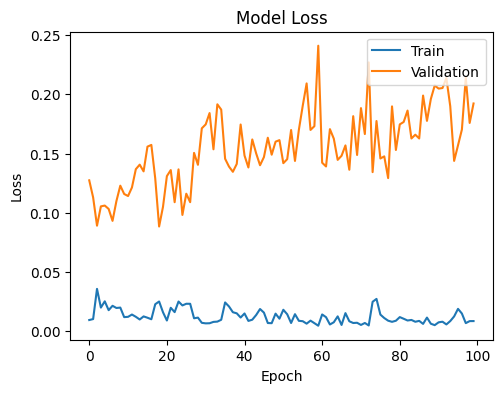

In [ ]:
#Plot training & Validation loss values
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

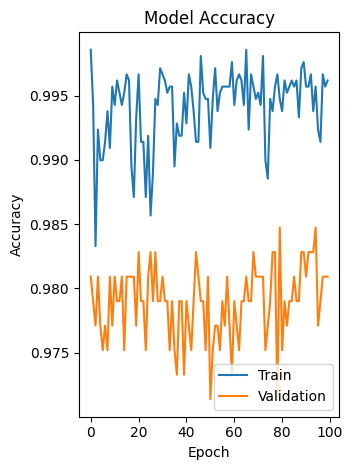

In [ ]:
# Plot training & validation accuracy values
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='lower right')

plt.tight_layout()
plt.show()

In [ ]:
#Using DenseNet 121 Architecture to Extract Features
import os
import cv2
import numpy as np
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.densenet import preprocess_input
from tqdm import tqdm

# Define the image directories
image_directory = '/content/drive/MyDrive/Challenge/WCEBleedGen (updated)'
output_directory = '/content/drive/MyDrive/Challenge/extracted_features'

# Define the image size
SIZE = (224, 224)

# Create output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Load the DenseNet-121 model with pre-trained weights
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Remove the top classification layers
x = base_model.output
x = GlobalAveragePooling2D()(x)

# Create a model for feature extraction
model = Model(inputs=base_model.input, outputs=x)

# Function to extract features from an image
def extract_features(image_path):
    img = image.load_img(image_path, target_size=SIZE)
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)
    features = model.predict(img)
    return features

# Initialize lists to store features and labels
features_list = []
labels_list = []

# Process bleeding images
bleeding_directory = os.path.join(image_directory, 'bleeding/Images')

for image_name in tqdm(os.listdir(bleeding_directory)):
    if image_name.endswith('.png'):
        image_path = os.path.join(bleeding_directory, image_name)
        features = extract_features(image_path)
        features_list.append(features)
        labels_list.append(1)  # Label 1 for bleeding

# Process non-bleeding images
non_bleeding_directory = os.path.join(image_directory, 'non-bleeding/images')

for image_name in tqdm(os.listdir(non_bleeding_directory)):
    if image_name.endswith('.png'):
        image_path = os.path.join(non_bleeding_directory, image_name)
        features = extract_features(image_path)
        features_list.append(features)
        labels_list.append(0)  # Label 0 for non-bleeding

# Convert lists to NumPy arrays
features_array = np.vstack(features_list)
labels_array = np.array(labels_list)

# Save the extracted features and labels in the "extracted_features" folder
np.save(os.path.join(output_directory, 'features_base.npy'), features_array)
np.save(os.path.join(output_directory, 'labels_base.npy'), labels_array)

print("Feature extraction and label saving completed.")

  0%|          | 0/1309 [00:00<?, ?it/s]

1/1 [==============================] - 2s 2s/step


  0%|          | 1/1309 [00:01<41:21,  1.90s/it]

1/1 [==============================] - 0s 27ms/step


  0%|          | 3/1309 [00:02<12:11,  1.78it/s]

1/1 [==============================] - 0s 43ms/step


  0%|          | 4/1309 [00:02<08:43,  2.49it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 5/1309 [00:02<06:35,  3.30it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 7/1309 [00:02<04:20,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 9/1309 [00:02<03:21,  6.44it/s]

1/1 [==============================] - 0s 43ms/step


  1%|          | 11/1309 [00:02<03:09,  6.86it/s]

1/1 [==============================] - 0s 41ms/step


  1%|          | 12/1309 [00:03<03:15,  6.64it/s]

1/1 [==============================] - 0s 49ms/step


  1%|          | 13/1309 [00:03<03:20,  6.47it/s]

1/1 [==============================] - 0s 108ms/step


  1%|          | 14/1309 [00:03<04:21,  4.95it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 15/1309 [00:11<50:11,  2.33s/it]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 17/1309 [00:12<29:33,  1.37s/it]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 19/1309 [00:12<19:03,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 21/1309 [00:12<13:01,  1.65it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 23/1309 [00:12<09:19,  2.30it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 25/1309 [00:12<06:56,  3.08it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 27/1309 [00:13<05:21,  3.99it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 29/1309 [00:13<04:16,  5.00it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 31/1309 [00:13<03:33,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 33/1309 [00:13<03:06,  6.83it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 35/1309 [00:13<02:45,  7.72it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 37/1309 [00:13<02:29,  8.50it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 39/1309 [00:14<02:18,  9.17it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 41/1309 [00:14<02:09,  9.77it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 43/1309 [00:14<02:05, 10.11it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 45/1309 [00:14<02:03, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 47/1309 [00:14<01:59, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 49/1309 [00:15<01:57, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 51/1309 [00:15<01:57, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 53/1309 [00:15<01:56, 10.78it/s]

1/1 [==============================] - 0s 37ms/step


  4%|▍         | 55/1309 [00:15<01:57, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 57/1309 [00:15<01:56, 10.71it/s]

1/1 [==============================] - 0s 44ms/step


  5%|▍         | 59/1309 [00:16<02:10,  9.57it/s]

1/1 [==============================] - 0s 44ms/step


  5%|▍         | 60/1309 [00:16<02:25,  8.56it/s]

1/1 [==============================] - 0s 41ms/step


  5%|▍         | 61/1309 [00:16<02:36,  7.98it/s]

1/1 [==============================] - 0s 40ms/step


  5%|▍         | 62/1309 [00:16<02:43,  7.63it/s]

1/1 [==============================] - 0s 47ms/step


  5%|▍         | 63/1309 [00:16<02:45,  7.51it/s]

1/1 [==============================] - 0s 44ms/step


  5%|▍         | 64/1309 [00:16<02:56,  7.06it/s]

1/1 [==============================] - 0s 49ms/step


  5%|▍         | 65/1309 [00:17<03:05,  6.70it/s]

1/1 [==============================] - 0s 46ms/step


  5%|▌         | 66/1309 [00:17<03:02,  6.80it/s]

1/1 [==============================] - 0s 58ms/step


  5%|▌         | 67/1309 [00:17<03:02,  6.81it/s]

1/1 [==============================] - 0s 42ms/step


  5%|▌         | 68/1309 [00:17<02:55,  7.08it/s]

1/1 [==============================] - 0s 48ms/step


  5%|▌         | 69/1309 [00:17<02:55,  7.07it/s]

1/1 [==============================] - 0s 56ms/step


  5%|▌         | 70/1309 [00:17<03:05,  6.67it/s]

1/1 [==============================] - 0s 45ms/step


  5%|▌         | 71/1309 [00:17<03:11,  6.47it/s]

1/1 [==============================] - 0s 41ms/step


  6%|▌         | 72/1309 [00:18<03:19,  6.20it/s]

1/1 [==============================] - 0s 44ms/step


  6%|▌         | 73/1309 [00:18<03:04,  6.69it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▌         | 74/1309 [00:18<02:55,  7.03it/s]

1/1 [==============================] - 0s 45ms/step


  6%|▌         | 75/1309 [00:18<02:52,  7.17it/s]

1/1 [==============================] - 0s 50ms/step


  6%|▌         | 76/1309 [00:18<02:53,  7.12it/s]

1/1 [==============================] - 0s 71ms/step


  6%|▌         | 77/1309 [00:18<03:07,  6.56it/s]

1/1 [==============================] - 0s 46ms/step


  6%|▌         | 78/1309 [00:18<03:03,  6.72it/s]

1/1 [==============================] - 0s 52ms/step


  6%|▌         | 79/1309 [00:19<03:18,  6.21it/s]

1/1 [==============================] - 0s 51ms/step


  6%|▌         | 80/1309 [00:19<03:11,  6.42it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 81/1309 [00:19<02:54,  7.03it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▋         | 83/1309 [00:19<02:27,  8.29it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▋         | 85/1309 [00:19<02:16,  8.95it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 86/1309 [00:19<02:13,  9.14it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 87/1309 [00:19<02:11,  9.32it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 89/1309 [00:20<02:03,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 90/1309 [00:20<02:03,  9.87it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 92/1309 [00:20<01:59, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 94/1309 [00:20<01:57, 10.32it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 96/1309 [00:20<02:03,  9.86it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 97/1309 [00:20<02:03,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 98/1309 [00:21<02:03,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 100/1309 [00:21<01:59, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 102/1309 [00:21<01:56, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 104/1309 [00:21<01:55, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 106/1309 [00:21<01:57, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 108/1309 [00:22<01:58, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 110/1309 [00:22<01:57, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▊         | 112/1309 [00:22<01:56, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 114/1309 [00:22<01:56, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 116/1309 [00:22<01:56, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 118/1309 [00:22<01:57, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 120/1309 [00:23<01:54, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 122/1309 [00:23<01:53, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 124/1309 [00:23<01:53, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 126/1309 [00:23<01:52, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 128/1309 [00:23<01:54, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 130/1309 [00:24<01:52, 10.44it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 132/1309 [00:24<01:51, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 134/1309 [00:24<01:55, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 136/1309 [00:24<01:54, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 138/1309 [00:24<01:52, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 140/1309 [00:25<01:52, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 142/1309 [00:25<01:50, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 144/1309 [00:25<01:49, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 146/1309 [00:25<01:47, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 148/1309 [00:25<01:46, 10.91it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█▏        | 150/1309 [00:26<01:47, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 152/1309 [00:26<01:46, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 154/1309 [00:26<01:44, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 156/1309 [00:26<01:43, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 158/1309 [00:26<01:44, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 160/1309 [00:26<01:44, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 162/1309 [00:27<01:45, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 164/1309 [00:27<01:46, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 166/1309 [00:27<01:45, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 168/1309 [00:27<01:51, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 170/1309 [00:27<01:50, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 172/1309 [00:28<01:49, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 174/1309 [00:28<01:47, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 176/1309 [00:28<01:45, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 178/1309 [00:28<01:45, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 180/1309 [00:28<01:45, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 182/1309 [00:28<01:43, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 184/1309 [00:29<01:45, 10.64it/s]

1/1 [==============================] - 0s 47ms/step


 14%|█▍        | 186/1309 [00:29<01:51, 10.12it/s]

1/1 [==============================] - 0s 45ms/step


 14%|█▍        | 188/1309 [00:29<02:07,  8.81it/s]

1/1 [==============================] - 0s 43ms/step


 14%|█▍        | 189/1309 [00:29<02:09,  8.66it/s]

1/1 [==============================] - 0s 49ms/step


 15%|█▍        | 190/1309 [00:29<02:21,  7.89it/s]

1/1 [==============================] - 0s 54ms/step


 15%|█▍        | 191/1309 [00:30<02:26,  7.65it/s]

1/1 [==============================] - 0s 41ms/step


 15%|█▍        | 192/1309 [00:30<02:26,  7.62it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▍        | 193/1309 [00:30<02:24,  7.70it/s]

1/1 [==============================] - 0s 47ms/step


 15%|█▍        | 194/1309 [00:30<02:27,  7.57it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▍        | 195/1309 [00:30<02:31,  7.37it/s]

1/1 [==============================] - 0s 54ms/step


 15%|█▍        | 196/1309 [00:30<02:48,  6.61it/s]

1/1 [==============================] - 0s 48ms/step


 15%|█▌        | 197/1309 [00:30<02:41,  6.87it/s]

1/1 [==============================] - 0s 57ms/step


 15%|█▌        | 198/1309 [00:31<02:49,  6.54it/s]

1/1 [==============================] - 0s 44ms/step


 15%|█▌        | 199/1309 [00:31<02:43,  6.80it/s]

1/1 [==============================] - 0s 48ms/step


 15%|█▌        | 200/1309 [00:31<02:41,  6.88it/s]

1/1 [==============================] - 0s 40ms/step


 15%|█▌        | 201/1309 [00:31<02:33,  7.21it/s]

1/1 [==============================] - 0s 47ms/step


 15%|█▌        | 202/1309 [00:31<02:44,  6.72it/s]

1/1 [==============================] - 0s 44ms/step


 16%|█▌        | 203/1309 [00:31<02:40,  6.90it/s]

1/1 [==============================] - 0s 53ms/step


 16%|█▌        | 204/1309 [00:32<02:51,  6.46it/s]

1/1 [==============================] - 0s 58ms/step


 16%|█▌        | 205/1309 [00:32<03:00,  6.12it/s]

1/1 [==============================] - 0s 50ms/step


 16%|█▌        | 206/1309 [00:32<03:05,  5.94it/s]

1/1 [==============================] - 0s 51ms/step


 16%|█▌        | 207/1309 [00:32<02:57,  6.19it/s]

1/1 [==============================] - 0s 50ms/step


 16%|█▌        | 208/1309 [00:32<03:11,  5.76it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 210/1309 [00:32<02:30,  7.32it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 212/1309 [00:33<02:08,  8.51it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 214/1309 [00:33<02:00,  9.08it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 216/1309 [00:33<01:54,  9.53it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 218/1309 [00:33<01:50,  9.91it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 220/1309 [00:33<01:46, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 222/1309 [00:34<01:45, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 224/1309 [00:34<01:45, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 226/1309 [00:34<01:43, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 228/1309 [00:34<01:42, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 230/1309 [00:34<01:41, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 232/1309 [00:35<01:42, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 234/1309 [00:35<01:41, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 236/1309 [00:35<01:42, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 238/1309 [00:35<01:43, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 240/1309 [00:35<01:41, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 242/1309 [00:35<01:41, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 244/1309 [00:36<01:40, 10.64it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 246/1309 [00:36<01:45, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 248/1309 [00:36<01:43, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 250/1309 [00:36<01:42, 10.31it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 252/1309 [00:36<01:40, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 254/1309 [00:37<01:40, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 256/1309 [00:37<01:39, 10.62it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 258/1309 [00:37<01:40, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 260/1309 [00:37<01:40, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 262/1309 [00:37<01:38, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 264/1309 [00:38<01:37, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 266/1309 [00:38<01:37, 10.74it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 268/1309 [00:38<01:38, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 270/1309 [00:38<01:37, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 272/1309 [00:38<01:35, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 274/1309 [00:38<01:35, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 276/1309 [00:39<01:34, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 278/1309 [00:39<01:38, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██▏       | 280/1309 [00:39<01:38, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 282/1309 [00:39<01:37, 10.55it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 284/1309 [00:39<01:35, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 286/1309 [00:40<01:35, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 288/1309 [00:40<01:41, 10.03it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 290/1309 [00:40<01:38, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 292/1309 [00:40<01:36, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 294/1309 [00:40<01:35, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 296/1309 [00:41<01:35, 10.55it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 298/1309 [00:41<01:34, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 300/1309 [00:41<01:32, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 302/1309 [00:41<01:36, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 304/1309 [00:41<01:38, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 306/1309 [00:42<01:36, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 308/1309 [00:42<01:34, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 310/1309 [00:42<01:34, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 312/1309 [00:42<01:36, 10.38it/s]

1/1 [==============================] - 0s 51ms/step


 24%|██▍       | 314/1309 [00:42<01:44,  9.53it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▍       | 315/1309 [00:43<01:49,  9.10it/s]

1/1 [==============================] - 0s 45ms/step


 24%|██▍       | 316/1309 [00:43<01:54,  8.67it/s]

1/1 [==============================] - 0s 44ms/step


 24%|██▍       | 317/1309 [00:43<02:02,  8.13it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 318/1309 [00:43<02:09,  7.67it/s]

1/1 [==============================] - 0s 54ms/step


 24%|██▍       | 319/1309 [00:43<02:21,  7.01it/s]

1/1 [==============================] - 0s 47ms/step


 24%|██▍       | 320/1309 [00:43<02:27,  6.71it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▍       | 321/1309 [00:43<02:21,  6.96it/s]

1/1 [==============================] - 0s 48ms/step


 25%|██▍       | 322/1309 [00:44<02:17,  7.18it/s]

1/1 [==============================] - 0s 43ms/step


 25%|██▍       | 323/1309 [00:44<02:30,  6.56it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 324/1309 [00:44<02:22,  6.92it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▍       | 325/1309 [00:44<02:17,  7.13it/s]

1/1 [==============================] - 0s 50ms/step


 25%|██▍       | 326/1309 [00:44<02:20,  7.00it/s]

1/1 [==============================] - 0s 40ms/step


 25%|██▍       | 327/1309 [00:44<02:16,  7.19it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▌       | 328/1309 [00:44<02:13,  7.37it/s]

1/1 [==============================] - 0s 43ms/step


 25%|██▌       | 329/1309 [00:45<02:24,  6.80it/s]

1/1 [==============================] - 0s 48ms/step


 25%|██▌       | 330/1309 [00:45<02:19,  7.03it/s]

1/1 [==============================] - 0s 47ms/step


 25%|██▌       | 331/1309 [00:45<02:32,  6.42it/s]

1/1 [==============================] - 0s 47ms/step


 25%|██▌       | 332/1309 [00:45<02:29,  6.52it/s]

1/1 [==============================] - 0s 71ms/step


 25%|██▌       | 333/1309 [00:45<02:34,  6.32it/s]

1/1 [==============================] - 0s 47ms/step


 26%|██▌       | 334/1309 [00:45<02:42,  6.01it/s]

1/1 [==============================] - 0s 60ms/step


 26%|██▌       | 335/1309 [00:46<02:49,  5.75it/s]

1/1 [==============================] - 0s 50ms/step


 26%|██▌       | 336/1309 [00:46<02:50,  5.71it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 338/1309 [00:46<02:11,  7.36it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 340/1309 [00:46<01:57,  8.28it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 341/1309 [00:46<01:54,  8.47it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 343/1309 [00:46<01:44,  9.25it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 345/1309 [00:47<01:39,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 347/1309 [00:47<01:36,  9.94it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 349/1309 [00:47<01:34, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 351/1309 [00:47<01:34, 10.10it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 353/1309 [00:47<01:35, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 355/1309 [00:48<01:33, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 357/1309 [00:48<01:31, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 359/1309 [00:48<01:30, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 361/1309 [00:48<01:30, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 363/1309 [00:48<01:32, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 365/1309 [00:49<01:29, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 367/1309 [00:49<01:28, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 369/1309 [00:49<01:28, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 371/1309 [00:49<01:29, 10.43it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 373/1309 [00:49<01:34,  9.88it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 375/1309 [00:50<01:31, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 377/1309 [00:50<01:32, 10.05it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 379/1309 [00:50<01:28, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 381/1309 [00:50<01:27, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 383/1309 [00:50<01:26, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 385/1309 [00:50<01:27, 10.55it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 387/1309 [00:51<02:25,  6.35it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 388/1309 [00:51<02:16,  6.76it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 389/1309 [00:51<02:07,  7.21it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██▉       | 390/1309 [00:51<02:02,  7.53it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 392/1309 [00:52<01:49,  8.39it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 394/1309 [00:52<01:41,  9.00it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 395/1309 [00:52<01:41,  9.04it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 396/1309 [00:52<01:39,  9.18it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 398/1309 [00:52<01:34,  9.66it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 399/1309 [00:52<01:42,  8.90it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 400/1309 [00:52<01:42,  8.84it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 401/1309 [00:53<01:43,  8.80it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 402/1309 [00:53<01:41,  8.93it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 403/1309 [00:53<01:38,  9.20it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 404/1309 [00:53<01:41,  8.89it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 405/1309 [00:53<01:39,  9.06it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 406/1309 [00:53<01:37,  9.28it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 407/1309 [00:53<01:35,  9.48it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 408/1309 [00:53<01:35,  9.46it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 409/1309 [00:53<01:33,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 410/1309 [00:53<01:36,  9.34it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███▏      | 412/1309 [00:54<01:34,  9.47it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 413/1309 [00:54<01:34,  9.53it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 414/1309 [00:54<01:33,  9.61it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 415/1309 [00:54<01:34,  9.43it/s]

1/1 [==============================] - 0s 52ms/step


 32%|███▏      | 417/1309 [00:54<01:38,  9.10it/s]

1/1 [==============================] - 0s 53ms/step


 32%|███▏      | 418/1309 [00:54<01:54,  7.75it/s]

1/1 [==============================] - 0s 50ms/step


 32%|███▏      | 419/1309 [00:55<01:56,  7.62it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 420/1309 [00:55<01:59,  7.41it/s]

1/1 [==============================] - 0s 49ms/step


 32%|███▏      | 421/1309 [00:55<02:07,  6.96it/s]

1/1 [==============================] - 0s 51ms/step


 32%|███▏      | 422/1309 [00:55<02:10,  6.80it/s]

1/1 [==============================] - 0s 59ms/step


 32%|███▏      | 423/1309 [00:55<02:11,  6.76it/s]

1/1 [==============================] - 0s 65ms/step


 32%|███▏      | 424/1309 [00:55<02:19,  6.33it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 425/1309 [00:56<02:16,  6.46it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 426/1309 [00:56<02:02,  7.19it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 427/1309 [00:56<01:52,  7.82it/s]

1/1 [==============================] - 0s 57ms/step


 33%|███▎      | 428/1309 [00:56<01:59,  7.39it/s]

1/1 [==============================] - 0s 50ms/step


 33%|███▎      | 429/1309 [00:56<01:59,  7.34it/s]

1/1 [==============================] - 0s 48ms/step


 33%|███▎      | 430/1309 [00:56<02:06,  6.96it/s]

1/1 [==============================] - 0s 49ms/step


 33%|███▎      | 431/1309 [00:56<02:06,  6.95it/s]

1/1 [==============================] - 0s 54ms/step


 33%|███▎      | 432/1309 [00:57<02:16,  6.41it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 433/1309 [00:57<02:21,  6.20it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 434/1309 [00:57<02:23,  6.10it/s]

1/1 [==============================] - 0s 47ms/step


 33%|███▎      | 435/1309 [00:57<02:14,  6.50it/s]

1/1 [==============================] - 0s 48ms/step


 33%|███▎      | 436/1309 [00:57<02:12,  6.60it/s]

1/1 [==============================] - 0s 48ms/step


 33%|███▎      | 437/1309 [00:57<02:19,  6.24it/s]

1/1 [==============================] - 0s 48ms/step


 33%|███▎      | 438/1309 [00:57<02:23,  6.09it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▎      | 439/1309 [00:58<02:23,  6.05it/s]

1/1 [==============================] - 0s 49ms/step


 34%|███▎      | 440/1309 [00:58<02:21,  6.16it/s]

1/1 [==============================] - 0s 48ms/step


 34%|███▎      | 441/1309 [00:58<02:14,  6.47it/s]

1/1 [==============================] - 0s 48ms/step


 34%|███▍      | 442/1309 [00:58<02:13,  6.48it/s]

1/1 [==============================] - 0s 51ms/step


 34%|███▍      | 443/1309 [00:58<02:20,  6.18it/s]

1/1 [==============================] - 0s 46ms/step


 34%|███▍      | 444/1309 [00:58<02:13,  6.50it/s]

1/1 [==============================] - 0s 50ms/step


 34%|███▍      | 445/1309 [00:59<02:24,  5.99it/s]

1/1 [==============================] - 0s 58ms/step


 34%|███▍      | 446/1309 [00:59<02:31,  5.71it/s]

1/1 [==============================] - 0s 55ms/step


 34%|███▍      | 447/1309 [00:59<02:27,  5.86it/s]

1/1 [==============================] - 0s 58ms/step


 34%|███▍      | 448/1309 [00:59<02:32,  5.66it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 449/1309 [00:59<02:23,  6.00it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 450/1309 [00:59<02:06,  6.78it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 451/1309 [01:00<01:54,  7.46it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 452/1309 [01:00<01:47,  7.98it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 454/1309 [01:00<01:37,  8.81it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 456/1309 [01:00<01:31,  9.37it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 457/1309 [01:00<01:31,  9.34it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 458/1309 [01:00<01:31,  9.33it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 459/1309 [01:00<01:31,  9.32it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 460/1309 [01:00<01:30,  9.38it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 461/1309 [01:01<01:29,  9.51it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 462/1309 [01:01<01:28,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 463/1309 [01:01<01:27,  9.61it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 465/1309 [01:01<01:24, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 466/1309 [01:01<01:27,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 467/1309 [01:01<01:27,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 468/1309 [01:01<01:26,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 469/1309 [01:01<01:26,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 471/1309 [01:02<01:23, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 473/1309 [01:02<01:22, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 475/1309 [01:02<01:24,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 476/1309 [01:02<01:24,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 477/1309 [01:02<01:24,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 478/1309 [01:02<01:24,  9.81it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 480/1309 [01:02<01:22, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 481/1309 [01:03<01:22, 10.00it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 483/1309 [01:03<01:23,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 484/1309 [01:03<01:25,  9.69it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 485/1309 [01:03<01:24,  9.70it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 486/1309 [01:03<01:25,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 487/1309 [01:03<01:25,  9.67it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 489/1309 [01:03<01:22,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 491/1309 [01:04<01:21, 10.06it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 492/1309 [01:04<01:22,  9.94it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 493/1309 [01:04<01:27,  9.33it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 495/1309 [01:04<01:23,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 496/1309 [01:04<01:24,  9.66it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 497/1309 [01:04<01:23,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 498/1309 [01:04<01:28,  9.21it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 499/1309 [01:04<01:26,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 501/1309 [01:05<01:21,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 502/1309 [01:05<01:22,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 503/1309 [01:05<01:23,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 504/1309 [01:05<01:23,  9.63it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▊      | 505/1309 [01:05<01:23,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 507/1309 [01:05<01:21,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 508/1309 [01:05<01:21,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 509/1309 [01:05<01:21,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 511/1309 [01:06<01:21,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 513/1309 [01:06<01:21,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 515/1309 [01:06<01:20,  9.84it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 517/1309 [01:06<01:19,  9.97it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 519/1309 [01:06<01:18, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 521/1309 [01:07<01:19,  9.96it/s]

1/1 [==============================] - 0s 38ms/step


 40%|███▉      | 523/1309 [01:07<01:22,  9.55it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 524/1309 [01:07<01:21,  9.61it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 525/1309 [01:07<01:22,  9.52it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 526/1309 [01:07<01:22,  9.46it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 528/1309 [01:07<01:19,  9.80it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 529/1309 [01:07<01:19,  9.83it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 530/1309 [01:08<01:19,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 531/1309 [01:08<01:19,  9.82it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 533/1309 [01:08<01:18,  9.85it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 534/1309 [01:08<01:18,  9.87it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 536/1309 [01:08<01:17, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 538/1309 [01:08<01:17,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 540/1309 [01:09<01:16, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 542/1309 [01:09<01:14, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 544/1309 [01:09<01:14, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 546/1309 [01:09<01:14, 10.30it/s]

1/1 [==============================] - 0s 53ms/step


 42%|████▏     | 548/1309 [01:09<01:24,  8.97it/s]

1/1 [==============================] - 0s 55ms/step


 42%|████▏     | 549/1309 [01:10<01:28,  8.55it/s]

1/1 [==============================] - 0s 55ms/step


 42%|████▏     | 550/1309 [01:10<01:40,  7.56it/s]

1/1 [==============================] - 0s 56ms/step


 42%|████▏     | 551/1309 [01:10<01:42,  7.37it/s]

1/1 [==============================] - 0s 48ms/step


 42%|████▏     | 552/1309 [01:10<01:44,  7.26it/s]

1/1 [==============================] - 0s 56ms/step


 42%|████▏     | 553/1309 [01:10<01:47,  7.05it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 554/1309 [01:10<01:54,  6.59it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 555/1309 [01:11<01:49,  6.86it/s]

1/1 [==============================] - 0s 50ms/step


 42%|████▏     | 556/1309 [01:11<01:52,  6.72it/s]

1/1 [==============================] - 0s 53ms/step


 43%|████▎     | 557/1309 [01:11<01:54,  6.59it/s]

1/1 [==============================] - 0s 63ms/step


 43%|████▎     | 558/1309 [01:11<02:03,  6.11it/s]

1/1 [==============================] - 0s 47ms/step


 43%|████▎     | 559/1309 [01:11<02:04,  6.01it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████▎     | 560/1309 [01:11<02:07,  5.86it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 561/1309 [01:12<02:10,  5.74it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 562/1309 [01:12<02:00,  6.18it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████▎     | 563/1309 [01:12<01:55,  6.47it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████▎     | 564/1309 [01:12<01:52,  6.62it/s]

1/1 [==============================] - 0s 47ms/step


 43%|████▎     | 565/1309 [01:12<01:56,  6.39it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 566/1309 [01:12<01:53,  6.56it/s]

1/1 [==============================] - 0s 48ms/step


 43%|████▎     | 567/1309 [01:12<01:51,  6.65it/s]

1/1 [==============================] - 0s 49ms/step


 43%|████▎     | 568/1309 [01:13<01:58,  6.27it/s]

1/1 [==============================] - 0s 51ms/step


 43%|████▎     | 569/1309 [01:13<01:57,  6.28it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▎     | 570/1309 [01:13<02:02,  6.02it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▎     | 571/1309 [01:13<01:53,  6.48it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 572/1309 [01:13<01:42,  7.22it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 573/1309 [01:13<01:33,  7.86it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 574/1309 [01:13<01:29,  8.24it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 575/1309 [01:14<01:24,  8.67it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 576/1309 [01:14<01:22,  8.88it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 578/1309 [01:14<01:16,  9.59it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 580/1309 [01:14<01:13,  9.97it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 582/1309 [01:14<01:12, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 583/1309 [01:14<01:13,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 585/1309 [01:14<01:11, 10.15it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 587/1309 [01:15<01:10, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 589/1309 [01:15<01:09, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 591/1309 [01:15<01:09, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 593/1309 [01:15<01:10, 10.11it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 595/1309 [01:15<01:09, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 597/1309 [01:16<01:09, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 599/1309 [01:16<01:09, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 601/1309 [01:16<01:09, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 603/1309 [01:16<01:10, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 605/1309 [01:16<01:09, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 607/1309 [01:17<01:09, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 609/1309 [01:17<01:08, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 611/1309 [01:17<01:08, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 613/1309 [01:17<01:09, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 615/1309 [01:17<01:08, 10.07it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 617/1309 [01:18<01:08, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 619/1309 [01:18<01:08, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 621/1309 [01:18<01:08, 10.10it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 623/1309 [01:18<01:07, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 625/1309 [01:18<01:06, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 627/1309 [01:19<01:05, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 629/1309 [01:19<01:06, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 631/1309 [01:19<01:05, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 633/1309 [01:19<01:05, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 635/1309 [01:19<01:06, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 637/1309 [01:20<01:05, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 639/1309 [01:20<01:05, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 641/1309 [01:20<01:05, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 643/1309 [01:20<01:06,  9.94it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 644/1309 [01:20<01:07,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 646/1309 [01:20<01:06, 10.00it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 647/1309 [01:21<01:06,  9.95it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 649/1309 [01:21<01:03, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 651/1309 [01:21<01:03, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 653/1309 [01:21<01:07,  9.68it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 655/1309 [01:21<01:07,  9.73it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 657/1309 [01:22<01:05,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 659/1309 [01:22<01:05,  9.94it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 661/1309 [01:22<01:04, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 663/1309 [01:22<01:02, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 665/1309 [01:22<01:03, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 667/1309 [01:23<01:02, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 669/1309 [01:23<01:06,  9.67it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 670/1309 [01:23<01:06,  9.64it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████▏    | 671/1309 [01:23<01:17,  8.27it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████▏    | 672/1309 [01:23<01:20,  7.90it/s]

1/1 [==============================] - 0s 62ms/step


 51%|█████▏    | 673/1309 [01:23<01:27,  7.28it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████▏    | 674/1309 [01:24<01:33,  6.77it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 675/1309 [01:24<01:30,  6.99it/s]

1/1 [==============================] - 0s 51ms/step


 52%|█████▏    | 676/1309 [01:24<01:35,  6.64it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 677/1309 [01:24<01:38,  6.40it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 678/1309 [01:24<01:33,  6.78it/s]

1/1 [==============================] - 0s 52ms/step


 52%|█████▏    | 679/1309 [01:24<01:39,  6.31it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 680/1309 [01:25<01:35,  6.56it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 681/1309 [01:25<01:33,  6.71it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 682/1309 [01:25<01:39,  6.29it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 683/1309 [01:25<01:34,  6.62it/s]

1/1 [==============================] - 0s 50ms/step


 52%|█████▏    | 684/1309 [01:25<01:32,  6.76it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 685/1309 [01:25<01:30,  6.91it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 686/1309 [01:25<01:27,  7.08it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 687/1309 [01:26<01:35,  6.52it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 688/1309 [01:26<01:30,  6.90it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 689/1309 [01:26<01:29,  6.95it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 690/1309 [01:26<01:34,  6.54it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 691/1309 [01:26<01:36,  6.41it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 692/1309 [01:26<01:33,  6.59it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 693/1309 [01:26<01:31,  6.72it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 694/1309 [01:27<01:38,  6.22it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 695/1309 [01:27<01:28,  6.96it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 697/1309 [01:27<01:13,  8.36it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 699/1309 [01:27<01:07,  9.07it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 700/1309 [01:27<01:11,  8.54it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 702/1309 [01:27<01:05,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 703/1309 [01:28<01:04,  9.45it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 704/1309 [01:28<01:03,  9.47it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 705/1309 [01:28<01:03,  9.57it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 707/1309 [01:28<01:01,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 708/1309 [01:28<01:01,  9.73it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 709/1309 [01:28<01:02,  9.54it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 711/1309 [01:28<01:00,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 712/1309 [01:28<01:00,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 714/1309 [01:29<01:00,  9.77it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 715/1309 [01:29<01:00,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 717/1309 [01:29<01:02,  9.45it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 718/1309 [01:29<01:03,  9.34it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 720/1309 [01:29<01:00,  9.76it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 722/1309 [01:29<00:58,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 724/1309 [01:30<00:58, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 726/1309 [01:30<00:56, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 728/1309 [01:30<00:56, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 730/1309 [01:30<01:00,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 732/1309 [01:30<00:58,  9.92it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 734/1309 [01:31<00:57, 10.03it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 736/1309 [01:31<00:56, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 738/1309 [01:31<00:57, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 740/1309 [01:31<00:56, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 742/1309 [01:31<00:55, 10.24it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 744/1309 [01:32<00:54, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 746/1309 [01:32<00:55, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 748/1309 [01:32<00:55, 10.15it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 750/1309 [01:32<00:55, 10.11it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 752/1309 [01:32<00:54, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 754/1309 [01:33<00:54, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 756/1309 [01:33<00:55,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 757/1309 [01:33<00:55,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 759/1309 [01:33<00:54, 10.07it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 761/1309 [01:33<00:53, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 763/1309 [01:34<00:53, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 765/1309 [01:34<00:52, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 767/1309 [01:34<00:53, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 769/1309 [01:34<00:53, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 771/1309 [01:34<00:52, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 773/1309 [01:35<00:54,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 775/1309 [01:35<00:53, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 777/1309 [01:35<00:53,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 778/1309 [01:35<00:53,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 780/1309 [01:35<00:52,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 781/1309 [01:35<00:53,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 782/1309 [01:35<00:53,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 783/1309 [01:36<00:54,  9.69it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 785/1309 [01:36<00:52,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 786/1309 [01:36<00:55,  9.35it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 788/1309 [01:36<00:53,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 790/1309 [01:36<00:51, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 791/1309 [01:36<00:51, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 793/1309 [01:37<00:50, 10.16it/s]

1/1 [==============================] - 0s 57ms/step


 61%|██████    | 795/1309 [01:37<00:57,  8.99it/s]

1/1 [==============================] - 0s 49ms/step


 61%|██████    | 796/1309 [01:37<01:01,  8.31it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 797/1309 [01:37<01:04,  7.93it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 798/1309 [01:37<01:06,  7.74it/s]

1/1 [==============================] - 0s 42ms/step


 61%|██████    | 799/1309 [01:37<01:07,  7.54it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 800/1309 [01:38<01:09,  7.36it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 801/1309 [01:38<01:07,  7.50it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████▏   | 802/1309 [01:38<01:08,  7.36it/s]

1/1 [==============================] - 0s 48ms/step


 61%|██████▏   | 803/1309 [01:38<01:11,  7.09it/s]

1/1 [==============================] - 0s 51ms/step


 61%|██████▏   | 804/1309 [01:38<01:18,  6.44it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████▏   | 805/1309 [01:38<01:20,  6.24it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 806/1309 [01:38<01:22,  6.11it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 807/1309 [01:39<01:21,  6.13it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 808/1309 [01:39<01:17,  6.47it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 809/1309 [01:39<01:15,  6.62it/s]

1/1 [==============================] - 0s 46ms/step


 62%|██████▏   | 810/1309 [01:39<01:15,  6.60it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 811/1309 [01:39<01:13,  6.81it/s]

1/1 [==============================] - 0s 48ms/step


 62%|██████▏   | 812/1309 [01:39<01:17,  6.40it/s]

1/1 [==============================] - 0s 49ms/step


 62%|██████▏   | 813/1309 [01:40<01:15,  6.58it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 814/1309 [01:40<01:18,  6.28it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 815/1309 [01:40<01:16,  6.48it/s]

1/1 [==============================] - 0s 52ms/step


 62%|██████▏   | 816/1309 [01:40<01:15,  6.49it/s]

1/1 [==============================] - 0s 47ms/step


 62%|██████▏   | 817/1309 [01:40<01:17,  6.36it/s]

1/1 [==============================] - 0s 64ms/step


 62%|██████▏   | 818/1309 [01:40<01:18,  6.22it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 819/1309 [01:40<01:13,  6.69it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 820/1309 [01:41<01:06,  7.37it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 821/1309 [01:41<01:06,  7.30it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 823/1309 [01:41<00:57,  8.50it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 825/1309 [01:41<00:53,  9.13it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 826/1309 [01:41<00:52,  9.13it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 827/1309 [01:41<00:51,  9.27it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 829/1309 [01:42<00:49,  9.76it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 830/1309 [01:42<00:48,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 831/1309 [01:42<00:48,  9.83it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 833/1309 [01:42<00:47, 10.04it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▎   | 834/1309 [01:42<00:54,  8.75it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 835/1309 [01:42<00:53,  8.92it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 836/1309 [01:42<00:52,  9.06it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 837/1309 [01:42<00:51,  9.19it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 838/1309 [01:42<00:50,  9.30it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 840/1309 [01:43<00:47,  9.83it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 841/1309 [01:43<00:47,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 843/1309 [01:43<00:45, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 845/1309 [01:43<00:46,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 846/1309 [01:43<00:47,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 847/1309 [01:43<00:51,  9.00it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 849/1309 [01:44<00:47,  9.60it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 850/1309 [01:44<00:47,  9.66it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 851/1309 [01:44<00:47,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 853/1309 [01:44<00:45, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 854/1309 [01:44<00:46,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 856/1309 [01:44<00:47,  9.62it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 857/1309 [01:44<00:46,  9.65it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 858/1309 [01:45<00:46,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 860/1309 [01:45<00:45,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 861/1309 [01:45<00:45,  9.75it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 862/1309 [01:45<00:45,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 863/1309 [01:45<00:47,  9.47it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 864/1309 [01:45<00:47,  9.46it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 866/1309 [01:45<00:46,  9.50it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 867/1309 [01:45<00:46,  9.53it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 868/1309 [01:46<00:45,  9.60it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 870/1309 [01:46<00:44,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 872/1309 [01:46<00:44,  9.92it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 873/1309 [01:46<00:44,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 874/1309 [01:46<00:44,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 876/1309 [01:46<00:44,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 878/1309 [01:47<00:43,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 879/1309 [01:47<00:43,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 880/1309 [01:47<00:43,  9.75it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 881/1309 [01:47<00:43,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 882/1309 [01:47<00:44,  9.59it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 883/1309 [01:47<00:45,  9.45it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 884/1309 [01:47<00:45,  9.41it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 885/1309 [01:47<00:44,  9.54it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 886/1309 [01:47<00:45,  9.21it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 887/1309 [01:48<00:45,  9.36it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 889/1309 [01:48<00:43,  9.72it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 890/1309 [01:48<00:43,  9.61it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 892/1309 [01:48<00:41,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 893/1309 [01:48<00:42,  9.86it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 894/1309 [01:48<00:42,  9.84it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 895/1309 [01:48<00:42,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 896/1309 [01:48<00:43,  9.52it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▊   | 898/1309 [01:49<00:41,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 899/1309 [01:49<00:42,  9.63it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 901/1309 [01:49<00:40, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 903/1309 [01:49<00:40, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 904/1309 [01:49<00:40, 10.02it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 905/1309 [01:49<00:40, 10.01it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 906/1309 [01:49<00:41,  9.70it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 908/1309 [01:50<00:40,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 910/1309 [01:50<00:40,  9.96it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 911/1309 [01:50<00:40,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 912/1309 [01:50<00:40,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 913/1309 [01:50<00:44,  8.83it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 915/1309 [01:50<00:41,  9.43it/s]

1/1 [==============================] - 0s 44ms/step


 70%|██████▉   | 916/1309 [01:51<00:48,  8.02it/s]

1/1 [==============================] - 0s 46ms/step


 70%|███████   | 917/1309 [01:51<00:50,  7.79it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 918/1309 [01:51<00:51,  7.54it/s]

1/1 [==============================] - 0s 43ms/step


 70%|███████   | 919/1309 [01:51<00:56,  6.88it/s]

1/1 [==============================] - 0s 44ms/step


 70%|███████   | 920/1309 [01:51<00:55,  6.95it/s]

1/1 [==============================] - 0s 45ms/step


 70%|███████   | 921/1309 [01:51<01:00,  6.41it/s]

1/1 [==============================] - 0s 54ms/step


 70%|███████   | 922/1309 [01:52<01:02,  6.14it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████   | 923/1309 [01:52<01:03,  6.11it/s]

1/1 [==============================] - 0s 41ms/step


 71%|███████   | 924/1309 [01:52<01:00,  6.40it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████   | 925/1309 [01:52<00:59,  6.49it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████   | 926/1309 [01:52<00:57,  6.66it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████   | 927/1309 [01:52<00:58,  6.56it/s]

1/1 [==============================] - 0s 50ms/step


 71%|███████   | 928/1309 [01:53<01:02,  6.12it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████   | 929/1309 [01:53<01:02,  6.08it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████   | 930/1309 [01:53<01:03,  6.01it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████   | 931/1309 [01:53<00:59,  6.36it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████   | 932/1309 [01:53<00:57,  6.56it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████▏  | 933/1309 [01:53<01:00,  6.17it/s]

1/1 [==============================] - 0s 46ms/step


 71%|███████▏  | 934/1309 [01:53<00:58,  6.36it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████▏  | 935/1309 [01:54<01:02,  5.95it/s]

1/1 [==============================] - 0s 53ms/step


 72%|███████▏  | 936/1309 [01:54<01:01,  6.09it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 937/1309 [01:54<01:00,  6.13it/s]

1/1 [==============================] - 0s 55ms/step


 72%|███████▏  | 938/1309 [01:54<01:02,  5.98it/s]

1/1 [==============================] - 0s 63ms/step


 72%|███████▏  | 939/1309 [01:54<01:04,  5.76it/s]

1/1 [==============================] - 0s 70ms/step


 72%|███████▏  | 940/1309 [01:55<01:06,  5.58it/s]

1/1 [==============================] - 0s 50ms/step


 72%|███████▏  | 941/1309 [01:55<01:06,  5.54it/s]

1/1 [==============================] - 0s 48ms/step


 72%|███████▏  | 942/1309 [01:55<01:05,  5.64it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 943/1309 [01:55<01:00,  6.06it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 944/1309 [01:55<01:01,  5.94it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 945/1309 [01:55<01:03,  5.75it/s]

1/1 [==============================] - 0s 50ms/step


 72%|███████▏  | 946/1309 [01:55<00:58,  6.18it/s]

1/1 [==============================] - 0s 50ms/step


 72%|███████▏  | 947/1309 [01:56<00:56,  6.44it/s]

1/1 [==============================] - 0s 51ms/step


 72%|███████▏  | 948/1309 [01:56<00:57,  6.32it/s]

1/1 [==============================] - 0s 50ms/step


 72%|███████▏  | 949/1309 [01:56<00:56,  6.32it/s]

1/1 [==============================] - 0s 43ms/step


 73%|███████▎  | 950/1309 [01:56<00:55,  6.52it/s]

1/1 [==============================] - 0s 51ms/step


 73%|███████▎  | 951/1309 [01:56<00:53,  6.74it/s]

1/1 [==============================] - 0s 52ms/step


 73%|███████▎  | 952/1309 [01:56<00:54,  6.60it/s]

1/1 [==============================] - 0s 44ms/step


 73%|███████▎  | 953/1309 [01:57<00:54,  6.58it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 954/1309 [01:57<00:53,  6.61it/s]

1/1 [==============================] - 0s 52ms/step


 73%|███████▎  | 955/1309 [01:57<00:53,  6.62it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 956/1309 [01:57<00:51,  6.92it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 957/1309 [01:57<00:50,  6.97it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 958/1309 [01:57<00:53,  6.61it/s]

1/1 [==============================] - 0s 56ms/step


 73%|███████▎  | 959/1309 [01:57<00:56,  6.24it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 960/1309 [01:58<00:57,  6.10it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 961/1309 [01:58<00:57,  6.03it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████▎  | 962/1309 [01:58<00:55,  6.20it/s]

1/1 [==============================] - 0s 52ms/step


 74%|███████▎  | 963/1309 [01:58<00:59,  5.82it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 964/1309 [01:58<00:53,  6.43it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 965/1309 [01:58<00:48,  7.11it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 966/1309 [01:58<00:44,  7.67it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 967/1309 [01:59<00:41,  8.20it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 969/1309 [01:59<00:37,  9.04it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 970/1309 [01:59<00:39,  8.50it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 972/1309 [01:59<00:37,  9.03it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 973/1309 [01:59<00:36,  9.12it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 974/1309 [01:59<00:36,  9.24it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 975/1309 [01:59<00:35,  9.42it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 976/1309 [02:00<00:35,  9.43it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 978/1309 [02:00<00:33,  9.82it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▍  | 980/1309 [02:00<00:33,  9.87it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 981/1309 [02:00<00:33,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 982/1309 [02:00<00:33,  9.76it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 984/1309 [02:00<00:32,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 985/1309 [02:00<00:32,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 986/1309 [02:01<00:32,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 988/1309 [02:01<00:31, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 990/1309 [02:01<00:31, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 992/1309 [02:01<00:31, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 993/1309 [02:01<00:31,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 994/1309 [02:01<00:31,  9.85it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 996/1309 [02:02<00:32,  9.71it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 997/1309 [02:02<00:32,  9.69it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 999/1309 [02:02<00:31,  9.88it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 1000/1309 [02:02<00:31,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 1001/1309 [02:02<00:32,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1002/1309 [02:02<00:31,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1003/1309 [02:02<00:31,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1004/1309 [02:02<00:31,  9.59it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 1005/1309 [02:02<00:32,  9.47it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 1006/1309 [02:03<00:31,  9.61it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1008/1309 [02:03<00:30,  9.78it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1010/1309 [02:03<00:29, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1011/1309 [02:03<00:31,  9.55it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1012/1309 [02:03<00:30,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1013/1309 [02:03<00:30,  9.56it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 1014/1309 [02:03<00:30,  9.67it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 1015/1309 [02:04<00:30,  9.72it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1017/1309 [02:04<00:28, 10.10it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1018/1309 [02:04<00:29,  9.87it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 1020/1309 [02:04<00:28, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1022/1309 [02:04<00:28,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 1023/1309 [02:04<00:28,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 1024/1309 [02:04<00:28,  9.89it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 1025/1309 [02:05<00:28,  9.84it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████▊  | 1026/1309 [02:05<00:31,  9.09it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 1027/1309 [02:05<00:33,  8.40it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▊  | 1028/1309 [02:05<00:39,  7.19it/s]

1/1 [==============================] - 0s 57ms/step


 79%|███████▊  | 1029/1309 [02:05<00:39,  7.13it/s]

1/1 [==============================] - 0s 51ms/step


 79%|███████▊  | 1030/1309 [02:05<00:43,  6.38it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▉  | 1031/1309 [02:05<00:43,  6.33it/s]

1/1 [==============================] - 0s 41ms/step


 79%|███████▉  | 1032/1309 [02:06<00:41,  6.61it/s]

1/1 [==============================] - 0s 41ms/step


 79%|███████▉  | 1033/1309 [02:06<00:41,  6.65it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 1034/1309 [02:06<00:44,  6.19it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▉  | 1035/1309 [02:06<00:41,  6.58it/s]

1/1 [==============================] - 0s 53ms/step


 79%|███████▉  | 1036/1309 [02:06<00:45,  6.05it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▉  | 1037/1309 [02:06<00:41,  6.49it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 1038/1309 [02:07<00:40,  6.74it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 1039/1309 [02:07<00:42,  6.34it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 1040/1309 [02:07<00:43,  6.20it/s]

1/1 [==============================] - 0s 45ms/step


 80%|███████▉  | 1041/1309 [02:07<00:41,  6.38it/s]

1/1 [==============================] - 0s 42ms/step


 80%|███████▉  | 1042/1309 [02:07<00:41,  6.46it/s]

1/1 [==============================] - 0s 44ms/step


 80%|███████▉  | 1043/1309 [02:07<00:41,  6.49it/s]

1/1 [==============================] - 0s 46ms/step


 80%|███████▉  | 1044/1309 [02:08<00:43,  6.13it/s]

1/1 [==============================] - 0s 46ms/step


 80%|███████▉  | 1045/1309 [02:08<00:41,  6.30it/s]

1/1 [==============================] - 0s 52ms/step


 80%|███████▉  | 1046/1309 [02:08<00:42,  6.12it/s]

1/1 [==============================] - 0s 46ms/step


 80%|███████▉  | 1047/1309 [02:08<00:40,  6.42it/s]

1/1 [==============================] - 0s 50ms/step


 80%|████████  | 1048/1309 [02:08<00:42,  6.12it/s]

1/1 [==============================] - 0s 68ms/step


 80%|████████  | 1049/1309 [02:08<00:43,  5.96it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 1050/1309 [02:08<00:39,  6.50it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 1051/1309 [02:09<00:35,  7.22it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 1052/1309 [02:09<00:32,  7.83it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 1053/1309 [02:09<00:30,  8.32it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 1054/1309 [02:09<00:29,  8.50it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 1055/1309 [02:09<00:28,  8.76it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 1056/1309 [02:09<00:28,  8.83it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 1057/1309 [02:09<00:28,  8.96it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 1058/1309 [02:09<00:27,  9.11it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 1059/1309 [02:09<00:28,  8.91it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 1060/1309 [02:10<00:27,  9.20it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 1061/1309 [02:10<00:26,  9.28it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 1062/1309 [02:10<00:26,  9.26it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 1063/1309 [02:10<00:26,  9.27it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 1064/1309 [02:10<00:26,  9.36it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 1065/1309 [02:10<00:26,  9.06it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 1066/1309 [02:10<00:26,  9.31it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1067/1309 [02:10<00:25,  9.33it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 1068/1309 [02:10<00:25,  9.36it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 1069/1309 [02:11<00:25,  9.25it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 1070/1309 [02:11<00:25,  9.46it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1072/1309 [02:11<00:24,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1074/1309 [02:11<00:23,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 1075/1309 [02:11<00:24,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1076/1309 [02:11<00:24,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1077/1309 [02:11<00:24,  9.66it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 1078/1309 [02:11<00:26,  8.73it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1080/1309 [02:12<00:24,  9.52it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1082/1309 [02:12<00:23,  9.86it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1083/1309 [02:12<00:22,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 1084/1309 [02:12<00:22,  9.85it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1086/1309 [02:12<00:21, 10.18it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 1088/1309 [02:12<00:24,  9.07it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1090/1309 [02:13<00:22,  9.63it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1091/1309 [02:13<00:22,  9.66it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1092/1309 [02:13<00:22,  9.64it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 1094/1309 [02:13<00:21,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 1096/1309 [02:13<00:21, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 1098/1309 [02:13<00:21,  9.94it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 1099/1309 [02:14<00:21,  9.66it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 1100/1309 [02:14<00:21,  9.69it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 1101/1309 [02:14<00:21,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 1102/1309 [02:14<00:21,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 1103/1309 [02:14<00:21,  9.69it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 1105/1309 [02:14<00:20,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 1106/1309 [02:14<00:20,  9.97it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 1107/1309 [02:14<00:20,  9.80it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 1108/1309 [02:15<00:21,  9.54it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 1109/1309 [02:15<00:21,  9.21it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 1110/1309 [02:15<00:21,  9.40it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 1111/1309 [02:15<00:20,  9.48it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 1112/1309 [02:15<00:20,  9.48it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 1113/1309 [02:15<00:20,  9.51it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 1114/1309 [02:15<00:20,  9.57it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1115/1309 [02:15<00:20,  9.48it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 1116/1309 [02:15<00:20,  9.41it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 1117/1309 [02:15<00:20,  9.51it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 1118/1309 [02:16<00:20,  9.26it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 1119/1309 [02:16<00:20,  9.46it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 1120/1309 [02:16<00:20,  9.45it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1122/1309 [02:16<00:18,  9.88it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1123/1309 [02:16<00:18,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 1125/1309 [02:16<00:18, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1126/1309 [02:16<00:18,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 1127/1309 [02:16<00:18,  9.82it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 1128/1309 [02:17<00:18,  9.81it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 1129/1309 [02:17<00:19,  9.44it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 1130/1309 [02:17<00:18,  9.48it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 1131/1309 [02:17<00:18,  9.42it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 1132/1309 [02:17<00:18,  9.54it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 1133/1309 [02:17<00:18,  9.56it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 1134/1309 [02:17<00:19,  9.13it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 1135/1309 [02:17<00:18,  9.21it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 1136/1309 [02:17<00:19,  9.06it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 1137/1309 [02:18<00:19,  9.03it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 1138/1309 [02:18<00:18,  9.08it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 1140/1309 [02:18<00:17,  9.73it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 1142/1309 [02:18<00:16,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 1144/1309 [02:18<00:16, 10.22it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 1146/1309 [02:18<00:17,  9.57it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 1147/1309 [02:19<00:17,  9.05it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 1148/1309 [02:19<00:19,  8.45it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 1149/1309 [02:19<00:20,  7.95it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 1150/1309 [02:19<00:21,  7.44it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 1151/1309 [02:19<00:21,  7.35it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 1152/1309 [02:19<00:22,  6.85it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 1153/1309 [02:20<00:24,  6.43it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 1154/1309 [02:20<00:25,  6.12it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 1155/1309 [02:20<00:25,  5.99it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 1156/1309 [02:20<00:24,  6.19it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 1157/1309 [02:20<00:23,  6.50it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 1158/1309 [02:20<00:23,  6.36it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▊ | 1159/1309 [02:21<00:24,  6.10it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▊ | 1160/1309 [02:21<00:23,  6.44it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▊ | 1161/1309 [02:21<00:22,  6.57it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 1162/1309 [02:21<00:21,  6.85it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 1163/1309 [02:21<00:21,  6.66it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 1164/1309 [02:21<00:21,  6.86it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 1165/1309 [02:21<00:21,  6.84it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 1166/1309 [02:22<00:20,  6.84it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 1167/1309 [02:22<00:22,  6.27it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▉ | 1168/1309 [02:22<00:22,  6.31it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 1169/1309 [02:22<00:23,  5.94it/s]

1/1 [==============================] - 0s 51ms/step


 89%|████████▉ | 1170/1309 [02:22<00:22,  6.14it/s]

1/1 [==============================] - 0s 50ms/step


 89%|████████▉ | 1171/1309 [02:22<00:22,  6.19it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 1172/1309 [02:23<00:20,  6.52it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 1173/1309 [02:23<00:19,  7.10it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 1174/1309 [02:23<00:17,  7.64it/s]

1/1 [==============================] - 0s 41ms/step


 90%|████████▉ | 1175/1309 [02:23<00:16,  7.91it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 1176/1309 [02:23<00:16,  8.30it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 1177/1309 [02:23<00:15,  8.60it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 1178/1309 [02:23<00:14,  8.86it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 1179/1309 [02:23<00:14,  9.07it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 1180/1309 [02:23<00:13,  9.27it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 1181/1309 [02:24<00:13,  9.16it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 1182/1309 [02:24<00:13,  9.25it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 1183/1309 [02:24<00:13,  9.33it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 1185/1309 [02:24<00:12,  9.58it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1186/1309 [02:24<00:12,  9.61it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1187/1309 [02:24<00:12,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 1188/1309 [02:24<00:12,  9.67it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 1189/1309 [02:24<00:12,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 1190/1309 [02:24<00:12,  9.81it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 1191/1309 [02:25<00:12,  9.62it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1193/1309 [02:25<00:11,  9.94it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 1194/1309 [02:25<00:11,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 1195/1309 [02:25<00:11,  9.52it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 1197/1309 [02:25<00:11,  9.78it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1199/1309 [02:25<00:10, 10.00it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 1200/1309 [02:25<00:11,  9.80it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 1201/1309 [02:26<00:11,  9.69it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 1203/1309 [02:26<00:10,  9.89it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1204/1309 [02:26<00:10,  9.68it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 1205/1309 [02:26<00:10,  9.47it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 1206/1309 [02:26<00:10,  9.39it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 1207/1309 [02:26<00:10,  9.31it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 1208/1309 [02:26<00:10,  9.39it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 1209/1309 [02:26<00:10,  9.13it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 1210/1309 [02:27<00:10,  9.23it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 1211/1309 [02:27<00:10,  9.23it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 1213/1309 [02:27<00:09,  9.75it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1214/1309 [02:27<00:09,  9.80it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 1215/1309 [02:27<00:10,  9.39it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 1217/1309 [02:27<00:09,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 1218/1309 [02:27<00:09,  9.80it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 1220/1309 [02:28<00:08,  9.93it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 1222/1309 [02:28<00:08, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 1224/1309 [02:28<00:08, 10.07it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▎| 1225/1309 [02:28<00:08,  9.85it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 1226/1309 [02:28<00:08,  9.79it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 1227/1309 [02:28<00:08,  9.77it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 1228/1309 [02:28<00:08,  9.68it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 1230/1309 [02:29<00:07,  9.90it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 1232/1309 [02:29<00:07, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 1234/1309 [02:29<00:07, 10.24it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 1236/1309 [02:29<00:07,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 1237/1309 [02:29<00:07,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 1238/1309 [02:29<00:07,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 1239/1309 [02:29<00:07,  9.60it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 1240/1309 [02:30<00:07,  9.47it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 1241/1309 [02:30<00:07,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 1242/1309 [02:30<00:07,  9.30it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 1243/1309 [02:30<00:07,  9.01it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 1244/1309 [02:30<00:07,  8.99it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 1245/1309 [02:30<00:07,  8.59it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 1246/1309 [02:30<00:07,  8.58it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 1247/1309 [02:30<00:07,  8.64it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 1248/1309 [02:31<00:06,  8.84it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 1249/1309 [02:31<00:07,  7.89it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 1251/1309 [02:31<00:06,  8.92it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 1252/1309 [02:31<00:06,  9.04it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 1253/1309 [02:31<00:06,  9.05it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 1254/1309 [02:31<00:06,  8.83it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 1255/1309 [02:31<00:06,  8.79it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 1256/1309 [02:31<00:05,  8.98it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 1257/1309 [02:32<00:05,  9.03it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 1258/1309 [02:32<00:05,  8.92it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 1259/1309 [02:32<00:05,  9.17it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 1260/1309 [02:32<00:05,  9.20it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 1262/1309 [02:32<00:04,  9.72it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 1263/1309 [02:32<00:04,  9.50it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 1264/1309 [02:32<00:04,  9.13it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 1265/1309 [02:32<00:04,  9.30it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 1266/1309 [02:32<00:04,  9.35it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 1267/1309 [02:33<00:05,  7.85it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 1268/1309 [02:33<00:05,  7.15it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 1269/1309 [02:33<00:06,  6.64it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 1270/1309 [02:33<00:05,  6.81it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 1271/1309 [02:33<00:06,  6.27it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 1272/1309 [02:34<00:06,  6.17it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 1273/1309 [02:34<00:05,  6.27it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 1274/1309 [02:34<00:05,  6.00it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 1275/1309 [02:34<00:05,  6.31it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 1276/1309 [02:34<00:05,  6.32it/s]

1/1 [==============================] - 0s 66ms/step


 98%|█████████▊| 1277/1309 [02:34<00:05,  6.30it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 1278/1309 [02:34<00:04,  6.33it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 1279/1309 [02:35<00:04,  6.54it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 1280/1309 [02:35<00:04,  6.92it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 1281/1309 [02:35<00:04,  6.78it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 1282/1309 [02:35<00:04,  6.58it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 1283/1309 [02:35<00:04,  6.13it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 1284/1309 [02:35<00:04,  6.19it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 1285/1309 [02:36<00:03,  6.28it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 1286/1309 [02:36<00:03,  6.37it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 1287/1309 [02:36<00:03,  6.17it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 1288/1309 [02:36<00:03,  6.30it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 1289/1309 [02:36<00:03,  6.55it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▊| 1290/1309 [02:36<00:03,  5.95it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 1291/1309 [02:37<00:03,  5.99it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 1292/1309 [02:37<00:02,  6.75it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 1293/1309 [02:37<00:02,  7.40it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 1294/1309 [02:37<00:01,  7.91it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 1295/1309 [02:37<00:01,  8.30it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 1296/1309 [02:37<00:01,  8.51it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 1298/1309 [02:37<00:01,  9.18it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 1299/1309 [02:37<00:01,  9.14it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 1300/1309 [02:37<00:01,  8.71it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 1301/1309 [02:38<00:00,  8.89it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 1302/1309 [02:38<00:00,  9.05it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 1303/1309 [02:38<00:00,  9.27it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 1304/1309 [02:38<00:00,  9.43it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 1305/1309 [02:38<00:00,  9.57it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 1306/1309 [02:38<00:00,  9.64it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 1308/1309 [02:38<00:00,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 0/1309 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


  0%|          | 1/1309 [00:00<02:44,  7.95it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 3/1309 [00:00<02:20,  9.30it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 5/1309 [00:00<02:13,  9.80it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 6/1309 [00:00<02:13,  9.75it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 8/1309 [00:00<02:13,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 9/1309 [00:00<02:16,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 10/1309 [00:01<02:15,  9.60it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 11/1309 [00:01<02:20,  9.24it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 12/1309 [00:01<02:19,  9.29it/s]

1/1 [==============================] - 0s 68ms/step


  1%|          | 14/1309 [00:01<02:53,  7.45it/s]

1/1 [==============================] - 0s 44ms/step


  1%|          | 15/1309 [00:09<44:35,  2.07s/it]

1/1 [==============================] - 0s 42ms/step


  1%|          | 16/1309 [00:10<34:10,  1.59s/it]

1/1 [==============================] - 0s 42ms/step


  1%|▏         | 17/1309 [00:10<25:50,  1.20s/it]

1/1 [==============================] - 0s 47ms/step


  1%|▏         | 18/1309 [00:10<19:49,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


  1%|▏         | 19/1309 [00:10<15:17,  1.41it/s]

1/1 [==============================] - 0s 49ms/step


  2%|▏         | 20/1309 [00:10<11:45,  1.83it/s]

1/1 [==============================] - 0s 53ms/step


  2%|▏         | 21/1309 [00:10<09:12,  2.33it/s]

1/1 [==============================] - 0s 47ms/step


  2%|▏         | 22/1309 [00:10<07:37,  2.81it/s]

1/1 [==============================] - 0s 50ms/step


  2%|▏         | 23/1309 [00:11<06:17,  3.40it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 24/1309 [00:11<05:17,  4.05it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 26/1309 [00:11<03:49,  5.58it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 27/1309 [00:11<03:28,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 29/1309 [00:11<02:53,  7.38it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 30/1309 [00:11<02:45,  7.75it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 32/1309 [00:12<02:28,  8.59it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 33/1309 [00:12<02:26,  8.73it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 34/1309 [00:12<02:22,  8.95it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 35/1309 [00:12<02:22,  8.95it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 36/1309 [00:12<02:31,  8.40it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 37/1309 [00:12<02:25,  8.75it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 38/1309 [00:12<02:24,  8.77it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 39/1309 [00:12<02:21,  8.99it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 40/1309 [00:12<02:17,  9.21it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 42/1309 [00:13<02:12,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 43/1309 [00:13<02:10,  9.68it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 44/1309 [00:13<02:16,  9.29it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 45/1309 [00:13<02:15,  9.31it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 46/1309 [00:13<02:15,  9.30it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 47/1309 [00:13<02:13,  9.42it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 48/1309 [00:13<02:11,  9.57it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 49/1309 [00:13<02:11,  9.60it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 50/1309 [00:13<02:09,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 51/1309 [00:14<02:25,  8.63it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 53/1309 [00:14<02:17,  9.17it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 54/1309 [00:14<02:15,  9.26it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 55/1309 [00:14<02:15,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 56/1309 [00:14<02:17,  9.13it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 57/1309 [00:14<02:15,  9.23it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 58/1309 [00:14<02:15,  9.20it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 59/1309 [00:14<02:15,  9.25it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 60/1309 [00:15<02:12,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 62/1309 [00:15<02:20,  8.86it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 64/1309 [00:15<02:11,  9.46it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▍         | 65/1309 [00:15<02:13,  9.33it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 66/1309 [00:15<02:14,  9.27it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 67/1309 [00:15<02:14,  9.24it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 69/1309 [00:16<02:08,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 70/1309 [00:16<02:10,  9.49it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 71/1309 [00:16<02:12,  9.33it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 72/1309 [00:16<02:10,  9.46it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 73/1309 [00:16<02:10,  9.48it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 74/1309 [00:16<02:09,  9.54it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 75/1309 [00:16<02:11,  9.42it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 76/1309 [00:16<02:10,  9.47it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 77/1309 [00:16<02:10,  9.46it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 78/1309 [00:17<02:11,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 79/1309 [00:17<02:10,  9.42it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 80/1309 [00:17<02:10,  9.39it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 82/1309 [00:17<02:04,  9.86it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 83/1309 [00:17<02:06,  9.69it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 85/1309 [00:17<02:05,  9.74it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 86/1309 [00:17<02:05,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 88/1309 [00:18<02:02,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 89/1309 [00:18<02:08,  9.49it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 90/1309 [00:18<02:11,  9.28it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 91/1309 [00:18<02:14,  9.05it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 92/1309 [00:18<02:12,  9.19it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 93/1309 [00:18<02:12,  9.21it/s]

1/1 [==============================] - 0s 43ms/step


  7%|▋         | 94/1309 [00:18<02:15,  8.97it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 95/1309 [00:18<02:14,  9.02it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 96/1309 [00:18<02:10,  9.27it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 97/1309 [00:19<02:09,  9.39it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 98/1309 [00:19<02:09,  9.32it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 100/1309 [00:19<02:06,  9.56it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 101/1309 [00:19<02:06,  9.57it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 102/1309 [00:19<02:05,  9.59it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 103/1309 [00:19<02:09,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 104/1309 [00:19<02:12,  9.12it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 105/1309 [00:19<02:10,  9.23it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 106/1309 [00:19<02:08,  9.38it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 107/1309 [00:20<02:10,  9.19it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 108/1309 [00:20<02:09,  9.27it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 109/1309 [00:20<02:08,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 110/1309 [00:20<02:06,  9.44it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 111/1309 [00:20<02:06,  9.48it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▊         | 112/1309 [00:20<02:07,  9.38it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 113/1309 [00:20<02:08,  9.31it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 114/1309 [00:20<02:16,  8.78it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 115/1309 [00:21<02:28,  8.02it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 116/1309 [00:21<02:27,  8.09it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 117/1309 [00:21<02:21,  8.40it/s]

1/1 [==============================] - 0s 46ms/step


  9%|▉         | 118/1309 [00:21<02:40,  7.42it/s]

1/1 [==============================] - 0s 39ms/step


  9%|▉         | 119/1309 [00:21<02:36,  7.58it/s]

1/1 [==============================] - 0s 43ms/step


  9%|▉         | 120/1309 [00:21<02:46,  7.13it/s]

1/1 [==============================] - 0s 66ms/step


  9%|▉         | 121/1309 [00:21<03:05,  6.41it/s]

1/1 [==============================] - 0s 44ms/step


  9%|▉         | 122/1309 [00:22<03:08,  6.31it/s]

1/1 [==============================] - 0s 47ms/step


  9%|▉         | 123/1309 [00:22<03:19,  5.96it/s]

1/1 [==============================] - 0s 43ms/step


  9%|▉         | 124/1309 [00:22<03:17,  6.00it/s]

1/1 [==============================] - 0s 45ms/step


 10%|▉         | 125/1309 [00:22<03:20,  5.90it/s]

1/1 [==============================] - 0s 42ms/step


 10%|▉         | 126/1309 [00:22<03:05,  6.37it/s]

1/1 [==============================] - 0s 49ms/step


 10%|▉         | 127/1309 [00:22<03:04,  6.42it/s]

1/1 [==============================] - 0s 43ms/step


 10%|▉         | 128/1309 [00:23<03:00,  6.54it/s]

1/1 [==============================] - 0s 49ms/step


 10%|▉         | 129/1309 [00:23<03:00,  6.52it/s]

1/1 [==============================] - 0s 43ms/step


 10%|▉         | 130/1309 [00:23<02:58,  6.62it/s]

1/1 [==============================] - 0s 44ms/step


 10%|█         | 131/1309 [00:23<02:54,  6.74it/s]

1/1 [==============================] - 0s 41ms/step


 10%|█         | 132/1309 [00:23<03:04,  6.39it/s]

1/1 [==============================] - 0s 43ms/step


 10%|█         | 133/1309 [00:23<03:09,  6.21it/s]

1/1 [==============================] - 0s 41ms/step


 10%|█         | 134/1309 [00:23<03:00,  6.51it/s]

1/1 [==============================] - 0s 41ms/step


 10%|█         | 135/1309 [00:24<02:58,  6.56it/s]

1/1 [==============================] - 0s 48ms/step


 10%|█         | 136/1309 [00:24<02:52,  6.81it/s]

1/1 [==============================] - 0s 44ms/step


 10%|█         | 137/1309 [00:24<03:01,  6.47it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█         | 138/1309 [00:24<02:54,  6.70it/s]

1/1 [==============================] - 0s 53ms/step


 11%|█         | 139/1309 [00:24<03:08,  6.20it/s]

1/1 [==============================] - 0s 42ms/step


 11%|█         | 140/1309 [00:24<03:00,  6.48it/s]

1/1 [==============================] - 0s 45ms/step


 11%|█         | 141/1309 [00:25<03:08,  6.19it/s]

1/1 [==============================] - 0s 45ms/step


 11%|█         | 142/1309 [00:25<03:16,  5.95it/s]

1/1 [==============================] - 0s 50ms/step


 11%|█         | 143/1309 [00:25<03:28,  5.60it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 144/1309 [00:25<03:08,  6.17it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 145/1309 [00:25<02:49,  6.87it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 147/1309 [00:25<02:24,  8.02it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 148/1309 [00:25<02:19,  8.32it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 149/1309 [00:26<02:16,  8.53it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 150/1309 [00:26<02:15,  8.58it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 151/1309 [00:26<02:11,  8.81it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 152/1309 [00:26<02:09,  8.91it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 153/1309 [00:26<02:07,  9.04it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 154/1309 [00:26<02:04,  9.24it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 155/1309 [00:26<02:03,  9.35it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 156/1309 [00:26<02:02,  9.45it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 157/1309 [00:26<02:03,  9.30it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 159/1309 [00:27<01:58,  9.67it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 160/1309 [00:27<02:01,  9.42it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 161/1309 [00:27<02:01,  9.44it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 162/1309 [00:27<02:02,  9.37it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 163/1309 [00:27<02:02,  9.36it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 164/1309 [00:27<02:03,  9.23it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 165/1309 [00:27<02:01,  9.44it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 167/1309 [00:27<01:55,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 168/1309 [00:28<01:57,  9.73it/s]

1/1 [==============================] - 0s 42ms/step


 13%|█▎        | 169/1309 [00:28<02:13,  8.54it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 170/1309 [00:28<02:12,  8.61it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 171/1309 [00:28<02:08,  8.88it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 172/1309 [00:28<02:05,  9.06it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 173/1309 [00:28<02:04,  9.16it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 174/1309 [00:28<02:02,  9.27it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 175/1309 [00:28<02:00,  9.43it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 176/1309 [00:28<01:59,  9.48it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 177/1309 [00:29<01:59,  9.46it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 178/1309 [00:29<01:59,  9.43it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 179/1309 [00:29<02:05,  9.02it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 180/1309 [00:29<02:04,  9.08it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 181/1309 [00:29<02:01,  9.28it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 182/1309 [00:29<02:14,  8.39it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 184/1309 [00:29<02:02,  9.17it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 185/1309 [00:29<02:03,  9.12it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 186/1309 [00:30<02:02,  9.16it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 187/1309 [00:30<02:04,  9.01it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 188/1309 [00:30<02:07,  8.83it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 189/1309 [00:30<02:06,  8.88it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 190/1309 [00:30<02:07,  8.77it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 191/1309 [00:30<02:04,  8.98it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 192/1309 [00:30<02:03,  9.06it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 193/1309 [00:30<02:01,  9.21it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 194/1309 [00:30<02:00,  9.28it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 195/1309 [00:31<01:59,  9.29it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 196/1309 [00:31<01:58,  9.42it/s]

1/1 [==============================] - 0s 45ms/step


 15%|█▌        | 197/1309 [00:31<02:04,  8.95it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 198/1309 [00:31<02:05,  8.88it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 199/1309 [00:31<02:01,  9.13it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 200/1309 [00:31<02:01,  9.12it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 201/1309 [00:31<02:01,  9.12it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 202/1309 [00:31<02:00,  9.22it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 203/1309 [00:31<01:59,  9.26it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 204/1309 [00:32<01:58,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 205/1309 [00:32<01:58,  9.33it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 206/1309 [00:32<02:05,  8.77it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 207/1309 [00:32<04:23,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 208/1309 [00:32<03:41,  4.96it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 209/1309 [00:33<03:15,  5.62it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 210/1309 [00:33<02:55,  6.27it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 211/1309 [00:33<02:43,  6.73it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 212/1309 [00:33<02:33,  7.14it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 213/1309 [00:33<02:22,  7.69it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▋        | 214/1309 [00:33<02:16,  8.00it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 215/1309 [00:33<02:12,  8.23it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 216/1309 [00:33<02:09,  8.44it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 217/1309 [00:33<02:05,  8.71it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 218/1309 [00:34<02:04,  8.75it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 219/1309 [00:34<02:04,  8.73it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 220/1309 [00:34<02:04,  8.77it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 221/1309 [00:34<02:07,  8.53it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 222/1309 [00:34<02:06,  8.62it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 223/1309 [00:34<02:08,  8.45it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 224/1309 [00:34<02:11,  8.24it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 225/1309 [00:34<02:11,  8.27it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 226/1309 [00:35<02:09,  8.38it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 227/1309 [00:35<02:08,  8.39it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 228/1309 [00:35<02:06,  8.54it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 229/1309 [00:35<02:05,  8.60it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 230/1309 [00:35<02:08,  8.43it/s]

1/1 [==============================] - 0s 48ms/step


 18%|█▊        | 231/1309 [00:35<02:17,  7.85it/s]

1/1 [==============================] - 0s 46ms/step


 18%|█▊        | 232/1309 [00:35<02:24,  7.47it/s]

1/1 [==============================] - 0s 50ms/step


 18%|█▊        | 233/1309 [00:35<02:35,  6.92it/s]

1/1 [==============================] - 0s 48ms/step


 18%|█▊        | 234/1309 [00:36<02:39,  6.74it/s]

1/1 [==============================] - 0s 54ms/step


 18%|█▊        | 235/1309 [00:36<02:42,  6.63it/s]

1/1 [==============================] - 0s 45ms/step


 18%|█▊        | 236/1309 [00:36<02:36,  6.86it/s]

1/1 [==============================] - 0s 45ms/step


 18%|█▊        | 237/1309 [00:36<02:52,  6.22it/s]

1/1 [==============================] - 0s 47ms/step


 18%|█▊        | 238/1309 [00:36<02:59,  5.95it/s]

1/1 [==============================] - 0s 42ms/step


 18%|█▊        | 239/1309 [00:36<02:51,  6.26it/s]

1/1 [==============================] - 0s 57ms/step


 18%|█▊        | 240/1309 [00:37<02:48,  6.34it/s]

1/1 [==============================] - 0s 48ms/step


 18%|█▊        | 241/1309 [00:37<02:46,  6.42it/s]

1/1 [==============================] - 0s 51ms/step


 18%|█▊        | 242/1309 [00:37<03:01,  5.89it/s]

1/1 [==============================] - 0s 46ms/step


 19%|█▊        | 243/1309 [00:37<02:54,  6.11it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█▊        | 244/1309 [00:37<02:54,  6.10it/s]

1/1 [==============================] - 0s 46ms/step


 19%|█▊        | 245/1309 [00:37<02:52,  6.15it/s]

1/1 [==============================] - 0s 48ms/step


 19%|█▉        | 246/1309 [00:38<02:49,  6.27it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 247/1309 [00:38<02:46,  6.39it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█▉        | 248/1309 [00:38<02:43,  6.47it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▉        | 249/1309 [00:38<02:35,  6.82it/s]

1/1 [==============================] - 0s 58ms/step


 19%|█▉        | 250/1309 [00:38<02:47,  6.32it/s]

1/1 [==============================] - 0s 71ms/step


 19%|█▉        | 251/1309 [00:38<03:01,  5.84it/s]

1/1 [==============================] - 0s 57ms/step


 19%|█▉        | 252/1309 [00:39<03:09,  5.57it/s]

1/1 [==============================] - 0s 62ms/step


 19%|█▉        | 253/1309 [00:39<03:05,  5.68it/s]

1/1 [==============================] - 0s 55ms/step


 19%|█▉        | 254/1309 [00:39<03:01,  5.81it/s]

1/1 [==============================] - 0s 53ms/step


 19%|█▉        | 255/1309 [00:39<03:00,  5.85it/s]

1/1 [==============================] - 0s 59ms/step


 20%|█▉        | 256/1309 [00:39<03:05,  5.68it/s]

1/1 [==============================] - 0s 49ms/step


 20%|█▉        | 257/1309 [00:39<03:13,  5.45it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 259/1309 [00:40<02:33,  6.84it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 260/1309 [00:40<02:27,  7.13it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 261/1309 [00:40<02:24,  7.27it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 262/1309 [00:40<02:15,  7.73it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 263/1309 [00:40<02:11,  7.95it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 264/1309 [00:40<02:12,  7.87it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 265/1309 [00:40<02:07,  8.18it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 266/1309 [00:40<02:01,  8.61it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 267/1309 [00:41<01:57,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 268/1309 [00:41<01:56,  8.97it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██        | 269/1309 [00:41<02:00,  8.64it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 270/1309 [00:41<01:59,  8.69it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 271/1309 [00:41<01:57,  8.87it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 272/1309 [00:41<01:56,  8.93it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 273/1309 [00:41<01:59,  8.70it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 274/1309 [00:41<01:57,  8.82it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 275/1309 [00:41<01:56,  8.91it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 276/1309 [00:42<01:53,  9.06it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 277/1309 [00:42<01:51,  9.30it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 278/1309 [00:42<01:55,  8.90it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██▏       | 279/1309 [00:42<01:56,  8.84it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██▏       | 280/1309 [00:42<01:56,  8.84it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██▏       | 281/1309 [00:42<01:58,  8.69it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 282/1309 [00:42<02:01,  8.47it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 283/1309 [00:42<01:58,  8.68it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 284/1309 [00:43<01:56,  8.82it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 285/1309 [00:43<01:54,  8.91it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 286/1309 [00:43<01:55,  8.85it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 287/1309 [00:43<01:57,  8.68it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 288/1309 [00:43<01:56,  8.79it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 289/1309 [00:43<01:55,  8.86it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 290/1309 [00:43<01:54,  8.93it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 291/1309 [00:43<01:57,  8.64it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 292/1309 [00:43<01:57,  8.68it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 293/1309 [00:44<01:55,  8.79it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 294/1309 [00:44<01:55,  8.82it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 295/1309 [00:44<01:53,  8.95it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 296/1309 [00:44<01:55,  8.81it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 297/1309 [00:44<01:57,  8.64it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 298/1309 [00:44<01:54,  8.79it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 299/1309 [00:44<01:54,  8.81it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 300/1309 [00:44<01:58,  8.53it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 301/1309 [00:44<01:58,  8.48it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 302/1309 [00:45<01:57,  8.55it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 303/1309 [00:45<01:54,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 304/1309 [00:45<01:53,  8.86it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 305/1309 [00:45<01:54,  8.75it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 306/1309 [00:45<01:53,  8.83it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 307/1309 [00:45<01:54,  8.72it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 308/1309 [00:45<01:54,  8.76it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▎       | 309/1309 [00:45<01:52,  8.86it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 310/1309 [00:45<01:53,  8.82it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 311/1309 [00:46<01:52,  8.86it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 312/1309 [00:46<01:53,  8.76it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 313/1309 [00:46<01:50,  9.00it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 314/1309 [00:46<01:54,  8.71it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 315/1309 [00:46<01:51,  8.88it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 316/1309 [00:46<01:51,  8.89it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 317/1309 [00:46<01:51,  8.90it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▍       | 318/1309 [00:46<01:52,  8.84it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 319/1309 [00:47<01:52,  8.79it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 320/1309 [00:47<01:52,  8.80it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 321/1309 [00:47<01:50,  8.95it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 322/1309 [00:47<01:49,  9.02it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 323/1309 [00:47<01:50,  8.92it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 324/1309 [00:47<01:51,  8.86it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 325/1309 [00:47<01:50,  8.90it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 326/1309 [00:47<01:52,  8.73it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▍       | 327/1309 [00:47<01:53,  8.68it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 328/1309 [00:48<01:50,  8.90it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 329/1309 [00:48<01:50,  8.88it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 330/1309 [00:48<01:48,  9.06it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 331/1309 [00:48<01:48,  9.04it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 332/1309 [00:48<01:52,  8.70it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 333/1309 [00:48<02:08,  7.58it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 334/1309 [00:48<02:03,  7.91it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 335/1309 [00:48<02:01,  8.01it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 336/1309 [00:49<02:02,  7.92it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 337/1309 [00:49<01:59,  8.13it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 338/1309 [00:49<01:55,  8.40it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 339/1309 [00:49<01:54,  8.44it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 340/1309 [00:49<01:52,  8.58it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 341/1309 [00:49<01:54,  8.43it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 342/1309 [00:49<01:53,  8.54it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 343/1309 [00:49<01:50,  8.77it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 344/1309 [00:49<01:51,  8.68it/s]

1/1 [==============================] - 0s 63ms/step


 26%|██▋       | 345/1309 [00:50<02:09,  7.47it/s]

1/1 [==============================] - 0s 53ms/step


 26%|██▋       | 346/1309 [00:50<02:14,  7.16it/s]

1/1 [==============================] - 0s 49ms/step


 27%|██▋       | 347/1309 [00:50<02:20,  6.85it/s]

1/1 [==============================] - 0s 69ms/step


 27%|██▋       | 348/1309 [00:50<02:30,  6.40it/s]

1/1 [==============================] - 0s 50ms/step


 27%|██▋       | 349/1309 [00:50<02:29,  6.42it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 350/1309 [00:50<02:34,  6.21it/s]

1/1 [==============================] - 0s 46ms/step


 27%|██▋       | 351/1309 [00:51<02:34,  6.22it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 352/1309 [00:51<02:38,  6.02it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 353/1309 [00:51<02:35,  6.13it/s]

1/1 [==============================] - 0s 49ms/step


 27%|██▋       | 354/1309 [00:51<02:35,  6.15it/s]

1/1 [==============================] - 0s 54ms/step


 27%|██▋       | 355/1309 [00:51<02:32,  6.25it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 356/1309 [00:51<02:29,  6.38it/s]

1/1 [==============================] - 0s 44ms/step


 27%|██▋       | 357/1309 [00:52<02:22,  6.70it/s]

1/1 [==============================] - 0s 48ms/step


 27%|██▋       | 358/1309 [00:52<02:23,  6.64it/s]

1/1 [==============================] - 0s 43ms/step


 27%|██▋       | 359/1309 [00:52<02:18,  6.88it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 360/1309 [00:52<02:22,  6.64it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 361/1309 [00:52<02:17,  6.91it/s]

1/1 [==============================] - 0s 51ms/step


 28%|██▊       | 362/1309 [00:52<02:16,  6.95it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 363/1309 [00:52<02:16,  6.91it/s]

1/1 [==============================] - 0s 78ms/step


 28%|██▊       | 364/1309 [00:53<02:27,  6.39it/s]

1/1 [==============================] - 0s 53ms/step


 28%|██▊       | 365/1309 [00:53<02:28,  6.34it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 366/1309 [00:53<02:21,  6.69it/s]

1/1 [==============================] - 0s 63ms/step


 28%|██▊       | 367/1309 [00:53<02:21,  6.64it/s]

1/1 [==============================] - 0s 62ms/step


 28%|██▊       | 368/1309 [00:53<02:27,  6.40it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 369/1309 [00:53<02:28,  6.32it/s]

1/1 [==============================] - 0s 50ms/step


 28%|██▊       | 370/1309 [00:54<02:35,  6.02it/s]

1/1 [==============================] - 0s 48ms/step


 28%|██▊       | 371/1309 [00:54<02:27,  6.36it/s]

1/1 [==============================] - 0s 51ms/step


 28%|██▊       | 372/1309 [00:54<02:38,  5.92it/s]

1/1 [==============================] - 0s 64ms/step


 28%|██▊       | 373/1309 [00:54<02:45,  5.65it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 374/1309 [00:54<02:30,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 375/1309 [00:54<02:15,  6.87it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▊       | 376/1309 [00:54<02:07,  7.33it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 377/1309 [00:55<01:58,  7.87it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 378/1309 [00:55<01:56,  7.97it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 379/1309 [00:55<01:51,  8.31it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 380/1309 [00:55<01:55,  8.06it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 381/1309 [00:55<01:51,  8.29it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 382/1309 [00:55<01:48,  8.51it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 383/1309 [00:55<01:47,  8.62it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 384/1309 [00:55<01:44,  8.81it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 385/1309 [00:55<01:43,  8.90it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 386/1309 [00:56<01:42,  8.98it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 387/1309 [00:56<01:45,  8.74it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 388/1309 [00:56<01:43,  8.87it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 389/1309 [00:56<01:46,  8.67it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 390/1309 [00:56<01:44,  8.83it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 392/1309 [00:56<01:39,  9.20it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 393/1309 [00:56<01:38,  9.26it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 394/1309 [00:56<01:41,  9.03it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 395/1309 [00:57<01:40,  9.10it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 396/1309 [00:57<01:42,  8.90it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 397/1309 [00:57<01:41,  8.98it/s]

1/1 [==============================] - 0s 38ms/step


 30%|███       | 398/1309 [00:57<01:42,  8.92it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 399/1309 [00:57<01:41,  8.93it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 400/1309 [00:57<01:41,  8.96it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 401/1309 [00:57<01:40,  9.01it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 402/1309 [00:57<01:38,  9.18it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 403/1309 [00:57<01:39,  9.12it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 404/1309 [00:58<01:38,  9.14it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 405/1309 [00:58<01:43,  8.72it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 406/1309 [00:58<01:42,  8.83it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 407/1309 [00:58<01:41,  8.93it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 408/1309 [00:58<01:42,  8.77it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 409/1309 [00:58<01:42,  8.80it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 410/1309 [00:58<01:43,  8.72it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 411/1309 [00:58<01:43,  8.69it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 412/1309 [00:58<01:43,  8.63it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 413/1309 [00:59<01:40,  8.88it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 414/1309 [00:59<01:41,  8.85it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 415/1309 [00:59<01:40,  8.87it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 416/1309 [00:59<01:38,  9.09it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 417/1309 [00:59<01:40,  8.86it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 418/1309 [00:59<01:38,  9.03it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 419/1309 [00:59<01:36,  9.21it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 420/1309 [00:59<01:35,  9.35it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 421/1309 [00:59<01:36,  9.23it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 422/1309 [01:00<01:35,  9.33it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 423/1309 [01:00<01:36,  9.17it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 424/1309 [01:00<01:35,  9.28it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 425/1309 [01:00<01:34,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 426/1309 [01:00<01:33,  9.44it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 427/1309 [01:00<01:37,  9.04it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 428/1309 [01:00<01:34,  9.30it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 429/1309 [01:00<01:34,  9.28it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 430/1309 [01:00<01:32,  9.47it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 431/1309 [01:01<01:32,  9.49it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 432/1309 [01:01<01:35,  9.23it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 434/1309 [01:01<01:32,  9.42it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 436/1309 [01:01<01:31,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 437/1309 [01:01<01:32,  9.39it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 438/1309 [01:01<01:32,  9.38it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 439/1309 [01:01<01:33,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 440/1309 [01:01<01:33,  9.26it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 441/1309 [01:02<01:34,  9.18it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 442/1309 [01:02<01:35,  9.10it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 443/1309 [01:02<01:35,  9.06it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 444/1309 [01:02<01:33,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 445/1309 [01:02<01:35,  9.07it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 446/1309 [01:02<01:38,  8.80it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 447/1309 [01:02<01:35,  9.05it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 448/1309 [01:02<01:34,  9.14it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 449/1309 [01:02<01:36,  8.94it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 450/1309 [01:03<01:37,  8.84it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 451/1309 [01:03<01:36,  8.90it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 452/1309 [01:03<01:34,  9.05it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 453/1309 [01:03<01:35,  9.01it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 454/1309 [01:03<01:34,  9.09it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 455/1309 [01:03<01:39,  8.61it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 456/1309 [01:03<01:37,  8.79it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 457/1309 [01:03<01:34,  9.01it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 458/1309 [01:03<01:35,  8.90it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 459/1309 [01:04<01:36,  8.77it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 460/1309 [01:04<01:35,  8.87it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 461/1309 [01:04<01:35,  8.90it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 462/1309 [01:04<01:34,  8.98it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 463/1309 [01:04<01:34,  8.91it/s]

1/1 [==============================] - 0s 56ms/step


 35%|███▌      | 464/1309 [01:04<01:52,  7.54it/s]

1/1 [==============================] - 0s 44ms/step


 36%|███▌      | 465/1309 [01:04<01:54,  7.39it/s]

1/1 [==============================] - 0s 59ms/step


 36%|███▌      | 466/1309 [01:05<02:15,  6.24it/s]

1/1 [==============================] - 0s 42ms/step


 36%|███▌      | 467/1309 [01:05<02:09,  6.52it/s]

1/1 [==============================] - 0s 56ms/step


 36%|███▌      | 468/1309 [01:05<02:20,  5.98it/s]

1/1 [==============================] - 0s 46ms/step


 36%|███▌      | 469/1309 [01:05<02:27,  5.69it/s]

1/1 [==============================] - 0s 45ms/step


 36%|███▌      | 470/1309 [01:05<02:31,  5.53it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▌      | 471/1309 [01:05<02:18,  6.06it/s]

1/1 [==============================] - 0s 50ms/step


 36%|███▌      | 472/1309 [01:06<02:22,  5.87it/s]

1/1 [==============================] - 0s 44ms/step


 36%|███▌      | 473/1309 [01:06<02:17,  6.08it/s]

1/1 [==============================] - 0s 55ms/step


 36%|███▌      | 474/1309 [01:06<02:23,  5.84it/s]

1/1 [==============================] - 0s 44ms/step


 36%|███▋      | 475/1309 [01:06<02:17,  6.08it/s]

1/1 [==============================] - 0s 57ms/step


 36%|███▋      | 476/1309 [01:06<02:16,  6.08it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▋      | 477/1309 [01:06<02:19,  5.95it/s]

1/1 [==============================] - 0s 48ms/step


 37%|███▋      | 478/1309 [01:07<02:23,  5.80it/s]

1/1 [==============================] - 0s 51ms/step


 37%|███▋      | 479/1309 [01:07<02:24,  5.74it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 480/1309 [01:07<02:13,  6.19it/s]

1/1 [==============================] - 0s 46ms/step


 37%|███▋      | 481/1309 [01:07<02:16,  6.07it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 482/1309 [01:07<02:12,  6.24it/s]

1/1 [==============================] - 0s 61ms/step


 37%|███▋      | 483/1309 [01:07<02:20,  5.86it/s]

1/1 [==============================] - 0s 55ms/step


 37%|███▋      | 484/1309 [01:08<02:16,  6.03it/s]

1/1 [==============================] - 0s 43ms/step


 37%|███▋      | 485/1309 [01:08<02:21,  5.82it/s]

1/1 [==============================] - 0s 46ms/step


 37%|███▋      | 486/1309 [01:08<02:26,  5.63it/s]

1/1 [==============================] - 0s 53ms/step


 37%|███▋      | 487/1309 [01:08<02:26,  5.63it/s]

1/1 [==============================] - 0s 51ms/step


 37%|███▋      | 488/1309 [01:08<02:22,  5.77it/s]

1/1 [==============================] - 0s 49ms/step


 37%|███▋      | 489/1309 [01:08<02:18,  5.93it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 490/1309 [01:09<02:06,  6.48it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 491/1309 [01:09<01:55,  7.10it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 492/1309 [01:09<01:45,  7.72it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 493/1309 [01:09<01:43,  7.89it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 494/1309 [01:09<01:41,  8.06it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 495/1309 [01:09<01:41,  7.98it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 496/1309 [01:09<01:39,  8.17it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 497/1309 [01:09<01:45,  7.72it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 499/1309 [01:10<01:34,  8.60it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 500/1309 [01:10<01:34,  8.61it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 501/1309 [01:10<01:31,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 502/1309 [01:10<01:31,  8.85it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 503/1309 [01:10<01:31,  8.83it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 504/1309 [01:10<01:31,  8.80it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 505/1309 [01:10<01:30,  8.90it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 506/1309 [01:10<01:29,  8.96it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 507/1309 [01:11<01:30,  8.83it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 508/1309 [01:11<01:31,  8.76it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 509/1309 [01:11<01:31,  8.76it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 510/1309 [01:11<01:30,  8.78it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 511/1309 [01:11<01:27,  9.11it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 512/1309 [01:11<01:27,  9.09it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 513/1309 [01:11<01:28,  8.98it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 514/1309 [01:11<01:28,  8.97it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 515/1309 [01:11<01:27,  9.12it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 516/1309 [01:12<01:29,  8.87it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 517/1309 [01:12<01:30,  8.78it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 518/1309 [01:12<01:31,  8.63it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 519/1309 [01:12<01:32,  8.52it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 520/1309 [01:12<01:31,  8.66it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 521/1309 [01:12<01:32,  8.53it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 522/1309 [01:12<01:33,  8.40it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 523/1309 [01:12<01:31,  8.55it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 524/1309 [01:12<01:31,  8.58it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 525/1309 [01:13<01:34,  8.28it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 526/1309 [01:13<01:32,  8.45it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 527/1309 [01:13<01:29,  8.73it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 528/1309 [01:13<01:29,  8.69it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 529/1309 [01:13<01:27,  8.91it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 530/1309 [01:13<01:26,  8.96it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 531/1309 [01:13<01:29,  8.70it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 532/1309 [01:13<01:27,  8.86it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 533/1309 [01:14<01:27,  8.86it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 534/1309 [01:14<01:31,  8.43it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 535/1309 [01:14<01:32,  8.40it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 536/1309 [01:14<01:30,  8.52it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 537/1309 [01:14<01:28,  8.68it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 538/1309 [01:14<01:27,  8.81it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 539/1309 [01:14<01:36,  7.98it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 540/1309 [01:14<01:30,  8.48it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 541/1309 [01:14<01:28,  8.65it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 542/1309 [01:15<01:27,  8.81it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████▏     | 543/1309 [01:15<01:29,  8.51it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 544/1309 [01:15<01:29,  8.59it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 545/1309 [01:15<01:27,  8.74it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 546/1309 [01:15<01:26,  8.84it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 547/1309 [01:15<01:25,  8.90it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 548/1309 [01:15<01:25,  8.92it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 549/1309 [01:15<01:28,  8.61it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 550/1309 [01:16<01:29,  8.50it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 551/1309 [01:16<01:28,  8.52it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 552/1309 [01:16<01:34,  8.03it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 553/1309 [01:16<01:33,  8.10it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 554/1309 [01:16<01:31,  8.26it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 555/1309 [01:16<01:29,  8.38it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 556/1309 [01:16<01:29,  8.45it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 557/1309 [01:16<01:26,  8.68it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 558/1309 [01:16<01:27,  8.58it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 559/1309 [01:17<01:26,  8.64it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 560/1309 [01:17<01:27,  8.57it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 561/1309 [01:17<01:32,  8.11it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 562/1309 [01:17<01:30,  8.29it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 563/1309 [01:17<01:28,  8.41it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 564/1309 [01:17<01:26,  8.64it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 565/1309 [01:17<01:25,  8.68it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 566/1309 [01:17<01:23,  8.95it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 567/1309 [01:18<01:25,  8.66it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 568/1309 [01:18<01:25,  8.62it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 569/1309 [01:18<01:27,  8.49it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 570/1309 [01:18<01:28,  8.32it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 571/1309 [01:18<01:28,  8.37it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 572/1309 [01:18<01:35,  7.72it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 573/1309 [01:18<01:31,  8.08it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 574/1309 [01:18<01:28,  8.27it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 575/1309 [01:19<01:31,  7.98it/s]

1/1 [==============================] - 0s 52ms/step


 44%|████▍     | 576/1309 [01:19<01:54,  6.40it/s]

1/1 [==============================] - 0s 55ms/step


 44%|████▍     | 577/1309 [01:19<01:55,  6.35it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 578/1309 [01:19<01:53,  6.43it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████▍     | 579/1309 [01:19<01:50,  6.61it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████▍     | 580/1309 [01:19<01:48,  6.73it/s]

1/1 [==============================] - 0s 48ms/step


 44%|████▍     | 581/1309 [01:19<01:50,  6.57it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████▍     | 582/1309 [01:20<01:47,  6.79it/s]

1/1 [==============================] - 0s 44ms/step


 45%|████▍     | 583/1309 [01:20<01:58,  6.13it/s]

1/1 [==============================] - 0s 45ms/step


 45%|████▍     | 584/1309 [01:20<02:04,  5.82it/s]

1/1 [==============================] - 0s 50ms/step


 45%|████▍     | 585/1309 [01:20<02:09,  5.60it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████▍     | 586/1309 [01:20<02:03,  5.84it/s]

1/1 [==============================] - 0s 51ms/step


 45%|████▍     | 587/1309 [01:21<02:02,  5.91it/s]

1/1 [==============================] - 0s 51ms/step


 45%|████▍     | 588/1309 [01:21<02:01,  5.91it/s]

1/1 [==============================] - 0s 44ms/step


 45%|████▍     | 589/1309 [01:21<02:09,  5.56it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▌     | 590/1309 [01:21<02:05,  5.73it/s]

1/1 [==============================] - 0s 52ms/step


 45%|████▌     | 591/1309 [01:21<02:02,  5.86it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████▌     | 592/1309 [01:21<01:52,  6.36it/s]

1/1 [==============================] - 0s 62ms/step


 45%|████▌     | 593/1309 [01:21<01:49,  6.54it/s]

1/1 [==============================] - 0s 57ms/step


 45%|████▌     | 594/1309 [01:22<01:52,  6.35it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████▌     | 595/1309 [01:22<01:47,  6.64it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▌     | 596/1309 [01:22<01:43,  6.90it/s]

1/1 [==============================] - 0s 59ms/step


 46%|████▌     | 597/1309 [01:22<01:44,  6.83it/s]

1/1 [==============================] - 0s 53ms/step


 46%|████▌     | 598/1309 [01:22<01:45,  6.73it/s]

1/1 [==============================] - 0s 58ms/step


 46%|████▌     | 599/1309 [01:22<01:48,  6.56it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▌     | 600/1309 [01:23<01:55,  6.12it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▌     | 601/1309 [01:23<01:53,  6.27it/s]

1/1 [==============================] - 0s 49ms/step


 46%|████▌     | 602/1309 [01:23<01:58,  5.95it/s]

1/1 [==============================] - 0s 57ms/step


 46%|████▌     | 603/1309 [01:23<02:05,  5.63it/s]

1/1 [==============================] - 0s 51ms/step


 46%|████▌     | 604/1309 [01:23<02:02,  5.77it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 605/1309 [01:23<01:48,  6.46it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 606/1309 [01:24<01:40,  7.01it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 607/1309 [01:24<01:31,  7.64it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 608/1309 [01:24<01:27,  7.98it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 609/1309 [01:24<01:25,  8.20it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 610/1309 [01:24<01:22,  8.50it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 611/1309 [01:24<01:20,  8.66it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 612/1309 [01:24<01:19,  8.75it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 613/1309 [01:24<01:22,  8.47it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 614/1309 [01:24<01:21,  8.57it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 615/1309 [01:25<01:18,  8.86it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 616/1309 [01:25<01:17,  8.91it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 617/1309 [01:25<01:17,  8.97it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 618/1309 [01:25<01:17,  8.87it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 619/1309 [01:25<01:17,  8.92it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 620/1309 [01:25<01:16,  9.02it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 621/1309 [01:25<01:14,  9.18it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 622/1309 [01:25<01:16,  8.94it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 623/1309 [01:25<01:19,  8.67it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 624/1309 [01:26<01:18,  8.75it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 625/1309 [01:26<01:17,  8.81it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 626/1309 [01:26<01:14,  9.11it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 627/1309 [01:26<01:15,  9.00it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 628/1309 [01:26<01:14,  9.14it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 629/1309 [01:26<01:13,  9.20it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 630/1309 [01:26<01:14,  9.17it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 631/1309 [01:26<01:17,  8.77it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 632/1309 [01:26<01:17,  8.73it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 633/1309 [01:27<01:16,  8.81it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 634/1309 [01:27<01:16,  8.85it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 635/1309 [01:27<01:16,  8.76it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 636/1309 [01:27<01:16,  8.85it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 637/1309 [01:27<01:15,  8.92it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 638/1309 [01:27<01:14,  9.04it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 639/1309 [01:27<01:14,  9.04it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 640/1309 [01:27<01:17,  8.68it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 641/1309 [01:27<01:15,  8.88it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 642/1309 [01:28<01:14,  8.93it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 643/1309 [01:28<01:14,  8.91it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 644/1309 [01:28<01:14,  8.87it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 645/1309 [01:28<01:14,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 646/1309 [01:28<01:14,  8.91it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 647/1309 [01:28<01:16,  8.68it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 648/1309 [01:28<01:15,  8.75it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 649/1309 [01:28<01:18,  8.39it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 650/1309 [01:28<01:16,  8.60it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 651/1309 [01:29<01:16,  8.63it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 652/1309 [01:29<01:14,  8.82it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 653/1309 [01:29<01:13,  8.90it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 654/1309 [01:29<01:14,  8.76it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 655/1309 [01:29<01:13,  8.84it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 656/1309 [01:29<01:15,  8.65it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 657/1309 [01:29<01:13,  8.82it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 658/1309 [01:29<01:17,  8.40it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 659/1309 [01:30<01:15,  8.59it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 660/1309 [01:30<01:14,  8.72it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 661/1309 [01:30<01:12,  8.93it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 662/1309 [01:30<01:13,  8.76it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 663/1309 [01:30<01:12,  8.86it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 664/1309 [01:30<01:13,  8.74it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 665/1309 [01:30<01:12,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 666/1309 [01:30<01:11,  8.95it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 667/1309 [01:30<01:13,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 668/1309 [01:31<01:12,  8.81it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 669/1309 [01:31<01:11,  8.98it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 670/1309 [01:31<01:12,  8.87it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 671/1309 [01:31<01:14,  8.60it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 672/1309 [01:31<01:14,  8.53it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 673/1309 [01:31<01:14,  8.54it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 674/1309 [01:31<01:12,  8.72it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 675/1309 [01:31<01:12,  8.74it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 676/1309 [01:31<01:15,  8.36it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 677/1309 [01:32<01:13,  8.58it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 678/1309 [01:32<01:12,  8.72it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 679/1309 [01:32<01:12,  8.70it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 680/1309 [01:32<01:18,  7.97it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 681/1309 [01:32<01:14,  8.44it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 682/1309 [01:32<01:14,  8.42it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 683/1309 [01:32<01:13,  8.54it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 684/1309 [01:32<01:13,  8.54it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 685/1309 [01:33<01:17,  8.03it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 686/1309 [01:33<01:16,  8.11it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 687/1309 [01:33<01:15,  8.23it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 688/1309 [01:33<01:14,  8.38it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 689/1309 [01:33<01:14,  8.27it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 690/1309 [01:33<01:13,  8.45it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 691/1309 [01:33<01:12,  8.51it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 692/1309 [01:33<01:13,  8.42it/s]

1/1 [==============================] - 0s 57ms/step


 53%|█████▎    | 693/1309 [01:34<01:20,  7.65it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 694/1309 [01:34<01:35,  6.47it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 695/1309 [01:34<01:32,  6.66it/s]

1/1 [==============================] - 0s 63ms/step


 53%|█████▎    | 696/1309 [01:34<01:34,  6.51it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 697/1309 [01:34<01:39,  6.12it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 698/1309 [01:34<01:41,  5.99it/s]

1/1 [==============================] - 0s 63ms/step


 53%|█████▎    | 699/1309 [01:35<01:41,  6.04it/s]

1/1 [==============================] - 0s 72ms/step


 53%|█████▎    | 700/1309 [01:35<01:46,  5.73it/s]

1/1 [==============================] - 0s 62ms/step


 54%|█████▎    | 701/1309 [01:35<01:50,  5.50it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▎    | 702/1309 [01:35<01:52,  5.41it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▎    | 703/1309 [01:35<01:45,  5.72it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 704/1309 [01:35<01:39,  6.07it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▍    | 705/1309 [01:36<01:35,  6.35it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 706/1309 [01:36<01:33,  6.48it/s]

1/1 [==============================] - 0s 55ms/step


 54%|█████▍    | 707/1309 [01:36<01:34,  6.35it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▍    | 708/1309 [01:36<01:32,  6.49it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▍    | 709/1309 [01:36<01:34,  6.35it/s]

1/1 [==============================] - 0s 61ms/step


 54%|█████▍    | 710/1309 [01:36<01:44,  5.76it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 711/1309 [01:37<01:36,  6.17it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 712/1309 [01:37<01:32,  6.46it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 713/1309 [01:37<01:30,  6.59it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▍    | 714/1309 [01:37<01:32,  6.46it/s]

1/1 [==============================] - 0s 54ms/step


 55%|█████▍    | 715/1309 [01:37<01:33,  6.39it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▍    | 716/1309 [01:37<01:31,  6.49it/s]

1/1 [==============================] - 0s 61ms/step


 55%|█████▍    | 717/1309 [01:37<01:32,  6.37it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 718/1309 [01:38<01:29,  6.59it/s]

1/1 [==============================] - 0s 66ms/step


 55%|█████▍    | 719/1309 [01:38<01:33,  6.28it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▌    | 720/1309 [01:38<01:32,  6.39it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▌    | 721/1309 [01:38<01:32,  6.34it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▌    | 722/1309 [01:38<01:33,  6.31it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 723/1309 [01:38<01:24,  6.92it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 724/1309 [01:38<01:18,  7.42it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 725/1309 [01:39<01:15,  7.74it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 726/1309 [01:39<01:10,  8.23it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 727/1309 [01:39<01:09,  8.41it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 728/1309 [01:39<01:10,  8.29it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 729/1309 [01:39<01:08,  8.46it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 730/1309 [01:39<01:07,  8.62it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 731/1309 [01:39<01:07,  8.62it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 732/1309 [01:39<01:05,  8.79it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 733/1309 [01:39<01:05,  8.85it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 734/1309 [01:40<01:05,  8.72it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 735/1309 [01:40<01:05,  8.79it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 736/1309 [01:40<01:04,  8.82it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 737/1309 [01:40<01:07,  8.51it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 738/1309 [01:40<01:06,  8.63it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 739/1309 [01:40<01:06,  8.52it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 740/1309 [01:40<01:06,  8.56it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 741/1309 [01:40<01:05,  8.63it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 742/1309 [01:41<01:04,  8.74it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 743/1309 [01:41<01:03,  8.86it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 744/1309 [01:41<01:02,  9.10it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 745/1309 [01:41<01:02,  8.99it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 746/1309 [01:41<01:05,  8.61it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 747/1309 [01:41<01:03,  8.88it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 748/1309 [01:41<01:04,  8.66it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 749/1309 [01:41<01:05,  8.58it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 750/1309 [01:41<01:04,  8.66it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 751/1309 [01:42<01:03,  8.79it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 752/1309 [01:42<01:03,  8.74it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 753/1309 [01:42<01:02,  8.92it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 754/1309 [01:42<01:02,  8.82it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 755/1309 [01:42<01:04,  8.60it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 756/1309 [01:42<01:03,  8.65it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 757/1309 [01:42<01:03,  8.74it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 758/1309 [01:42<01:04,  8.61it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 759/1309 [01:42<01:04,  8.51it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 760/1309 [01:43<01:03,  8.68it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 761/1309 [01:43<01:09,  7.86it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 762/1309 [01:43<01:07,  8.09it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 763/1309 [01:43<01:06,  8.21it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 764/1309 [01:43<01:08,  7.98it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 765/1309 [01:43<01:07,  8.07it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 766/1309 [01:43<01:05,  8.26it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 767/1309 [01:43<01:06,  8.18it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 768/1309 [01:44<01:04,  8.40it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 769/1309 [01:44<01:04,  8.43it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 770/1309 [01:44<01:03,  8.44it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 771/1309 [01:44<01:03,  8.53it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 772/1309 [01:44<01:04,  8.31it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 773/1309 [01:44<01:04,  8.37it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 774/1309 [01:44<01:04,  8.32it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 775/1309 [01:44<01:02,  8.49it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 776/1309 [01:45<01:04,  8.32it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 777/1309 [01:45<01:03,  8.39it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 778/1309 [01:45<01:02,  8.44it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 779/1309 [01:45<01:03,  8.40it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 780/1309 [01:45<01:02,  8.52it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 781/1309 [01:45<01:03,  8.29it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 782/1309 [01:45<01:03,  8.36it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 783/1309 [01:45<01:01,  8.51it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 784/1309 [01:45<01:00,  8.67it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 785/1309 [01:46<01:00,  8.62it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 786/1309 [01:46<01:00,  8.60it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 787/1309 [01:46<01:00,  8.56it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 788/1309 [01:46<01:00,  8.59it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 789/1309 [01:46<01:01,  8.50it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 790/1309 [01:46<01:03,  8.13it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 791/1309 [01:46<01:01,  8.38it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 792/1309 [01:46<01:01,  8.41it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 793/1309 [01:47<01:00,  8.52it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 794/1309 [01:47<01:02,  8.29it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 795/1309 [01:47<01:01,  8.41it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 796/1309 [01:47<01:00,  8.43it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 797/1309 [01:47<01:00,  8.49it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 798/1309 [01:47<01:00,  8.46it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 799/1309 [01:47<01:03,  8.03it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 800/1309 [01:47<01:02,  8.12it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 801/1309 [01:48<01:00,  8.34it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 802/1309 [01:48<00:59,  8.46it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 803/1309 [01:48<01:00,  8.42it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 804/1309 [01:48<00:59,  8.47it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 805/1309 [01:48<01:00,  8.37it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 806/1309 [01:48<00:59,  8.45it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 807/1309 [01:48<01:01,  8.15it/s]

1/1 [==============================] - 0s 47ms/step


 62%|██████▏   | 808/1309 [01:48<01:05,  7.66it/s]

1/1 [==============================] - 0s 55ms/step


 62%|██████▏   | 809/1309 [01:49<01:15,  6.61it/s]

1/1 [==============================] - 0s 54ms/step


 62%|██████▏   | 810/1309 [01:49<01:17,  6.44it/s]

1/1 [==============================] - 0s 79ms/step


 62%|██████▏   | 811/1309 [01:49<01:23,  5.93it/s]

1/1 [==============================] - 0s 48ms/step


 62%|██████▏   | 812/1309 [01:49<01:20,  6.14it/s]

1/1 [==============================] - 0s 66ms/step


 62%|██████▏   | 813/1309 [01:49<01:28,  5.57it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 814/1309 [01:49<01:30,  5.49it/s]

1/1 [==============================] - 0s 48ms/step


 62%|██████▏   | 815/1309 [01:50<01:25,  5.80it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 816/1309 [01:50<01:27,  5.61it/s]

1/1 [==============================] - 0s 47ms/step


 62%|██████▏   | 817/1309 [01:50<01:21,  6.01it/s]

1/1 [==============================] - 0s 82ms/step


 62%|██████▏   | 818/1309 [01:50<01:23,  5.86it/s]

1/1 [==============================] - 0s 61ms/step


 63%|██████▎   | 819/1309 [01:50<01:24,  5.82it/s]

1/1 [==============================] - 0s 45ms/step


 63%|██████▎   | 820/1309 [01:50<01:20,  6.05it/s]

1/1 [==============================] - 0s 44ms/step


 63%|██████▎   | 821/1309 [01:51<01:18,  6.21it/s]

1/1 [==============================] - 0s 47ms/step


 63%|██████▎   | 822/1309 [01:51<01:16,  6.34it/s]

1/1 [==============================] - 0s 51ms/step


 63%|██████▎   | 823/1309 [01:51<01:18,  6.16it/s]

1/1 [==============================] - 0s 49ms/step


 63%|██████▎   | 824/1309 [01:51<01:19,  6.10it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 825/1309 [01:51<01:14,  6.51it/s]

1/1 [==============================] - 0s 65ms/step


 63%|██████▎   | 826/1309 [01:51<01:23,  5.81it/s]

1/1 [==============================] - 0s 48ms/step


 63%|██████▎   | 827/1309 [01:52<01:23,  5.80it/s]

1/1 [==============================] - 0s 53ms/step


 63%|██████▎   | 828/1309 [01:52<01:25,  5.63it/s]

1/1 [==============================] - 0s 49ms/step


 63%|██████▎   | 829/1309 [01:52<01:20,  6.00it/s]

1/1 [==============================] - 0s 48ms/step


 63%|██████▎   | 830/1309 [01:52<01:26,  5.53it/s]

1/1 [==============================] - 0s 57ms/step


 63%|██████▎   | 831/1309 [01:52<01:23,  5.72it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████▎   | 832/1309 [01:52<01:19,  6.01it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▎   | 833/1309 [01:53<01:19,  5.98it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████▎   | 834/1309 [01:53<01:18,  6.04it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 835/1309 [01:53<01:21,  5.85it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 836/1309 [01:53<01:13,  6.45it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 837/1309 [01:53<01:07,  6.98it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 838/1309 [01:53<01:03,  7.44it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 839/1309 [01:53<01:00,  7.74it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 840/1309 [01:54<01:00,  7.71it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 841/1309 [01:54<00:58,  8.03it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 842/1309 [01:54<00:55,  8.36it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 843/1309 [01:54<00:55,  8.41it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 844/1309 [01:54<00:54,  8.53it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 845/1309 [01:54<00:53,  8.65it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 846/1309 [01:54<00:53,  8.63it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 847/1309 [01:54<00:53,  8.62it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 848/1309 [01:55<00:53,  8.65it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 849/1309 [01:55<00:54,  8.38it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 850/1309 [01:55<00:53,  8.62it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 851/1309 [01:55<00:53,  8.59it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 852/1309 [01:55<00:53,  8.56it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 853/1309 [01:55<00:53,  8.49it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 854/1309 [01:55<00:53,  8.52it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 855/1309 [01:55<00:52,  8.69it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 856/1309 [01:55<00:52,  8.66it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 857/1309 [01:56<00:52,  8.64it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 858/1309 [01:56<00:53,  8.38it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 859/1309 [01:56<00:53,  8.46it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 860/1309 [01:56<00:52,  8.56it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 861/1309 [01:56<00:52,  8.57it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 862/1309 [01:56<00:52,  8.52it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 863/1309 [01:56<00:51,  8.59it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 864/1309 [01:56<00:52,  8.42it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 865/1309 [01:57<00:51,  8.56it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 866/1309 [01:57<00:52,  8.42it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 867/1309 [01:57<00:53,  8.32it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 868/1309 [01:57<00:52,  8.44it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 869/1309 [01:57<00:51,  8.49it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 870/1309 [01:57<00:50,  8.69it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 871/1309 [01:57<00:49,  8.82it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 872/1309 [01:57<00:50,  8.72it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 873/1309 [01:57<00:50,  8.62it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 874/1309 [01:58<00:49,  8.76it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 875/1309 [01:58<00:51,  8.47it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 876/1309 [01:58<00:50,  8.49it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 877/1309 [01:58<00:51,  8.36it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 878/1309 [01:58<00:50,  8.51it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 879/1309 [01:58<00:52,  8.25it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 880/1309 [01:58<00:50,  8.43it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 881/1309 [01:58<00:50,  8.53it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 882/1309 [01:58<00:49,  8.68it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 883/1309 [01:59<00:49,  8.66it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 884/1309 [01:59<00:50,  8.38it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 885/1309 [01:59<00:49,  8.49it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 886/1309 [01:59<00:49,  8.62it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 887/1309 [01:59<00:48,  8.67it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 888/1309 [01:59<00:47,  8.81it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 889/1309 [01:59<00:47,  8.75it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 890/1309 [01:59<00:47,  8.87it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 891/1309 [02:00<00:47,  8.76it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 892/1309 [02:00<00:47,  8.76it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 893/1309 [02:00<00:48,  8.50it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 894/1309 [02:00<00:48,  8.60it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 895/1309 [02:00<00:48,  8.62it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 896/1309 [02:00<00:48,  8.54it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 897/1309 [02:00<00:48,  8.56it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 898/1309 [02:00<00:47,  8.61it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 899/1309 [02:00<00:48,  8.43it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 900/1309 [02:01<00:48,  8.49it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 901/1309 [02:01<00:47,  8.52it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 902/1309 [02:01<00:49,  8.17it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 903/1309 [02:01<00:50,  8.01it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 904/1309 [02:01<00:49,  8.22it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 905/1309 [02:01<00:47,  8.42it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 906/1309 [02:01<00:47,  8.56it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 907/1309 [02:01<00:46,  8.57it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 908/1309 [02:02<00:46,  8.56it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 909/1309 [02:02<00:47,  8.44it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 910/1309 [02:02<00:46,  8.56it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 911/1309 [02:02<00:48,  8.26it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 912/1309 [02:02<00:47,  8.34it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 913/1309 [02:02<00:46,  8.46it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 914/1309 [02:02<00:47,  8.40it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 915/1309 [02:02<00:47,  8.36it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 916/1309 [02:03<00:47,  8.35it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 917/1309 [02:03<00:45,  8.58it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 918/1309 [02:03<00:45,  8.64it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 919/1309 [02:03<00:45,  8.60it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 920/1309 [02:03<00:48,  8.08it/s]

1/1 [==============================] - 0s 58ms/step


 70%|███████   | 921/1309 [02:03<00:52,  7.46it/s]

1/1 [==============================] - 0s 47ms/step


 70%|███████   | 922/1309 [02:03<00:57,  6.79it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████   | 923/1309 [02:03<00:56,  6.78it/s]

1/1 [==============================] - 0s 77ms/step


 71%|███████   | 924/1309 [02:04<01:01,  6.23it/s]

1/1 [==============================] - 0s 61ms/step


 71%|███████   | 925/1309 [02:04<01:02,  6.15it/s]

1/1 [==============================] - 0s 53ms/step


 71%|███████   | 926/1309 [02:04<01:02,  6.16it/s]

1/1 [==============================] - 0s 41ms/step


 71%|███████   | 927/1309 [02:04<01:00,  6.29it/s]

1/1 [==============================] - 0s 64ms/step


 71%|███████   | 928/1309 [02:04<01:00,  6.34it/s]

1/1 [==============================] - 0s 55ms/step


 71%|███████   | 929/1309 [02:04<01:00,  6.26it/s]

1/1 [==============================] - 0s 56ms/step


 71%|███████   | 930/1309 [02:05<01:02,  6.02it/s]

1/1 [==============================] - 0s 62ms/step


 71%|███████   | 931/1309 [02:05<01:03,  5.94it/s]

1/1 [==============================] - 0s 76ms/step


 71%|███████   | 932/1309 [02:05<01:05,  5.78it/s]

1/1 [==============================] - 0s 58ms/step


 71%|███████▏  | 933/1309 [02:05<01:07,  5.59it/s]

1/1 [==============================] - 0s 52ms/step


 71%|███████▏  | 934/1309 [02:05<01:06,  5.60it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████▏  | 935/1309 [02:06<01:03,  5.89it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 936/1309 [02:06<00:59,  6.28it/s]

1/1 [==============================] - 0s 60ms/step


 72%|███████▏  | 937/1309 [02:06<00:57,  6.52it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 938/1309 [02:06<00:55,  6.72it/s]

1/1 [==============================] - 0s 51ms/step


 72%|███████▏  | 939/1309 [02:06<00:55,  6.68it/s]

1/1 [==============================] - 0s 50ms/step


 72%|███████▏  | 940/1309 [02:06<00:53,  6.87it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 941/1309 [02:06<00:53,  6.90it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 942/1309 [02:07<00:52,  6.95it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 943/1309 [02:07<00:50,  7.25it/s]

1/1 [==============================] - 0s 62ms/step


 72%|███████▏  | 944/1309 [02:07<00:54,  6.72it/s]

1/1 [==============================] - 0s 71ms/step


 72%|███████▏  | 945/1309 [02:07<00:57,  6.31it/s]

1/1 [==============================] - 0s 81ms/step


 72%|███████▏  | 946/1309 [02:07<01:00,  5.96it/s]

1/1 [==============================] - 0s 70ms/step


 72%|███████▏  | 947/1309 [02:07<01:01,  5.90it/s]

1/1 [==============================] - 0s 71ms/step


 72%|███████▏  | 948/1309 [02:08<01:02,  5.75it/s]

1/1 [==============================] - 0s 68ms/step


 72%|███████▏  | 949/1309 [02:08<01:02,  5.78it/s]

1/1 [==============================] - 0s 58ms/step


 73%|███████▎  | 950/1309 [02:08<01:00,  5.94it/s]

1/1 [==============================] - 0s 70ms/step


 73%|███████▎  | 951/1309 [02:08<01:01,  5.84it/s]

1/1 [==============================] - 0s 81ms/step


 73%|███████▎  | 952/1309 [02:08<01:05,  5.46it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 953/1309 [02:08<00:58,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 954/1309 [02:08<00:52,  6.75it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 955/1309 [02:09<00:49,  7.12it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 956/1309 [02:09<00:47,  7.37it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 957/1309 [02:09<00:45,  7.80it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 958/1309 [02:09<00:43,  8.16it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 959/1309 [02:09<00:42,  8.25it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 960/1309 [02:09<00:41,  8.40it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 961/1309 [02:09<00:42,  8.23it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 962/1309 [02:09<00:41,  8.31it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 963/1309 [02:10<00:41,  8.43it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 964/1309 [02:10<00:40,  8.45it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 965/1309 [02:10<00:40,  8.59it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 966/1309 [02:10<00:39,  8.70it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 967/1309 [02:10<00:39,  8.61it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 968/1309 [02:10<00:39,  8.57it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 969/1309 [02:10<00:39,  8.54it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 970/1309 [02:10<00:41,  8.16it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 971/1309 [02:10<00:40,  8.36it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 972/1309 [02:11<00:39,  8.45it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 973/1309 [02:11<00:39,  8.53it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 974/1309 [02:11<00:40,  8.22it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 975/1309 [02:11<00:39,  8.37it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 976/1309 [02:11<00:39,  8.42it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 977/1309 [02:11<00:38,  8.52it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 978/1309 [02:11<00:38,  8.63it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 979/1309 [02:11<00:39,  8.38it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 980/1309 [02:12<00:38,  8.45it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 981/1309 [02:12<00:38,  8.45it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 982/1309 [02:12<00:38,  8.55it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 983/1309 [02:12<00:37,  8.63it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 984/1309 [02:12<00:37,  8.70it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 985/1309 [02:12<00:36,  8.82it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 986/1309 [02:12<00:36,  8.84it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 987/1309 [02:12<00:36,  8.86it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 988/1309 [02:12<00:37,  8.49it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 989/1309 [02:13<00:37,  8.64it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 990/1309 [02:13<00:36,  8.68it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 991/1309 [02:13<00:36,  8.69it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 992/1309 [02:13<00:37,  8.57it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 993/1309 [02:13<00:37,  8.51it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 994/1309 [02:13<00:36,  8.53it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 995/1309 [02:13<00:36,  8.49it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 996/1309 [02:13<00:36,  8.56it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 997/1309 [02:14<00:37,  8.38it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 998/1309 [02:14<00:36,  8.48it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 999/1309 [02:14<00:35,  8.62it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 1000/1309 [02:14<00:35,  8.62it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 1001/1309 [02:14<00:36,  8.55it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 1002/1309 [02:14<00:35,  8.54it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 1003/1309 [02:14<00:36,  8.45it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 1004/1309 [02:14<00:35,  8.49it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1005/1309 [02:14<00:35,  8.50it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 1006/1309 [02:15<00:37,  8.12it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 1007/1309 [02:15<00:36,  8.28it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 1008/1309 [02:15<00:35,  8.36it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 1009/1309 [02:15<00:35,  8.40it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1010/1309 [02:15<00:35,  8.49it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 1011/1309 [02:15<00:35,  8.33it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 1012/1309 [02:15<00:35,  8.30it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1013/1309 [02:15<00:35,  8.35it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 1014/1309 [02:16<00:35,  8.42it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 1015/1309 [02:16<00:35,  8.18it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 1016/1309 [02:16<00:35,  8.21it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 1017/1309 [02:16<00:35,  8.28it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 1018/1309 [02:16<00:35,  8.17it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 1019/1309 [02:16<00:35,  8.07it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 1020/1309 [02:16<00:35,  8.19it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 1021/1309 [02:16<00:35,  8.21it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 1022/1309 [02:17<00:35,  8.17it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 1023/1309 [02:17<00:35,  7.97it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 1024/1309 [02:17<00:35,  8.04it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 1025/1309 [02:17<00:34,  8.17it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 1026/1309 [02:17<00:34,  8.25it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 1027/1309 [02:17<00:33,  8.47it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 1028/1309 [02:17<00:33,  8.46it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 1029/1309 [02:17<00:32,  8.64it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 1030/1309 [02:17<00:32,  8.53it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 1031/1309 [02:18<00:32,  8.56it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 1032/1309 [02:18<00:34,  8.02it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 1033/1309 [02:18<00:34,  8.01it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 1034/1309 [02:18<00:34,  8.00it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 1035/1309 [02:18<00:34,  8.01it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 1036/1309 [02:18<00:33,  8.13it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▉  | 1037/1309 [02:18<00:38,  7.10it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▉  | 1038/1309 [02:19<00:37,  7.14it/s]

1/1 [==============================] - 0s 67ms/step


 79%|███████▉  | 1039/1309 [02:19<00:40,  6.75it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▉  | 1040/1309 [02:19<00:40,  6.66it/s]

1/1 [==============================] - 0s 40ms/step


 80%|███████▉  | 1041/1309 [02:19<00:38,  6.90it/s]

1/1 [==============================] - 0s 43ms/step


 80%|███████▉  | 1042/1309 [02:19<00:40,  6.62it/s]

1/1 [==============================] - 0s 44ms/step


 80%|███████▉  | 1043/1309 [02:19<00:39,  6.73it/s]

1/1 [==============================] - 0s 53ms/step


 80%|███████▉  | 1044/1309 [02:20<00:46,  5.71it/s]

1/1 [==============================] - 0s 41ms/step


 80%|███████▉  | 1045/1309 [02:20<00:46,  5.72it/s]

1/1 [==============================] - 0s 66ms/step


 80%|███████▉  | 1046/1309 [02:20<00:48,  5.43it/s]

1/1 [==============================] - 0s 49ms/step


 80%|███████▉  | 1047/1309 [02:20<00:48,  5.43it/s]

1/1 [==============================] - 0s 51ms/step


 80%|████████  | 1048/1309 [02:20<00:44,  5.80it/s]

1/1 [==============================] - 0s 65ms/step


 80%|████████  | 1049/1309 [02:20<00:45,  5.73it/s]

1/1 [==============================] - 0s 44ms/step


 80%|████████  | 1050/1309 [02:21<00:45,  5.69it/s]

1/1 [==============================] - 0s 52ms/step


 80%|████████  | 1051/1309 [02:21<00:45,  5.65it/s]

1/1 [==============================] - 0s 53ms/step


 80%|████████  | 1052/1309 [02:21<00:42,  6.06it/s]

1/1 [==============================] - 0s 53ms/step


 80%|████████  | 1053/1309 [02:21<00:40,  6.26it/s]

1/1 [==============================] - 0s 50ms/step


 81%|████████  | 1054/1309 [02:21<00:39,  6.41it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████  | 1055/1309 [02:21<00:38,  6.61it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████  | 1056/1309 [02:22<00:37,  6.71it/s]

1/1 [==============================] - 0s 63ms/step


 81%|████████  | 1057/1309 [02:22<00:38,  6.46it/s]

1/1 [==============================] - 0s 73ms/step


 81%|████████  | 1058/1309 [02:22<00:40,  6.17it/s]

1/1 [==============================] - 0s 70ms/step


 81%|████████  | 1059/1309 [02:22<00:41,  6.04it/s]

1/1 [==============================] - 0s 61ms/step


 81%|████████  | 1060/1309 [02:22<00:41,  5.98it/s]

1/1 [==============================] - 0s 76ms/step


 81%|████████  | 1061/1309 [02:22<00:43,  5.74it/s]

1/1 [==============================] - 0s 68ms/step


 81%|████████  | 1062/1309 [02:23<00:43,  5.68it/s]

1/1 [==============================] - 0s 59ms/step


 81%|████████  | 1063/1309 [02:23<00:45,  5.41it/s]

1/1 [==============================] - 0s 49ms/step


 81%|████████▏ | 1064/1309 [02:23<00:45,  5.34it/s]

1/1 [==============================] - 0s 55ms/step


 81%|████████▏ | 1065/1309 [02:23<00:46,  5.30it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████▏ | 1066/1309 [02:23<00:42,  5.65it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 1067/1309 [02:23<00:38,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1068/1309 [02:24<00:35,  6.86it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1069/1309 [02:24<00:32,  7.34it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 1070/1309 [02:24<00:31,  7.62it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 1071/1309 [02:24<00:30,  7.78it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1072/1309 [02:24<00:29,  7.92it/s]

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 1073/1309 [02:24<00:30,  7.72it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 1074/1309 [02:24<00:29,  8.07it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 1075/1309 [02:24<00:28,  8.09it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 1076/1309 [02:25<00:28,  8.26it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 1077/1309 [02:25<00:28,  8.23it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 1078/1309 [02:25<00:27,  8.31it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 1079/1309 [02:25<00:27,  8.38it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1080/1309 [02:25<00:27,  8.44it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 1081/1309 [02:25<00:26,  8.50it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 1082/1309 [02:25<00:27,  8.13it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 1083/1309 [02:25<00:27,  8.17it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 1084/1309 [02:25<00:27,  8.33it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 1085/1309 [02:26<00:26,  8.43it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 1086/1309 [02:26<00:26,  8.47it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 1087/1309 [02:26<00:25,  8.58it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 1088/1309 [02:26<00:26,  8.40it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 1089/1309 [02:26<00:25,  8.48it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1090/1309 [02:26<00:25,  8.52it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 1091/1309 [02:26<00:26,  8.10it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 1092/1309 [02:26<00:26,  8.22it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 1093/1309 [02:27<00:26,  8.30it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 1094/1309 [02:27<00:25,  8.32it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 1095/1309 [02:27<00:25,  8.50it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 1096/1309 [02:27<00:25,  8.46it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 1097/1309 [02:27<00:24,  8.60it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 1098/1309 [02:27<00:24,  8.74it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 1099/1309 [02:27<00:24,  8.66it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 1100/1309 [02:27<00:25,  8.31it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 1101/1309 [02:27<00:24,  8.37it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 1102/1309 [02:28<00:24,  8.39it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 1103/1309 [02:28<00:25,  8.22it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 1104/1309 [02:28<00:24,  8.30it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 1105/1309 [02:28<00:24,  8.34it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 1106/1309 [02:28<00:24,  8.22it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 1107/1309 [02:28<00:24,  8.16it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▍ | 1108/1309 [02:28<00:25,  7.96it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 1109/1309 [02:28<00:25,  7.93it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 1110/1309 [02:29<00:24,  8.01it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 1111/1309 [02:29<00:24,  8.23it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 1112/1309 [02:29<00:24,  8.08it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▌ | 1113/1309 [02:29<00:24,  7.98it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1114/1309 [02:29<00:23,  8.24it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 1115/1309 [02:29<00:23,  8.29it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 1116/1309 [02:29<00:22,  8.44it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 1117/1309 [02:29<00:23,  8.13it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 1118/1309 [02:30<00:23,  8.12it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 1119/1309 [02:30<00:22,  8.28it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 1120/1309 [02:30<00:22,  8.36it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 1121/1309 [02:30<00:22,  8.44it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 1122/1309 [02:30<00:22,  8.41it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 1123/1309 [02:30<00:22,  8.17it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 1124/1309 [02:30<00:22,  8.17it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 1125/1309 [02:30<00:22,  8.23it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 1126/1309 [02:31<00:22,  8.04it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 1127/1309 [02:31<00:22,  8.05it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 1128/1309 [02:31<00:22,  8.03it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 1129/1309 [02:31<00:22,  7.97it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▋ | 1130/1309 [02:31<00:22,  8.00it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 1131/1309 [02:31<00:21,  8.09it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▋ | 1132/1309 [02:31<00:21,  8.25it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 1133/1309 [02:31<00:21,  8.28it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 1134/1309 [02:32<00:21,  7.99it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 1135/1309 [02:32<00:21,  8.16it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 1136/1309 [02:32<00:21,  8.14it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 1137/1309 [02:32<00:21,  8.03it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 1138/1309 [02:32<00:20,  8.21it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 1139/1309 [02:32<00:20,  8.19it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 1140/1309 [02:32<00:20,  8.41it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 1141/1309 [02:32<00:20,  8.36it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 1142/1309 [02:33<00:22,  7.50it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 1143/1309 [02:33<00:20,  7.92it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 1144/1309 [02:33<00:20,  8.08it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 1145/1309 [02:33<00:20,  8.02it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 1146/1309 [02:33<00:20,  7.94it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 1147/1309 [02:33<00:20,  8.04it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 1148/1309 [02:33<00:20,  7.90it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████▊ | 1149/1309 [02:33<00:21,  7.54it/s]

1/1 [==============================] - 0s 56ms/step


 88%|████████▊ | 1150/1309 [02:34<00:21,  7.36it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 1151/1309 [02:34<00:21,  7.41it/s]

1/1 [==============================] - 0s 75ms/step


 88%|████████▊ | 1152/1309 [02:34<00:22,  6.86it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 1153/1309 [02:34<00:22,  7.06it/s]

1/1 [==============================] - 0s 70ms/step


 88%|████████▊ | 1154/1309 [02:34<00:24,  6.46it/s]

1/1 [==============================] - 0s 80ms/step


 88%|████████▊ | 1155/1309 [02:34<00:25,  6.05it/s]

1/1 [==============================] - 0s 66ms/step


 88%|████████▊ | 1156/1309 [02:35<00:26,  5.88it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 1157/1309 [02:35<00:25,  6.03it/s]

1/1 [==============================] - 0s 66ms/step


 88%|████████▊ | 1158/1309 [02:35<00:26,  5.75it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▊ | 1159/1309 [02:35<00:25,  5.90it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▊ | 1160/1309 [02:35<00:26,  5.56it/s]

1/1 [==============================] - 0s 57ms/step


 89%|████████▊ | 1161/1309 [02:35<00:26,  5.67it/s]

1/1 [==============================] - 0s 52ms/step


 89%|████████▉ | 1162/1309 [02:36<00:26,  5.57it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 1163/1309 [02:36<00:24,  5.87it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 1164/1309 [02:36<00:22,  6.30it/s]

1/1 [==============================] - 0s 66ms/step


 89%|████████▉ | 1165/1309 [02:36<00:23,  6.18it/s]

1/1 [==============================] - 0s 58ms/step


 89%|████████▉ | 1166/1309 [02:36<00:22,  6.32it/s]

1/1 [==============================] - 0s 71ms/step


 89%|████████▉ | 1167/1309 [02:36<00:22,  6.19it/s]

1/1 [==============================] - 0s 67ms/step


 89%|████████▉ | 1168/1309 [02:37<00:23,  6.07it/s]

1/1 [==============================] - 0s 65ms/step


 89%|████████▉ | 1169/1309 [02:37<00:23,  6.05it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 1170/1309 [02:37<00:22,  6.26it/s]

1/1 [==============================] - 0s 62ms/step


 89%|████████▉ | 1171/1309 [02:37<00:22,  6.04it/s]

1/1 [==============================] - 0s 43ms/step


 90%|████████▉ | 1172/1309 [02:37<00:22,  6.08it/s]

1/1 [==============================] - 0s 47ms/step


 90%|████████▉ | 1173/1309 [02:37<00:23,  5.68it/s]

1/1 [==============================] - 0s 59ms/step


 90%|████████▉ | 1174/1309 [02:38<00:23,  5.84it/s]

1/1 [==============================] - 0s 54ms/step


 90%|████████▉ | 1175/1309 [02:38<00:23,  5.62it/s]

1/1 [==============================] - 0s 70ms/step


 90%|████████▉ | 1176/1309 [02:38<00:23,  5.68it/s]

1/1 [==============================] - 0s 51ms/step


 90%|████████▉ | 1177/1309 [02:38<00:22,  5.91it/s]

1/1 [==============================] - 0s 70ms/step


 90%|████████▉ | 1178/1309 [02:38<00:22,  5.85it/s]

1/1 [==============================] - 0s 63ms/step


 90%|█████████ | 1179/1309 [02:38<00:22,  5.70it/s]

1/1 [==============================] - 0s 65ms/step


 90%|█████████ | 1180/1309 [02:39<00:22,  5.65it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 1181/1309 [02:39<00:21,  6.03it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 1182/1309 [02:39<00:20,  6.33it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 1183/1309 [02:39<00:18,  6.74it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 1184/1309 [02:39<00:17,  7.13it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 1185/1309 [02:39<00:16,  7.53it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 1186/1309 [02:39<00:15,  7.84it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 1187/1309 [02:40<00:15,  8.05it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 1188/1309 [02:40<00:14,  8.23it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 1189/1309 [02:40<00:14,  8.31it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 1190/1309 [02:40<00:14,  8.49it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 1191/1309 [02:40<00:14,  8.08it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 1192/1309 [02:40<00:14,  8.13it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 1193/1309 [02:40<00:14,  8.02it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 1194/1309 [02:40<00:14,  8.05it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 1195/1309 [02:40<00:13,  8.28it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 1196/1309 [02:41<00:13,  8.30it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 1197/1309 [02:41<00:13,  8.24it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 1198/1309 [02:41<00:13,  8.35it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 1199/1309 [02:41<00:14,  7.69it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 1200/1309 [02:41<00:13,  8.02it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 1201/1309 [02:41<00:13,  8.01it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 1202/1309 [02:41<00:13,  8.08it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 1203/1309 [02:41<00:12,  8.26it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 1204/1309 [02:42<00:12,  8.33it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 1205/1309 [02:42<00:12,  8.38it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 1206/1309 [02:42<00:12,  8.51it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 1207/1309 [02:42<00:11,  8.53it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 1208/1309 [02:42<00:12,  8.13it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 1209/1309 [02:42<00:12,  7.95it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 1210/1309 [02:42<00:12,  8.23it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 1211/1309 [02:42<00:13,  7.46it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 1213/1309 [02:43<00:11,  8.39it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 1214/1309 [02:43<00:11,  8.29it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 1215/1309 [02:43<00:11,  8.41it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 1216/1309 [02:43<00:11,  7.75it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 1217/1309 [02:43<00:11,  8.20it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 1218/1309 [02:43<00:11,  7.91it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 1219/1309 [02:43<00:11,  7.81it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 1220/1309 [02:44<00:11,  7.93it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 1221/1309 [02:44<00:11,  7.89it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 1222/1309 [02:44<00:10,  8.07it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 1223/1309 [02:44<00:10,  8.20it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 1224/1309 [02:44<00:10,  8.12it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 1225/1309 [02:44<00:10,  7.88it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 1226/1309 [02:44<00:10,  7.90it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 1227/1309 [02:44<00:10,  8.06it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 1228/1309 [02:45<00:10,  8.02it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 1229/1309 [02:45<00:09,  8.06it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 1230/1309 [02:45<00:09,  8.20it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 1231/1309 [02:45<00:09,  8.27it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 1232/1309 [02:45<00:09,  8.32it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 1233/1309 [02:45<00:09,  8.08it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 1234/1309 [02:45<00:09,  8.22it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 1235/1309 [02:45<00:08,  8.34it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 1236/1309 [02:46<00:08,  8.31it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 1237/1309 [02:46<00:08,  8.19it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 1238/1309 [02:46<00:08,  8.26it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 1239/1309 [02:46<00:08,  8.26it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 1240/1309 [02:46<00:08,  8.26it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 1241/1309 [02:46<00:08,  8.20it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 1242/1309 [02:46<00:08,  7.94it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 1243/1309 [02:46<00:08,  7.94it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 1244/1309 [02:47<00:08,  8.07it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 1245/1309 [02:47<00:07,  8.20it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 1246/1309 [02:47<00:07,  8.15it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 1247/1309 [02:47<00:07,  8.18it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 1248/1309 [02:47<00:07,  8.44it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 1249/1309 [02:47<00:07,  8.42it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 1250/1309 [02:47<00:07,  8.40it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 1251/1309 [02:47<00:07,  8.25it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 1252/1309 [02:47<00:06,  8.16it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 1253/1309 [02:48<00:06,  8.26it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 1254/1309 [02:48<00:06,  8.24it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 1255/1309 [02:48<00:06,  8.37it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 1256/1309 [02:48<00:06,  8.41it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 1257/1309 [02:48<00:06,  8.36it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 1258/1309 [02:48<00:06,  8.30it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 1259/1309 [02:48<00:06,  7.82it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 1260/1309 [02:48<00:06,  8.02it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 1261/1309 [02:49<00:05,  8.07it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 1262/1309 [02:49<00:05,  8.17it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████▋| 1263/1309 [02:49<00:06,  7.55it/s]

1/1 [==============================] - 0s 70ms/step


 97%|█████████▋| 1264/1309 [02:49<00:06,  6.69it/s]

1/1 [==============================] - 0s 56ms/step


 97%|█████████▋| 1265/1309 [02:49<00:06,  6.55it/s]

1/1 [==============================] - 0s 76ms/step


 97%|█████████▋| 1266/1309 [02:49<00:07,  6.00it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 1267/1309 [02:50<00:07,  5.98it/s]

1/1 [==============================] - 0s 70ms/step


 97%|█████████▋| 1268/1309 [02:50<00:07,  5.63it/s]

1/1 [==============================] - 0s 97ms/step


 97%|█████████▋| 1269/1309 [02:50<00:07,  5.53it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 1270/1309 [02:50<00:06,  5.70it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 1271/1309 [02:50<00:06,  6.16it/s]

1/1 [==============================] - 0s 73ms/step


 97%|█████████▋| 1272/1309 [02:50<00:06,  5.67it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 1273/1309 [02:51<00:06,  5.70it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 1274/1309 [02:51<00:05,  5.95it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 1275/1309 [02:51<00:05,  6.09it/s]

1/1 [==============================] - 0s 67ms/step


 97%|█████████▋| 1276/1309 [02:51<00:05,  5.97it/s]

1/1 [==============================] - 0s 91ms/step


 98%|█████████▊| 1277/1309 [02:51<00:05,  5.55it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 1278/1309 [02:52<00:05,  5.53it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 1279/1309 [02:52<00:05,  5.82it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 1280/1309 [02:52<00:04,  6.21it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 1281/1309 [02:52<00:04,  6.66it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 1282/1309 [02:52<00:03,  6.75it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 1283/1309 [02:52<00:03,  6.68it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 1284/1309 [02:52<00:03,  6.49it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 1285/1309 [02:53<00:04,  5.96it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 1286/1309 [02:53<00:03,  6.15it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 1287/1309 [02:53<00:03,  6.36it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 1288/1309 [02:53<00:03,  6.13it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 1289/1309 [02:53<00:03,  5.80it/s]

1/1 [==============================] - 0s 68ms/step


 99%|█████████▊| 1290/1309 [02:53<00:03,  5.78it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▊| 1291/1309 [02:54<00:03,  5.51it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▊| 1292/1309 [02:54<00:02,  5.67it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 1293/1309 [02:54<00:02,  6.21it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 1294/1309 [02:54<00:02,  6.41it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 1295/1309 [02:54<00:02,  6.19it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 1296/1309 [02:54<00:01,  6.71it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 1297/1309 [02:54<00:01,  7.15it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 1298/1309 [02:55<00:01,  6.78it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 1300/1309 [02:55<00:01,  7.68it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 1301/1309 [02:55<00:01,  7.75it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 1302/1309 [02:55<00:00,  7.76it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 1303/1309 [02:55<00:00,  7.85it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 1304/1309 [02:55<00:00,  7.33it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 1305/1309 [02:56<00:00,  7.91it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 1306/1309 [02:56<00:00,  7.85it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 1307/1309 [02:56<00:00,  8.00it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 1308/1309 [02:56<00:00,  8.26it/s]

1/1 [==============================] - 0s 30ms/step


100%|██████████| 1309/1309 [02:56<00:00,  7.42it/s]


Feature extraction and label saving completed.


Epoch 1/100
66/66 [==============================] - 2s 8ms/step - loss: 0.3931 - accuracy: 0.8257 - val_loss: 0.1736 - val_accuracy: 0.9485
Epoch 2/100
66/66 [==============================] - 0s 5ms/step - loss: 0.1715 - accuracy: 0.9394 - val_loss: 0.1103 - val_accuracy: 0.9676
Epoch 3/100
66/66 [==============================] - 0s 5ms/step - loss: 0.1195 - accuracy: 0.9589 - val_loss: 0.1074 - val_accuracy: 0.9599
Epoch 4/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0925 - accuracy: 0.9685 - val_loss: 0.0704 - val_accuracy: 0.9771
Epoch 5/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0550 - accuracy: 0.9842 - val_loss: 0.0461 - val_accuracy: 0.9866
Epoch 6/100
66/66 [==============================] - 0s 4ms/step - loss: 0.0488 - accuracy: 0.9842 - val_loss: 0.0616 - val_accuracy: 0.9809
Epoch 7/100
66/66 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.9895 - val_loss: 0.0430 - val_accuracy: 0.9905
Epoch 8/100
6

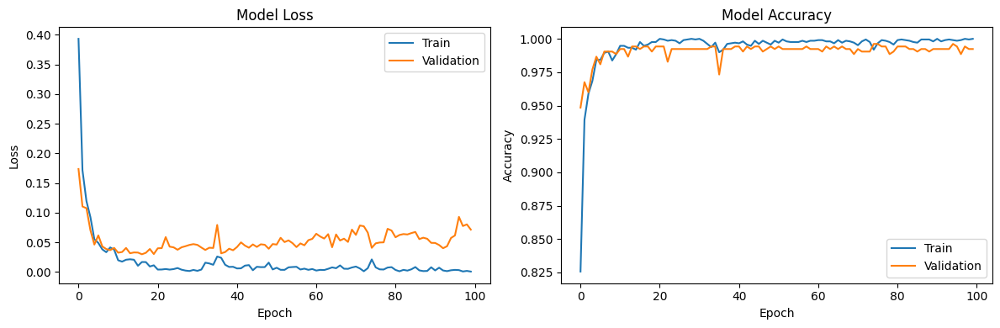

In [ ]:
#CNN2d Model is being used to train the model.
import os
import numpy as np
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from keras.utils import to_categorical

# Load your extracted features (2618, 1, 1024)
features_array = np.load('/content/drive/MyDrive/Challenge/extracted_features/features_base.npy')
labels_array = np.load('/content/drive/MyDrive/Challenge/extracted_features/labels_base.npy')

# Reshape the features into (2618, 32, 32, 1)
features_array_2d = features_array.reshape((2618, 32, 32, 1))

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(
    features_array_2d, labels_array, test_size=0.2, random_state=42)

# Convert labels to one-hot encoding
y_train = to_categorical(y_train)
y_val = to_categorical(y_val)

# Define the 2D CNN model
model = Sequential([
    Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(32, 32, 1)),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(len(np.unique(labels_array)), activation='softmax')
])

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=100, validation_data=(X_val, y_val))

# Evaluate the model
loss, accuracy = model.evaluate(X_val, y_val)
print(f"Validation Loss: {loss:.4f}, Validation Accuracy: {accuracy:.4f}")

#Plot training & Validation loss values
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

# Plot training & validation accuracy values
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='lower right')

plt.tight_layout()
plt.show()


In [ ]:
#Required Metric Evaluation
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt

# Save only the weights of the model
model.save_weights('/content/drive/MyDrive/Challenge/CNN2d.h5')

# Load your model and saved weights
model = Sequential([
    Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(32, 32, 1)),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(len(np.unique(labels_array)), activation='softmax')
])

model.load_weights('/content/drive/MyDrive/Challenge/CNN2d.h5')
# Predict on the validation data
y_pred = model.predict(X_val)
y_pred.shape


17/17 [==============================] - 0s 2ms/step


(524, 2)

In [ ]:
# Convert predicted probabilities to class labels (0 or 1)
y_pred_labels = np.argmax(y_pred, axis=1)
y_true_labels = np.argmax(y_val, axis=1)
y_pred_labels
y_true_labels.shape

(524,)

In [ ]:
# Calculate accuracy
accuracy = accuracy_score(y_true_labels, y_pred_labels)

# Calculate precision, recall, and F1 score
precision = precision_score(y_true_labels, y_pred_labels)
recall = recall_score(y_true_labels, y_pred_labels)
f1 = f1_score(y_true_labels, y_pred_labels)
# Calculate the confusion matrix
confusion = confusion_matrix(y_true_labels, y_pred_labels)
# Calculate ROC-AUC score and plot ROC curve
roc_auc = roc_auc_score(y_true_labels, y_pred_labels)
fpr, tpr, thresholds = roc_curve(y_true_labels, y_pred_labels)
roc_auc = auc(fpr, tpr)
# Print the metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall (Sensitivity): {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print("Confusion Matrix:")
print(confusion)
print(f"ROC AUC Score: {roc_auc:.4f}")

Accuracy: 0.9924
Precision: 0.9924
Recall (Sensitivity): 0.9924
F1 Score: 0.9924
Confusion Matrix:
[[259   2]
 [  2 261]]
ROC AUC Score: 0.9924


17/17 [==============================] - 0s 2ms/step


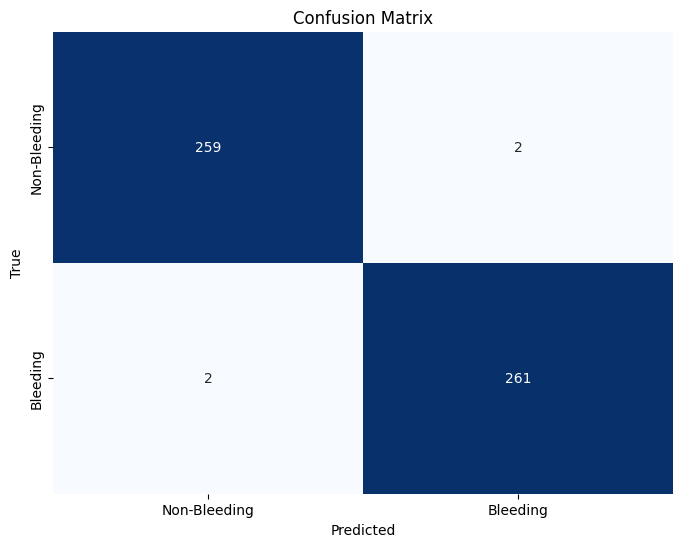

In [ ]:
#Confusion Matrix
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Predict on the validation data
y_pred = model.predict(X_val)

# Convert predicted probabilities to class labels (0 or 1)
y_pred_labels = np.argmax(y_pred, axis=1)
y_true_labels = np.argmax(y_val, axis=1)

# Calculate the confusion matrix
confusion = confusion_matrix(y_true_labels, y_pred_labels)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=["Non-Bleeding", "Bleeding"],
            yticklabels=["Non-Bleeding", "Bleeding"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

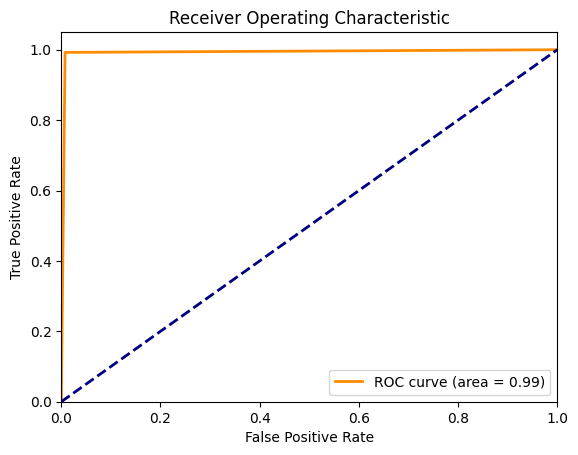

In [ ]:
#ROC AOC Curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [ ]:
#Kappa Score
from sklearn.metrics import cohen_kappa_score
# Calculate Cohen's Kappa
kappa = cohen_kappa_score(y_true_labels, y_pred_labels)

# Print the Kappa score
print(f"Cohen's Kappa Score: {kappa:.4f}")


Cohen's Kappa Score: 0.9847


In [ ]:
#Specificity
TN, FP, FN, TP = confusion.ravel()

# Calculate Specificity
specificity = TN / (TN + FP)

# Print the Specificity
print(f"Specificity: {specificity:.4f}")


Specificity: 0.9923


In [ ]:
#Using the saved model (CNN2d.h5), accurately predicting the image's label of Test Dataset 1 and saving it to the test_dataset_1_Predictions.xlsx
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
import pandas as pd

# Load the saved model
model = load_model('/content/drive/MyDrive/Challenge/CNNWithWeights2d.h5')

In [ ]:
# Define the path to your test dataset directory
test_dataset_dir = '/content/drive/MyDrive/Challenge/Test Dataset for Auto-WCEBleedGen Challenge version 2/Test Dataset 1'

# List all image files in the test dataset directory
test_image_files = [f for f in os.listdir(test_dataset_dir) if f.endswith('.png')]

# Initialize lists to store image names and predicted labels
image_names = []
predicted_labels = []

# Iterate over the test images, convert to grayscale, resize, make predictions, and store results
for image_file in test_image_files:
    # Load and preprocess the test image
    image_path = os.path.join(test_dataset_dir, image_file)
    img = cv2.imread(image_path)

    if img is not None:
        # Convert the image to grayscale
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Resize the image to 32x32 pixels
        img_gray = cv2.resize(img_gray, (32, 32))

        # Reshape to (32, 32, 1)
        img_gray = img_gray.reshape(32, 32, 1)

        # Make a prediction using the loaded model
        prediction = model.predict(np.expand_dims(img_gray, axis=0))

        # Determine the predicted label by selecting the class with the highest probability
        predicted_label = np.argmax(prediction, axis=1)

        # Map the class index to the corresponding label (e.g., 0 for non-bleeding, 1 for bleeding)
        if predicted_label == 0:
            label = "non-bleeding"
        else:
            label = "bleeding"

        # Append image name and predicted label to the lists
        image_names.append(image_file)
        predicted_labels.append(label)
    else:
        print(f"Image: {image_file}, Shape: Unable to read the image")

# Create a DataFrame to store the results
df = pd.DataFrame({'Image Name': image_names, 'Predicted Label': predicted_labels})

# Save the DataFrame to an Excel file
df.to_excel('/content/drive/MyDrive/Challenge/Prediction/predictions.xlsx', index=False)

print("Predictions saved to predictions.xlsx")

Predictions saved to predictions.xlsx


In [ ]:
#Using the saved model (CNNWithWeights2d.h5), accurately predicting the image's label of Validation dataset and saving it to the Predicted_images
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image

# Load the saved model
model = load_model('/content/drive/MyDrive/Challenge/CNNWithWeights2d.h5')

# Define the image directories
image_directory = '/content/drive/MyDrive/Challenge'

# Lists to store the file paths of predicted images, true labels, and predicted labels
predicted_images = []
true_labels = []
predicted_labels = []

# Process both bleeding and non-bleeding images
bleeding_directory = os.path.join(image_directory, '/content/drive/MyDrive/Challenge/WCEBleedGen (updated)/bleeding/Images')
non_bleeding_directory = os.path.join(image_directory, '/content/drive/MyDrive/Challenge/WCEBleedGen (updated)/non-bleeding/images')

# Create a folder to save the predicted images
output_folder = '/content/drive/MyDrive/ML_WCE_BleedGen/Predictions/predicted_images'
os.makedirs(output_folder, exist_ok=True)

# Function to make predictions on an image and get the label
def predict_image(image_path):
    img = image.load_img(image_path, target_size=(32, 32), color_mode="grayscale")  # Load as grayscale
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)

    prediction = model.predict(img)
    predicted_label = np.argmax(prediction)
    label = "Bleeding" if predicted_label == 1 else "Non-Bleeding"

    return label

# Process images and make predictions
for image_name in os.listdir(bleeding_directory):
    if image_name.endswith('.png'):
        image_path = os.path.join(bleeding_directory, image_name)
        predicted_images.append(image_path)
        true_labels.append("Bleeding")
        predicted_labels.append(predict_image(image_path))

for image_name in os.listdir(non_bleeding_directory):
    if image_name.endswith('.png'):
        image_path = os.path.join(non_bleeding_directory, image_name)
        predicted_images.append(image_path)
        true_labels.append("Non-Bleeding")
        predicted_labels.append(predict_image(image_path))

# Combine images, true labels, and predicted labels
predictions = list(zip(predicted_images, true_labels, predicted_labels))

# Sort by prediction confidence
predictions.sort(key=lambda x: x[2] == "Bleeding", reverse=True)

# Save the 10 best-predicted images with labels to the output folder
for i, (image_path, true_label, predicted_label) in enumerate(predictions[:10]):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    text = f"True Label: {true_label}, Predicted Label: {predicted_label}"

    # Add the text to the image
    img = cv2.putText(img, text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)

    output_path = os.path.join(output_folder, f'predicted_{i+1}.png')
    cv2.imwrite(output_path, img)

print("Predicted images with labels saved to the output folder.")

1/1 [==============================] - 0s 37ms/step
Predicted images with labels saved to the output folder.


In [ ]:
#Using the saved model (CNNWithWeights2d.h5), accurately predicting the image's label of Test Dataset 1  and saving it to the Predicted_test images
import cv2
import numpy as np
import random
import os
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the saved model
model = load_model('/content/drive/MyDrive/Challenge/CNNWithWeights2d.h5')  # Replace with the path to your saved model

test_dataset_path = '/content/drive/MyDrive/Challenge/Test Dataset for Auto-WCEBleedGen Challenge version 2/Test Dataset 1'

image_paths = [f for f in os.listdir(test_dataset_path) if f.endswith('.png')]

output_folder = '/content/drive/MyDrive/Challenge/Prediction/predicted_test_images'
os.makedirs(output_folder, exist_ok=True)

for i, image_path in enumerate(image_paths):
    # Load and preprocess the test image
    test_image_path = os.path.join(test_dataset_path, image_path)
    test_image = cv2.imread(test_image_path)
    test_image_rgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)  # Convert to RGB format for display

    # Make predictions using the model
    grayscale_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
    grayscale_image = cv2.resize(grayscale_image, (32, 32))  # Resize to model's input size
    grayscale_image = np.expand_dims(grayscale_image, axis=0)  # Add batch dimension
    prediction = model.predict(grayscale_image)
    predicted_label = "Bleeding" if np.argmax(prediction) == 1 else "Non-Bleeding"

    # Save the predicted images in the output folder
    output_path = os.path.join(output_folder, f'predicted_{i+1}.png')
    cv2.imwrite(output_path, cv2.cvtColor(test_image_rgb, cv2.COLOR_RGB2BGR))
print("Predicted images saved to the output folder.")


Predicted images saved to the output folder.


## Test dataset 2

In [ ]:
#Using the saved model (CNNWithWeights2d.h5), accurately predicting the image's label of Test Dataset 2  and saving it to the Predicted_test 2_images
import cv2
import numpy as np
import random
import os
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the saved model
model = load_model('/content/drive/MyDrive/Challenge/CNNWithWeights2d.h5')  # Replace with the path to your saved model

test_dataset_path = '/content/drive/MyDrive/Challenge/Test Dataset for Auto-WCEBleedGen Challenge version 2/Test Dataset 2'

image_paths = [f for f in os.listdir(test_dataset_path) if f.endswith('.png')]

output_folder = '/content/drive/MyDrive/Challenge/Prediction/predicted_test_2_images'
os.makedirs(output_folder, exist_ok=True)

for i, image_path in enumerate(image_paths):
    # Load and preprocess the test image
    test_image_path = os.path.join(test_dataset_path, image_path)
    test_image = cv2.imread(test_image_path)
    test_image_rgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)  # Convert to RGB format for display

    # Make predictions using the model
    grayscale_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
    grayscale_image = cv2.resize(grayscale_image, (32, 32))  # Resize to model's input size
    grayscale_image = np.expand_dims(grayscale_image, axis=0)  # Add batch dimension
    prediction = model.predict(grayscale_image)
    predicted_label = "Bleeding" if np.argmax(prediction) == 1 else "Non-Bleeding"

    # Save the predicted images in the output folder
    output_path = os.path.join(output_folder, f'predicted_{i+1}.png')
    cv2.imwrite(output_path, cv2.cvtColor(test_image_rgb, cv2.COLOR_RGB2BGR))
print("Predicted images saved to the output folder.")


Predicted images saved to the output folder.


## Cam plots

1/1 [==============================] - 3s 3s/step


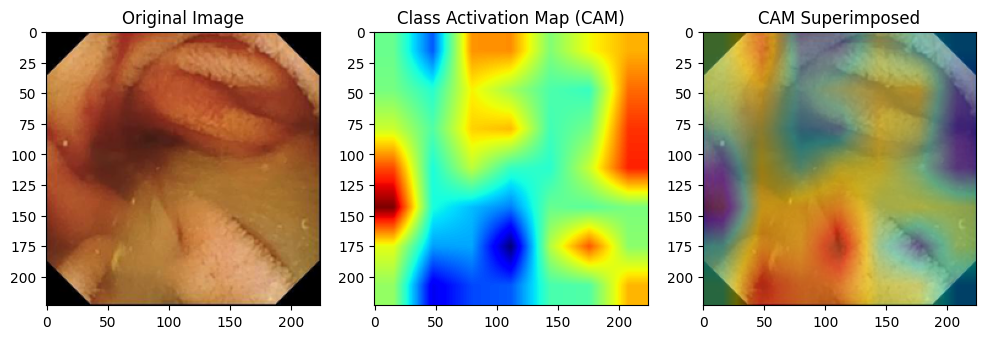

1/1 [==============================] - 3s 3s/step


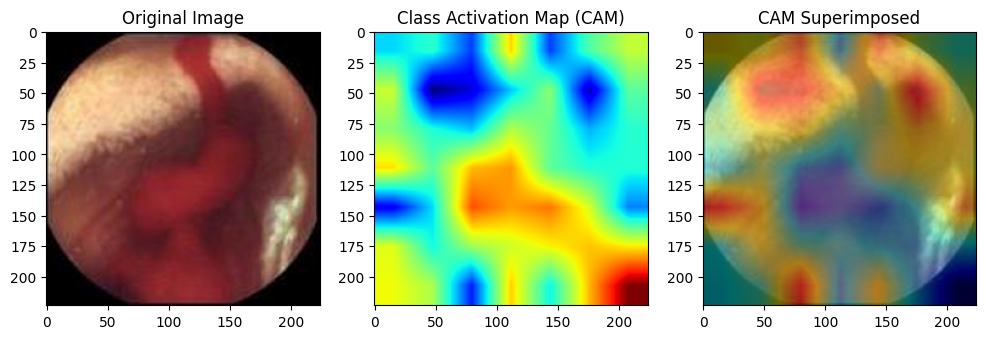

1/1 [==============================] - 2s 2s/step


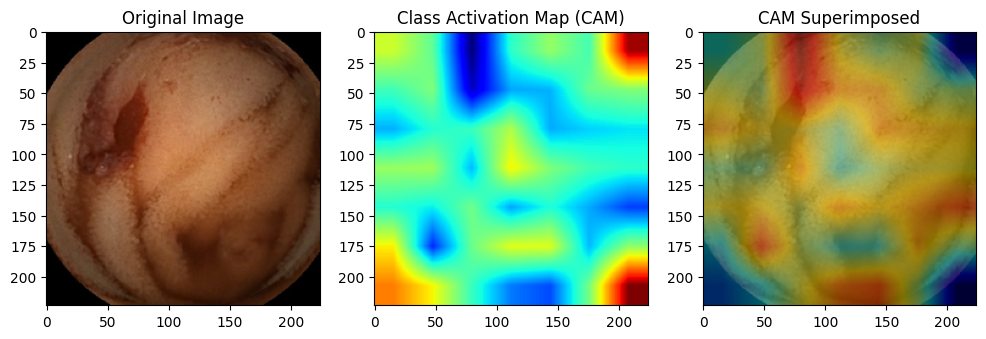

1/1 [==============================] - 2s 2s/step


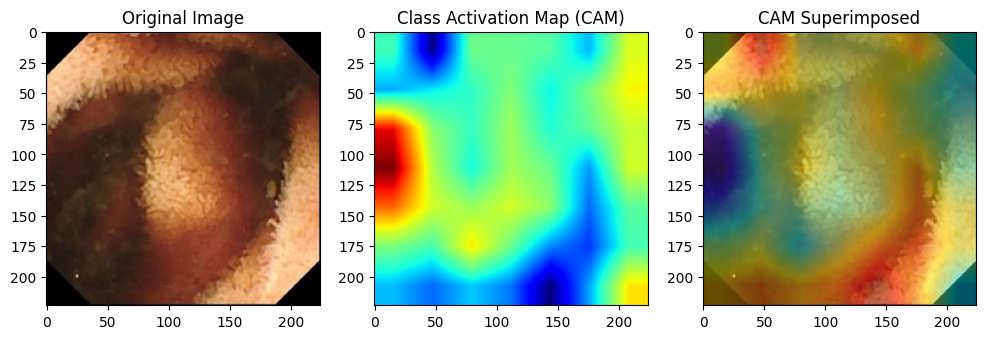

1/1 [==============================] - 2s 2s/step


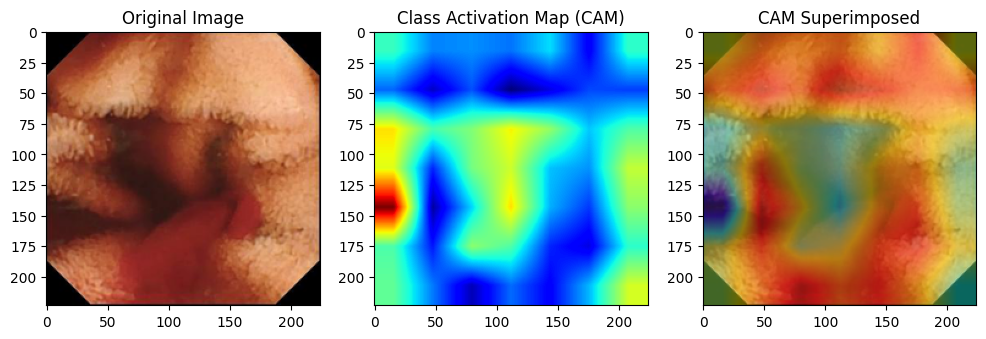

1/1 [==============================] - 2s 2s/step


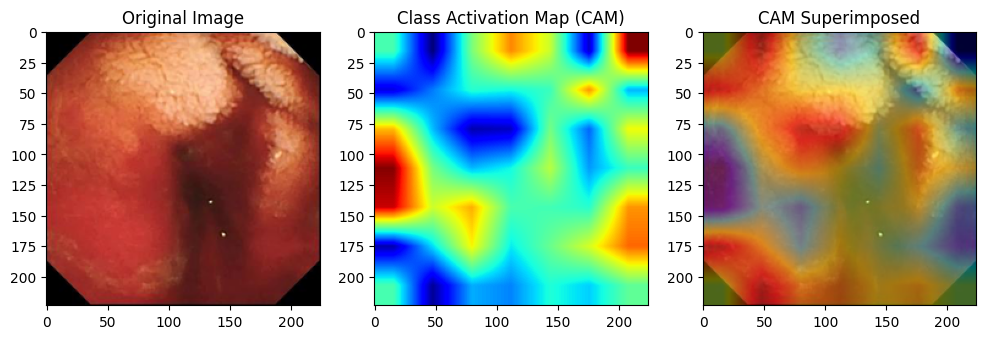

1/1 [==============================] - 4s 4s/step


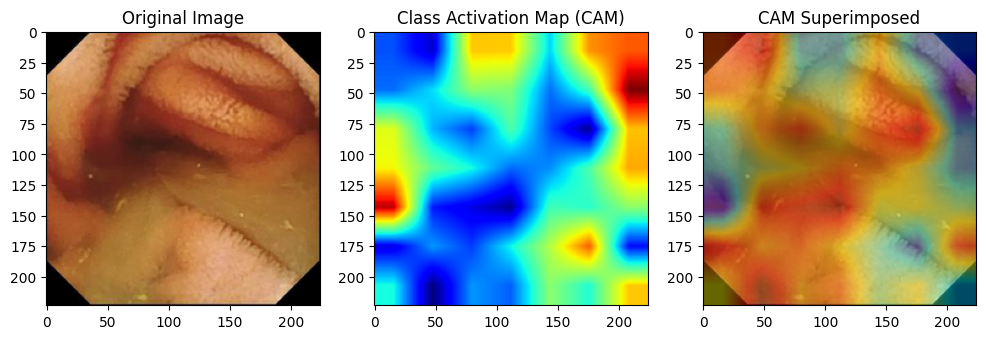

1/1 [==============================] - 2s 2s/step


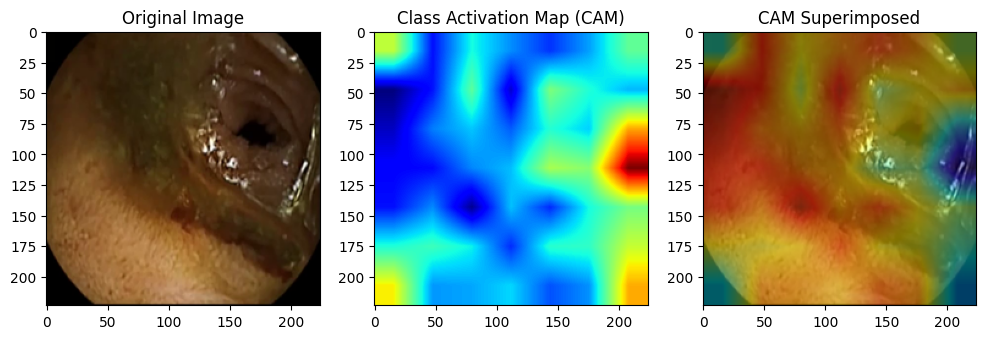

1/1 [==============================] - 2s 2s/step


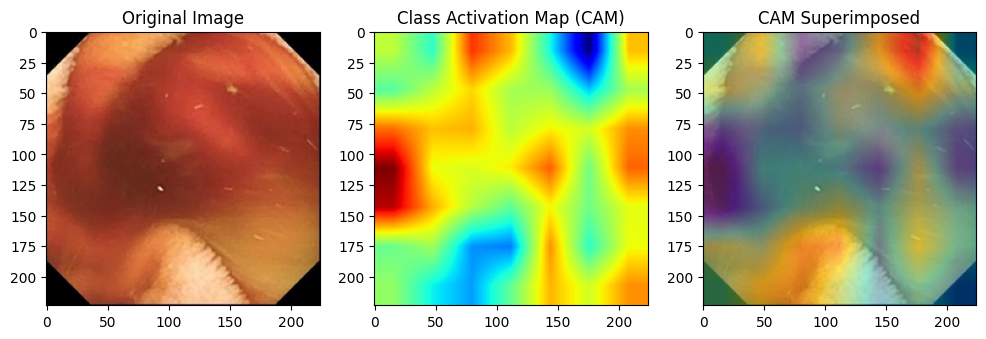

1/1 [==============================] - 2s 2s/step


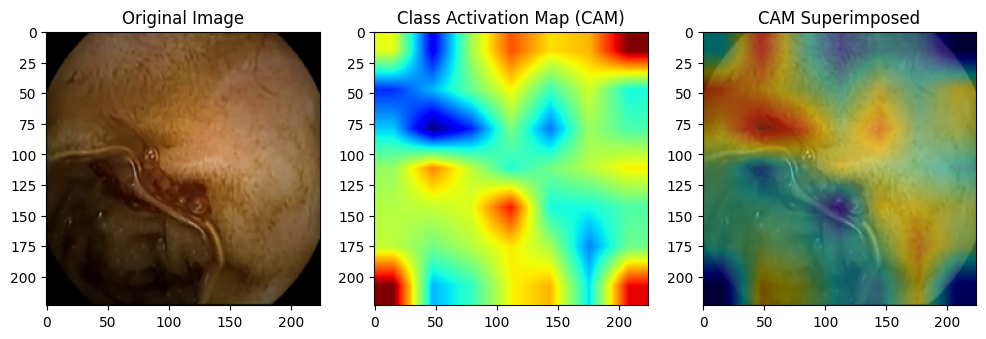

In [ ]:
#CAM plots for Validation and Test Dataset
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.densenet import preprocess_input, DenseNet121

# Load the DenseNet-121 model with pre-trained weights (excluding top classification layers)
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Function to compute CAM for a specific class index
def compute_CAM(model, image_path, class_idx):
    # Load and preprocess the image
    img = image.load_img(image_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    # Get the output of the final convolutional layer and the prediction
    final_conv_layer = model.get_layer('conv5_block16_concat')
    final_output_layer = model.get_layer('relu')

    # Create a model that extracts both the feature maps and predictions
    cam_model = Model(inputs=model.input, outputs=[final_conv_layer.output, final_output_layer.output])

    # Get feature maps and predictions
    features, preds = cam_model.predict(x)

    # Get the feature map for the class index
    class_activation_map = features[0, :, :, class_idx]

    # Normalize CAM
    cam = class_activation_map - np.min(class_activation_map)
    cam /= np.max(cam)

    # Resize CAM to match the image size
    cam = cv2.resize(cam, (224, 224))

    # Convert CAM to heatmap
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)

    # Overlay heatmap on the original image
    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    # Display the original image, CAM, and superimposed image
    plt.figure(figsize=(12, 4))
    plt.subplot(131)
    plt.imshow(img)
    plt.title('Original Image')

    plt.subplot(132)
    plt.imshow(cam, cmap='jet')
    plt.title('Class Activation Map (CAM)')

    plt.subplot(133)
    plt.imshow(superimposed_img)
    plt.title('CAM Superimposed')
    plt.show()

# Directory with bleeding images
bleeding_image_directory = '/content/drive/MyDrive/Challenge/WCEBleedGen (updated)/bleeding/Images'

# Choose 5 random images
import random
random.seed(42)  # Set seed for reproducibility
selected_images = random.sample(os.listdir(bleeding_image_directory), 10)

# Compute and display CAM for the selected images
for image_name in selected_images:
    image_path = os.path.join(bleeding_image_directory, image_name)
    compute_CAM(base_model, image_path, class_idx=1)

1/1 [==============================] - 3s 3s/step


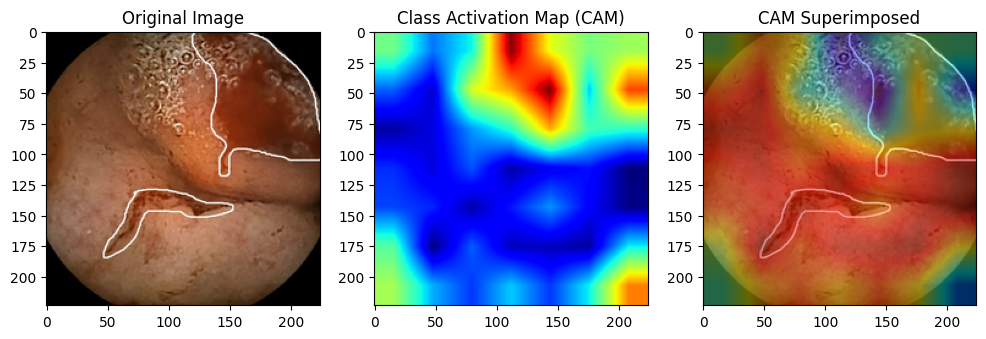

1/1 [==============================] - 2s 2s/step


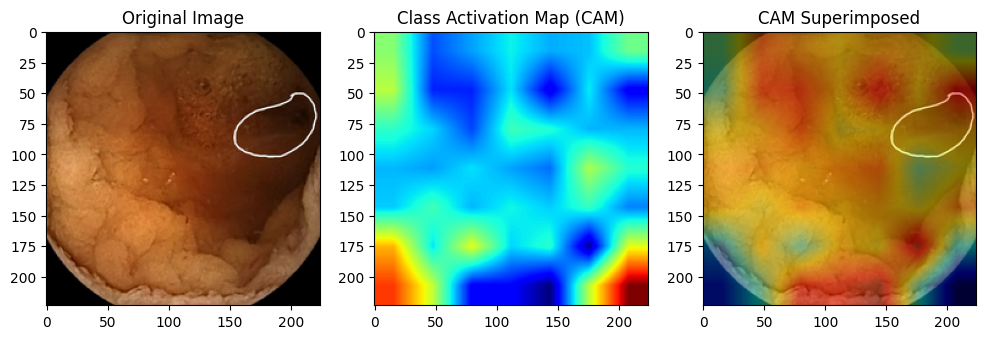

1/1 [==============================] - 2s 2s/step


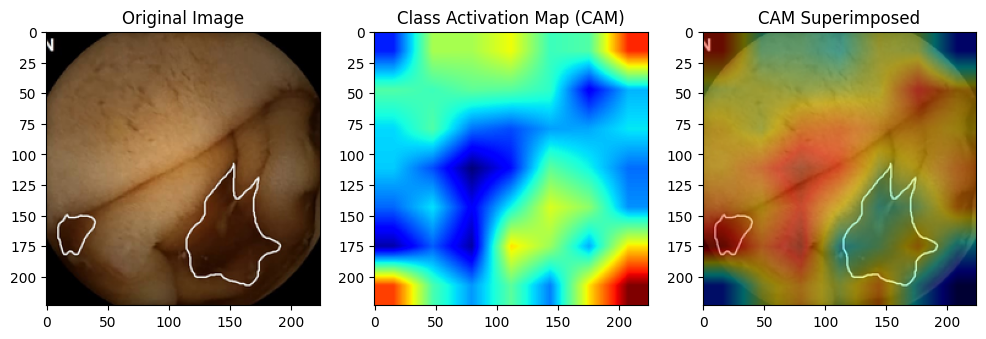

1/1 [==============================] - 2s 2s/step


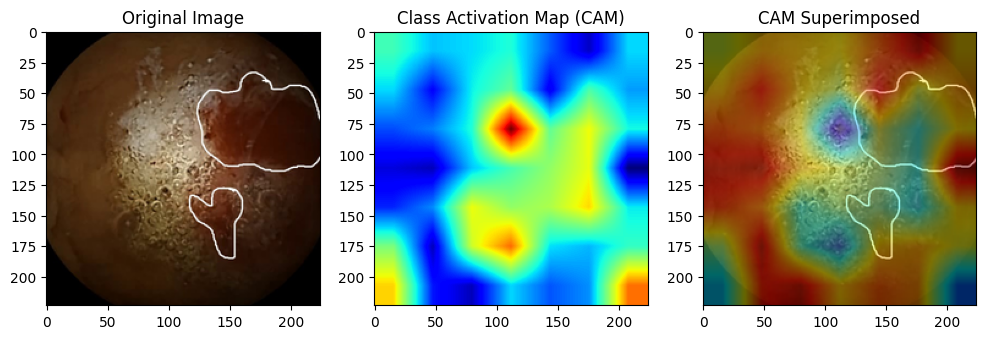

1/1 [==============================] - 2s 2s/step


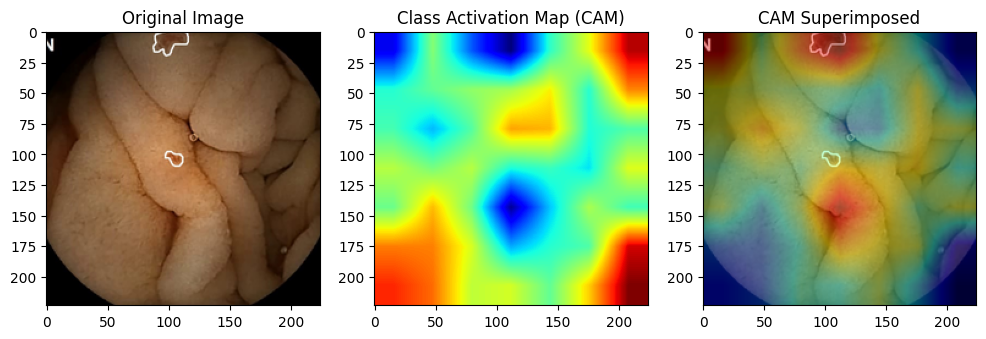

In [ ]:
#marked images Test Dataset 1
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.densenet import preprocess_input, DenseNet121

# Load the DenseNet-121 model with pre-trained weights (excluding top classification layers)
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Function to compute CAM for a specific class index
def compute_CAM(model, image_path, class_idx):
    # Load and preprocess the image
    img = image.load_img(image_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    # Get the output of the final convolutional layer and the prediction
    final_conv_layer = model.get_layer('conv5_block16_concat')
    final_output_layer = model.get_layer('relu')

    # Create a model that extracts both the feature maps and predictions
    cam_model = Model(inputs=model.input, outputs=[final_conv_layer.output, final_output_layer.output])

    # Get feature maps and predictions
    features, preds = cam_model.predict(x)

    # Get the feature map for the class index
    class_activation_map = features[0, :, :, class_idx]

    # Normalize CAM
    cam = class_activation_map - np.min(class_activation_map)
    cam /= np.max(cam)

    # Resize CAM to match the image size
    cam = cv2.resize(cam, (224, 224))

    # Convert CAM to heatmap
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)

    # Overlay heatmap on the original image
    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    # Display the original image, CAM, and superimposed image
    plt.figure(figsize=(12, 4))
    plt.subplot(131)
    plt.imshow(img)
    plt.title('Original Image')

    plt.subplot(132)
    plt.imshow(cam, cmap='jet')
    plt.title('Class Activation Map (CAM)')

    plt.subplot(133)
    plt.imshow(superimposed_img)
    plt.title('CAM Superimposed')
    plt.show()

# Directory with bleeding images
bleeding_image_directory = '/content/drive/MyDrive/Challenge/Test Dataset for Auto-WCEBleedGen Challenge version 2/Test Dataset 1/Marked Images'

# Choose 5 random images
import random
random.seed(42)  # Set seed for reproducibility
selected_images = random.sample(os.listdir(bleeding_image_directory), 5)

# Compute and display CAM for the selected images
for image_name in selected_images:
    image_path = os.path.join(bleeding_image_directory, image_name)
    compute_CAM(base_model, image_path, class_idx=1)

1/1 [==============================] - 3s 3s/step


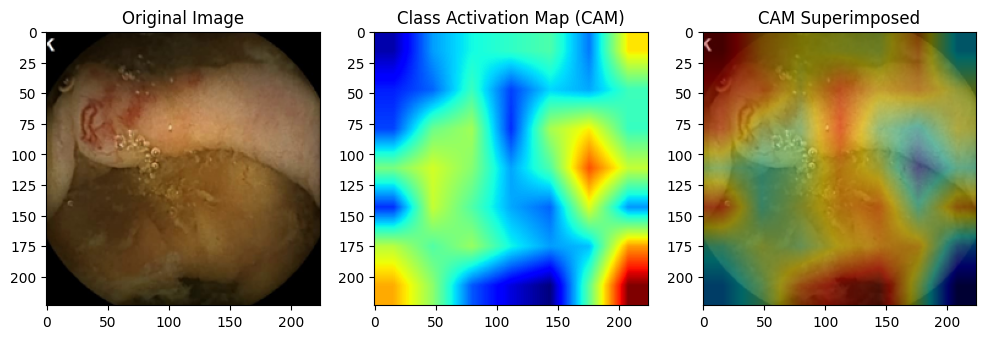

1/1 [==============================] - 2s 2s/step


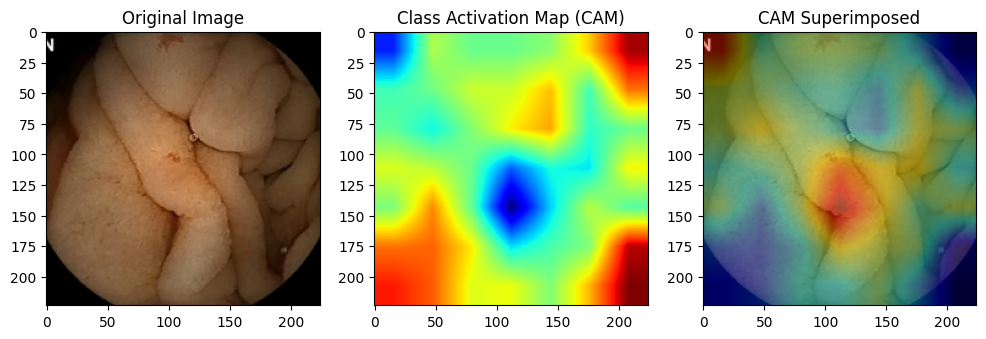

1/1 [==============================] - 2s 2s/step


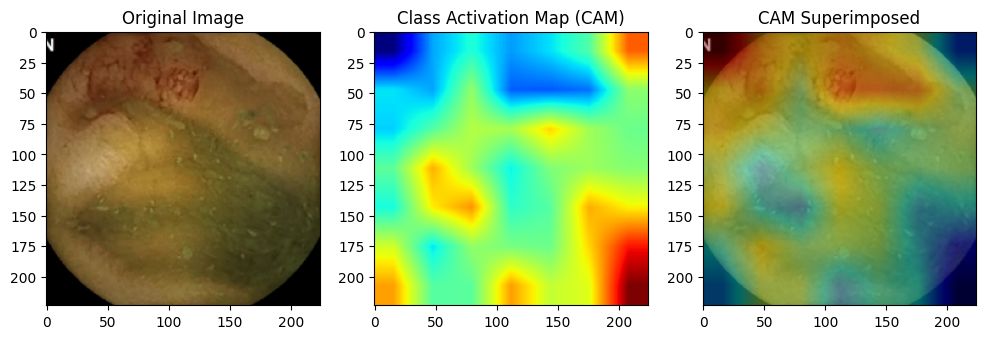

1/1 [==============================] - 2s 2s/step


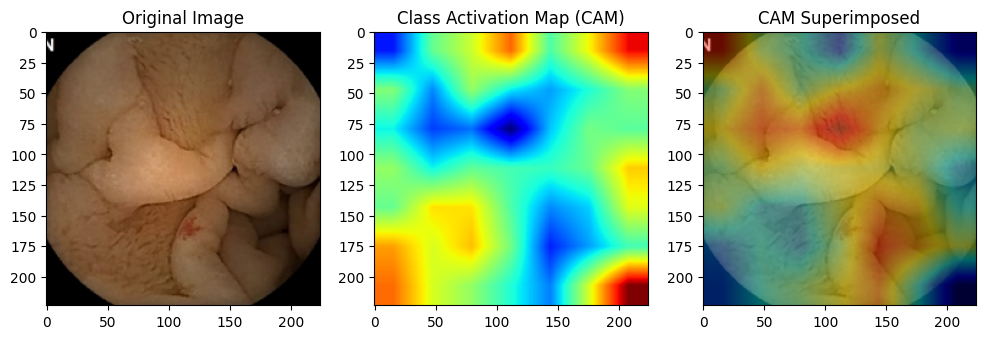

1/1 [==============================] - 2s 2s/step


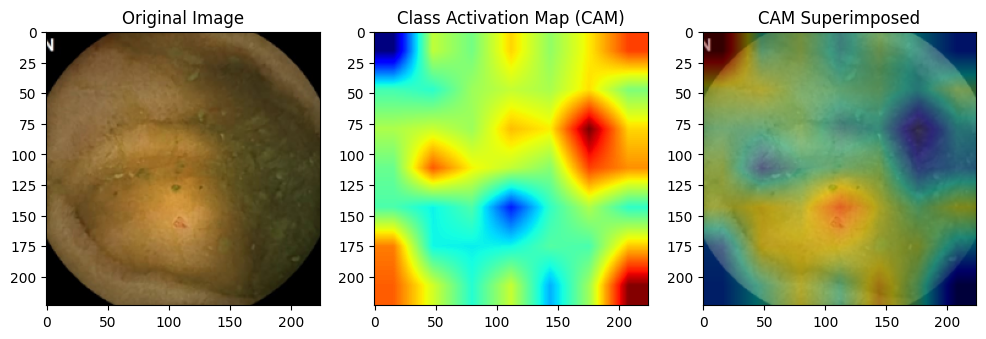

In [ ]:
#unmarked images Test Dataset 1
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.densenet import preprocess_input, DenseNet121

# Load the DenseNet-121 model with pre-trained weights (excluding top classification layers)
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Function to compute CAM for a specific class index
def compute_CAM(model, image_path, class_idx):
    # Load and preprocess the image
    img = image.load_img(image_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    # Get the output of the final convolutional layer and the prediction
    final_conv_layer = model.get_layer('conv5_block16_concat')
    final_output_layer = model.get_layer('relu')

    # Create a model that extracts both the feature maps and predictions
    cam_model = Model(inputs=model.input, outputs=[final_conv_layer.output, final_output_layer.output])

    # Get feature maps and predictions
    features, preds = cam_model.predict(x)

    # Get the feature map for the class index
    class_activation_map = features[0, :, :, class_idx]

    # Normalize CAM
    cam = class_activation_map - np.min(class_activation_map)
    cam /= np.max(cam)

    # Resize CAM to match the image size
    cam = cv2.resize(cam, (224, 224))

    # Convert CAM to heatmap
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)

    # Overlay heatmap on the original image
    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    # Display the original image, CAM, and superimposed image
    plt.figure(figsize=(12, 4))
    plt.subplot(131)
    plt.imshow(img)
    plt.title('Original Image')

    plt.subplot(132)
    plt.imshow(cam, cmap='jet')
    plt.title('Class Activation Map (CAM)')

    plt.subplot(133)
    plt.imshow(superimposed_img)
    plt.title('CAM Superimposed')
    plt.show()

# Directory with bleeding images
bleeding_image_directory = '/content/drive/MyDrive/Challenge/Test Dataset for Auto-WCEBleedGen Challenge version 2/Test Dataset 1/Unmarked Images'

# Choose 5 random images
import random
random.seed(42)  # Set seed for reproducibility
selected_images = random.sample(os.listdir(bleeding_image_directory), 5)

# Compute and display CAM for the selected images
for image_name in selected_images:
    image_path = os.path.join(bleeding_image_directory, image_name)
    compute_CAM(base_model, image_path, class_idx=1)

1/1 [==============================] - 2s 2s/step


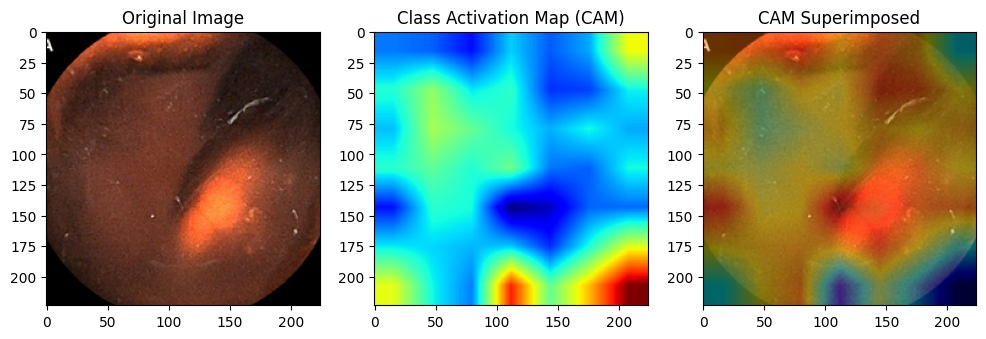

1/1 [==============================] - 2s 2s/step


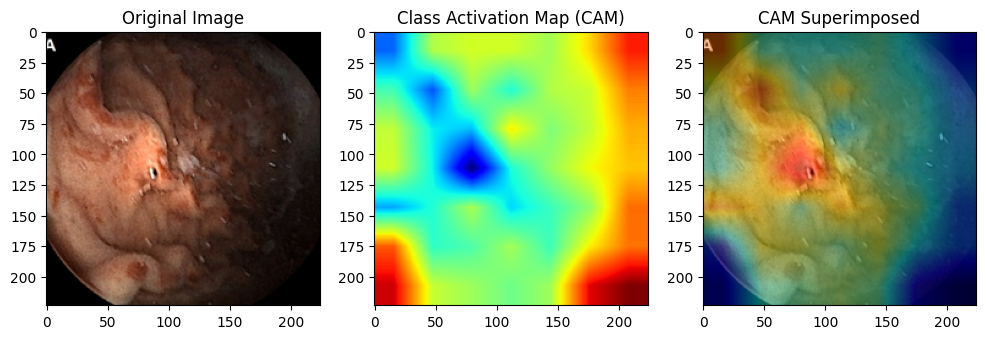

1/1 [==============================] - 2s 2s/step


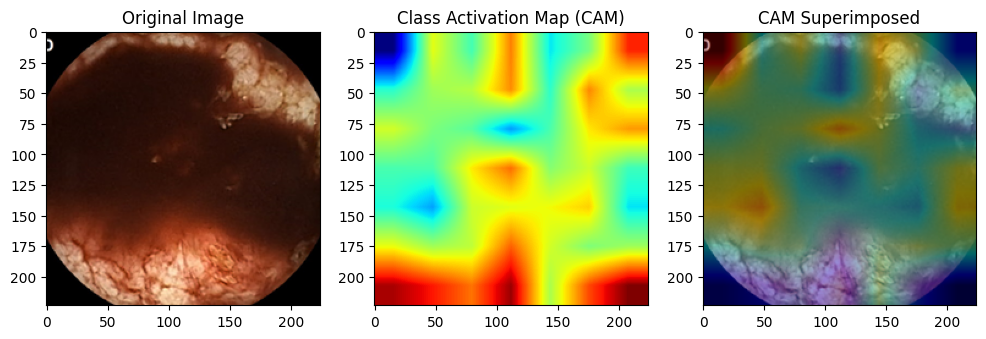

1/1 [==============================] - 2s 2s/step


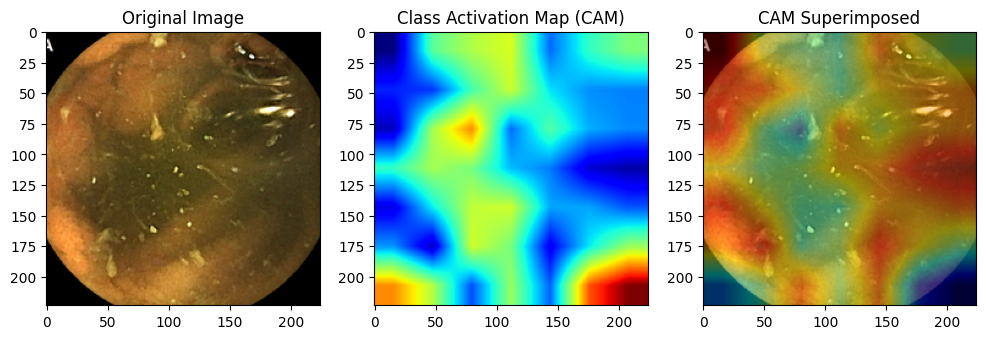

1/1 [==============================] - 3s 3s/step


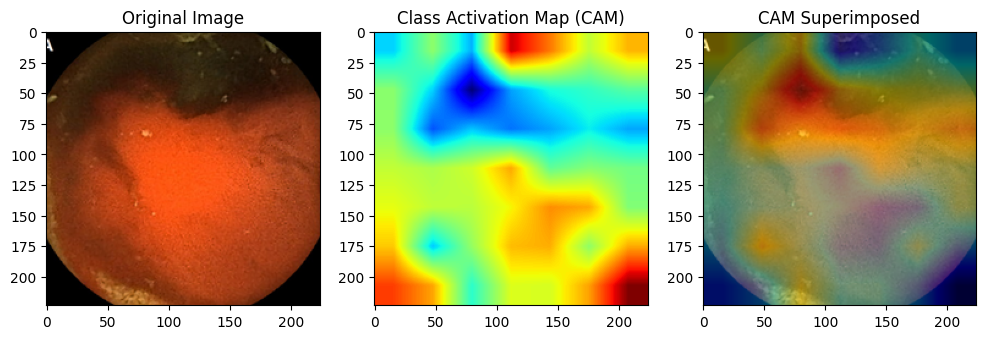

In [ ]:
#Test dataset2
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.densenet import preprocess_input, DenseNet121

# Load the DenseNet-121 model with pre-trained weights (excluding top classification layers)
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Function to compute CAM for a specific class index
def compute_CAM(model, image_path, class_idx):
    # Load and preprocess the image
    img = image.load_img(image_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    # Get the output of the final convolutional layer and the prediction
    final_conv_layer = model.get_layer('conv5_block16_concat')
    final_output_layer = model.get_layer('relu')

    # Create a model that extracts both the feature maps and predictions
    cam_model = Model(inputs=model.input, outputs=[final_conv_layer.output, final_output_layer.output])

    # Get feature maps and predictions
    features, preds = cam_model.predict(x)

    # Get the feature map for the class index
    class_activation_map = features[0, :, :, class_idx]

    # Normalize CAM
    cam = class_activation_map - np.min(class_activation_map)
    cam /= np.max(cam)

    # Resize CAM to match the image size
    cam = cv2.resize(cam, (224, 224))

    # Convert CAM to heatmap
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)

    # Overlay heatmap on the original image
    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    # Display the original image, CAM, and superimposed image
    plt.figure(figsize=(12, 4))
    plt.subplot(131)
    plt.imshow(img)
    plt.title('Original Image')

    plt.subplot(132)
    plt.imshow(cam, cmap='jet')
    plt.title('Class Activation Map (CAM)')

    plt.subplot(133)
    plt.imshow(superimposed_img)
    plt.title('CAM Superimposed')
    plt.show()

# Directory with bleeding images
bleeding_image_directory = '/content/drive/MyDrive/Challenge/Test Dataset for Auto-WCEBleedGen Challenge version 2/Test Dataset 2/Images'

# Choose 5 random images
import random
random.seed(42)  # Set seed for reproducibility
selected_images = random.sample(os.listdir(bleeding_image_directory), 5)

# Compute and display CAM for the selected images
for image_name in selected_images:
    image_path = os.path.join(bleeding_image_directory, image_name)
    compute_CAM(base_model, image_path, class_idx=1)

# بِسْمِ اللهِ الرَّحْمٰنِ الرَّحِيْمِ

# Segmentation

In [ ]:
# import glob
# import random
# import os
# import shutil

# PATH = '/content/drive/MyDrive/Challenge/WCEBleedGen (updated)/bleeding/'
# img_path = glob.glob(PATH + 'Images/*.png')
# labels = glob.glob(PATH + 'Bounding boxes/YOLO_TXT/*.txt')
# print("Image Paths:")
# print(img_path)
# print("Label Paths:")
# print(labels)
# print("Number of Images:", len(img_path))
# print("Number of Labels:", len(labels))
# # Define folder paths
# train_folder = '/content/drive/MyDrive/Challenge/segmentation/dataset/train'
# valid_folder = '/content/drive/MyDrive/Challenge/segmentation/dataset/valid'

# def move(paths, folder):
#   for p in paths:
#     shutil.move(p, folder)


# def split_dataset_yolo(img_path: str, labels: str, ratio: float = 0.8):
#     """
#     Splits the dataset into training and testing
#     :param img_path: Path to the images
#     :param labels: Path to the labels
#     :param ratio: Ratio of training to validation
#     :return: None
#     """
#     if not img_path:
#         print("Error: img_path list is empty")
#         return
#     if not labels:
#         print("Error: labels list is empty")
#         return
#     if len(img_path) != len(labels):
#         print("Error: img_path and labels lists have different lengths")
#         return

#     # Calculate number of files for training and validation
#     data_size = len(img_path)
#     train_size = int(data_size * ratio)

#     # Shuffle two lists
#     img_labels = list(zip(img_path, labels))
#     random.seed(43)
#     random.shuffle(img_labels)
#     img_paths, txt_paths = zip(*img_labels)


#     # Create the folder structure if it does not exist
#     for folder in [train_folder, valid_folder]:
#         for subfolder in ['images', 'labels']:
#             os.makedirs(os.path.join(folder, subfolder), exist_ok=True)

#     # Splitting
#     train_img_paths = img_paths[:train_size]
#     train_txt_paths = txt_paths[:train_size]

#     valid_img_paths = img_paths[train_size:]
#     valid_txt_paths = txt_paths[train_size:]

#     # Move images and labels to the respective folders
#     for src, dst in zip(train_img_paths, train_txt_paths):
#         move(src, os.path.join(train_folder, 'images'))
#         move(dst, os.path.join(train_folder, 'labels'))

#     for src, dst in zip(valid_img_paths, valid_txt_paths):
#         move(src, os.path.join(valid_folder, 'images'))
#         move(dst, os.path.join(valid_folder, 'labels'))


# split_dataset_yolo(img_path, labels)

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.6/755.6 kB 9.3 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)


In [ ]:
from ultralytics import YOLO

def train_and_save_model(config_path='/content/drive/MyDrive/Challenge/config.yaml', epochs=5, imgsz=224, save_path='/content/drive/MyDrive/TrainedModels'):
    model = YOLO('yolov8n.pt')
    results = model.train(data=config_path, epochs=epochs, imgsz=imgsz)
    model.save('/content/drive/MyDrive/Challenge')  # Save the trained model to the specified path
    return results


# Call the function with the desired configuration parameters
results = train_and_save_model()
print(results)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
from PIL import Image
import torch
from torchvision.transforms import functional as F
from matplotlib import pyplot as plt

# Load the trained model
model = YOLO('/content/yolov8n.pt')  # Replace 'path_to_trained_model.pt' with the actual path

# Define a function to perform inference on custom data
def test_custom_data(image_path):
    img = Image.open(image_path)  # Load the custom image
    img_tensor = F.to_tensor(img).unsqueeze(0)  # Convert the image to a tensor
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        results = model(img_tensor)  # Perform inference on the image
    return results

# Call the function to test the model on a custom image
custom_image_path = '/content/drive/MyDrive/Challenge/Test Dataset for Auto-WCEBleedGen Challenge version 2/Test Dataset 2/Images'  # Replace 'path_to_custom_image.jpg' with the actual path
detection_results = test_custom_data(custom_image_path)

# Visualize the detection results
results.show()  # Display the detection results


In [ ]:
# Create a directory for YOLOv6 if it doesn't exist and clone the YOLOv6 repository
! mkdir -p /content/drive/MyDrive/yolov6

In [ ]:
! git clone https://github.com/meituan/YOLOv6 /content/drive/MyDrive/yolov6

In [ ]:
# Change directory to the YOLOv6 folder
import os
os.chdir('/content/drive/MyDrive/yolov6')


# Install the required Python packages
! pip install -r requirements.txt


In [ ]:
# Download YOLOv6 weights
! wget https://github.com/meituan/YOLOv6/releases/download/0.4.0/yolov6s.pt


In [ ]:
# Import necessary libraries
import torch

# Check if CUDA is available and print the result
print(torch.cuda.is_available())

# Set the device to GPU if available, otherwise use CPU
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# Train YOLOv6 model
!python tools/train.py --batch 16 --conf configs/yolov6s_finetune.py --data /content/drive/MyDrive/Challenge/config.yaml --device 0 --epochs 100



In [ ]:
# Evaluate YOLOv6 model
! python tools/eval.py --data /content/drive/MyDrive/Challenge/config.yaml --weights /content/drive/MyDrive/yolov6/runs/detect/train/weights/best.pt --device 0

In [ ]:
# Import necessary libraries for the next sections
import os
import subprocess

# Paths to YOLOv6 weights, YAML file, and the list of source directories/files
weights_path = '/content/drive/MyDrive/yolov6/runs/detect/train/weights/best.pt'
yaml_path = '/content/drive/MyDrive/Challenge/config.yaml'

# Define source paths for the first dataset
source_paths_1 = [
    '/content/drive/MyDrive/Challenge/Test Dataset for Auto-WCEBleedGen Challenge version 2/Test Dataset 1',
    # Add more source paths as needed
]

# Device (0 for GPU, 'cpu' for CPU)
device = 0

# Loop through each source and run YOLOv6 inference for the first dataset
for source_path in source_paths_1:
    command = [
        'python', 'tools/infer.py',
        '--weights', weights_path,
        '--source', source_path,
        '--yaml', yaml_path,
        '--device', str(device)
    ]

    subprocess.run(command)

# Define source paths for the second dataset (if needed)
source_paths_2 = [
    '/content/drive/MyDrive/Challenge/SEGMENTATION/segmentation/dataset/valid/images',
    # Add more source paths as needed
]

# Loop through each source and run YOLOv6 inference for the second dataset (if needed)
for source_path in source_paths_2:
    command = [
        'python', 'tools/infer.py',
        '--weights', weights_path,
        '--source', source_path,
        '--yaml', yaml_path,
        '--device', str(device)
    ]

    subprocess.run(command)

# Define source paths for the third dataset (if needed)
source_paths_3 = [
    '/content/drive/MyDrive/Challenge/Test Dataset for Auto-WCEBleedGen Challenge version 2/Test Dataset 2',
    # Add more source paths as needed
]

# Loop through each source and run YOLOv6 inference for the third dataset (if needed)
for source_path in source_paths_3:
    command = [
        'python', 'tools/infer.py',
        '--weights', weights_path,
        '--source', source_path,
        '--yaml', yaml_path,
        '--device', str(device)
    ]

    subprocess.run(command)

In [ ]:
!cp -r /content/drive/MyDrive/yolov6/runs /content
